# NHL Game Prediction
***

## Table of Contents
- [1.0 - Python Coding Libraries](#10---python-coding-libraries)
- [1.1 - Importing Data](#11---importing-data)
- [1.2 - Data Cleaning](#12---data-cleaning)
- [1.3 - Feature Engineering](#13---feature-engineering)
- [2.0 - Home Team DataFrame](#20---home-team-dataframe)
- [2.1 - Away Team DataFrame](#21---away-team-dataframe)
- [2.2 - Home & Away Joined DataFrame](#22---home--away-joined-dataframe)
- [3.0 - DataFrame for Machine Learning](#30---dataframe-for-machine-learning)
- [3.1 - Logistic Classification](#31---logistic-classification)
- [3.2 - Random Forest](#32---random-forest)
- [3.3 - Neural Netowrk](#33---neural-networks)

### 1.0 - Python Coding Libraries

In [1]:
# Import libraries
import urllib.request
import json
import pandas as pd
import io
import numpy as np
import pandas as pd
from sklearn import preprocessing
import math
import tensorflow as tf
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, SimpleRNN, LSTM, GRU, Reshape, Activation
from sklearn.metrics import accuracy_score
np.random.seed(2)
tf.random.set_seed(2)

# Notebook display options
desired_width = 320
pd.set_option('display.width', desired_width)
np.set_printoptions(linewidth=desired_width)
pd.set_option('display.max_columns',300)

### 1.1 - Importing Data

In [2]:
# Function to return data from www.moneypuck.com
def api_call(url: str):
    """Returns the result of an API call."""
   
    user_agent = 'Mozilla/5.0 (Windows; U; Windows NT 5.1; en-US; rv:1.9.0.7) Gecko/2009021910 Firefox/3.0.7'
    headers= {'User-Agent': user_agent,} 

    request = urllib.request.Request(url, None, headers)
    response = urllib.request.urlopen(request)
    data = response.read()
    rawData = pd.read_csv(io.StringIO(data.decode('utf-8')))
    
    return rawData

In [3]:
# Importing the most recent data
url = 'https://moneypuck.com/moneypuck/playerData/careers/gameByGame/all_teams.csv'
rawData = api_call(url)
rawData.head()

,team,season,name,gameId,playerTeam,opposingTeam,home_or_away,gameDate,position,situation,xGoalsPercentage,corsiPercentage,fenwickPercentage,iceTime,xOnGoalFor,xGoalsFor,xReboundsFor,xFreezeFor,xPlayStoppedFor,xPlayContinuedInZoneFor,xPlayContinuedOutsideZoneFor,flurryAdjustedxGoalsFor,scoreVenueAdjustedxGoalsFor,flurryScoreVenueAdjustedxGoalsFor,shotsOnGoalFor,missedShotsFor,blockedShotAttemptsFor,shotAttemptsFor,goalsFor,reboundsFor,reboundGoalsFor,freezeFor,playStoppedFor,playContinuedInZoneFor,playContinuedOutsideZoneFor,savedShotsOnGoalFor,savedUnblockedShotAttemptsFor,penaltiesFor,penalityMinutesFor,faceOffsWonFor,hitsFor,takeawaysFor,giveawaysFor,lowDangerShotsFor,mediumDangerShotsFor,highDangerShotsFor,lowDangerxGoalsFor,mediumDangerxGoalsFor,highDangerxGoalsFor,lowDangerGoalsFor,mediumDangerGoalsFor,highDangerGoalsFor,scoreAdjustedShotsAttemptsFor,unblockedShotAttemptsFor,scoreAdjustedUnblockedShotAttemptsFor,dZoneGiveawaysFor,xGoalsFromxReboundsOfShotsFor,xGoalsFromActualReboundsOfShotsFor,reboundxGoalsFor,totalShotCreditFor,scoreAdjustedTotalShotCreditFor,scoreFlurryAdjustedTotalShotCreditFor,xOnGoalAgainst,xGoalsAgainst,xReboundsAgainst,xFreezeAgainst,xPlayStoppedAgainst,xPlayContinuedInZoneAgainst,xPlayContinuedOutsideZoneAgainst,flurryAdjustedxGoalsAgainst,scoreVenueAdjustedxGoalsAgainst,flurryScoreVenueAdjustedxGoalsAgainst,shotsOnGoalAgainst,missedShotsAgainst,blockedShotAttemptsAgainst,shotAttemptsAgainst,goalsAgainst,reboundsAgainst,reboundGoalsAgainst,freezeAgainst,playStoppedAgainst,playContinuedInZoneAgainst,playContinuedOutsideZoneAgainst,savedShotsOnGoalAgainst,savedUnblockedShotAttemptsAgainst,penaltiesAgainst,penalityMinutesAgainst,faceOffsWonAgainst,hitsAgainst,takeawaysAgainst,giveawaysAgainst,lowDangerShotsAgainst,mediumDangerShotsAgainst,highDangerShotsAgainst,lowDangerxGoalsAgainst,mediumDangerxGoalsAgainst,highDangerxGoalsAgainst,lowDangerGoalsAgainst,mediumDangerGoalsAgainst,highDangerGoalsAgainst,scoreAdjustedShotsAttemptsAgainst,unblockedShotAttemptsAgainst,scoreAdjustedUnblockedShotAttemptsAgainst,dZoneGiveawaysAgainst,xGoalsFromxReboundsOfShotsAgainst,xGoalsFromActualReboundsOfShotsAgainst,reboundxGoalsAgainst,totalShotCreditAgainst,scoreAdjustedTotalShotCreditAgainst,scoreFlurryAdjustedTotalShotCreditAgainst,playoffGame
0,NYR,2008,NYR,2008020001,NYR,T.B,AWAY,20081004,Team Level,other,0.0000,0.0000,0.0000,42.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.689,0.019,0.069,0.164,0.020,0.521,0.207,0.019,0.019,0.019,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.019,0.000,0.000,0.0,0.0,0.0,1.00,1.0,1.000,0.0,0.017,0.000,0.000,0.037,0.037,0.037,0
1,NYR,2008,NYR,2008020001,NYR,T.B,AWAY,20081004,Team Level,all,0.4596,0.6408,0.6310,3600.0,37.733,2.287,2.842,8.155,1.134,22.530,16.054,2.249,2.396,2.357,41.0,12.0,13.0,66.0,2.0,1.0,0.0,14.0,2.0,18.0,16.0,39.0,51.0,4.0,8.0,30.0,16.0,19.0,8.0,44.0,8.0,1.0,1.040,0.811,0.435,1.0,0.0,1.0,68.292,53.0,54.697,4.0,0.641,0.014,0.029,2.899,3.030,2.980,22.880,2.689,1.780,4.436,0.639,12.626,8.830,2.524,2.607,2.450,21.0,10.0,6.0,37.0,1.0,1.0,0.0,5.0,1.0,8.0,15.0,20.0,30.0,7.0,14.0,32.0,17.0,11.0,7.0,16.0,12.0,3.0,0.599,1.278,0.811,1.0,0.0,0.0,36.14,31.0,30.369,5.0,0.396,0.168,0.168,2.917,2.833,2.714,0
2,NYR,2008,NYR,2008020001,NYR,T.B,AWAY,20081004,Team Level,5on5,0.4857,0.6429,0.6364,2283.0,24.802,1.693,1.724,5.513,0.739,14.650,10.681,1.656,1.803,1.764,28.0,7.0,10.0,45.0,1.0,0.0,0.0,10.0,1.0,14.0,9.0,27.0,34.0,3.0,6.0,19.0,13.0,13.0,7.0,27.0,8.0,0.0,0.882,0.811,0.000,1.0,0.0,0.0,47.292,35.0,36.697,4.0,0.355,0.000,0.000,2.048,2.180,2.130,14.729,1.793,1.117,3.001,0.406,7.737,5.946,1.633,1.711,1.559,11.0,9.0,5.0,25.0,1.0,1.0,0.0,4.0,1.0,4.0,9.0,10.0,19.0,7.0,14.0,18.0,13.0,9.0,5.0,12.0,6.0,2.0,0.498,0.689,0.606,1.0,0.0,0.0,24.14,20.0,19.369

### 1.2 - Data Cleaning

In [4]:
def team_acronyms(df):
    """Function to fix duplicate acronyms for same team."""

    # Replacing duplicate team name acronyms
    df['opposingTeam'].replace({'S.J': 'SJS'}, inplace = True)
    df['opposingTeam'].replace({'N.J': 'NJD'}, inplace = True)
    df['opposingTeam'].replace({'T.B': 'TBL'}, inplace = True)
    df['opposingTeam'].replace({'L.A': 'LAK'}, inplace = True)
    df['opposingTeam'].replace({'ATL': 'WPG'}, inplace = True)

    df['team'].replace({'S.J': 'SJS'}, inplace = True)
    df['team'].replace({'N.J': 'NJD'}, inplace = True)
    df['team'].replace({'T.B': 'TBL'}, inplace = True)
    df['team'].replace({'L.A': 'LAK'}, inplace = True)
    df['team'].replace({'ATL': 'WPG'}, inplace = True)

    df['name'].replace({'S.J': 'SJS'}, inplace = True)
    df['name'].replace({'N.J': 'NJD'}, inplace = True)
    df['name'].replace({'T.B': 'TBL'}, inplace = True)
    df['name'].replace({'L.A': 'LAK'}, inplace = True)
    df['name'].replace({'ATL': 'WPG'}, inplace = True)

    df['playerTeam'].replace({'S.J': 'SJS'}, inplace = True)
    df['playerTeam'].replace({'N.J': 'NJD'}, inplace = True)
    df['playerTeam'].replace({'T.B': 'TBL'}, inplace = True)
    df['playerTeam'].replace({'L.A': 'LAK'}, inplace = True)
    df['playerTeam'].replace({'ATL': 'WPG'}, inplace = True)
    
    cleanData = df
    
    return cleanData

In [5]:
# Cleaning the rawData
cleanData = team_acronyms(rawData)
cleanData.head()

,team,season,name,gameId,playerTeam,opposingTeam,home_or_away,gameDate,position,situation,xGoalsPercentage,corsiPercentage,fenwickPercentage,iceTime,xOnGoalFor,xGoalsFor,xReboundsFor,xFreezeFor,xPlayStoppedFor,xPlayContinuedInZoneFor,xPlayContinuedOutsideZoneFor,flurryAdjustedxGoalsFor,scoreVenueAdjustedxGoalsFor,flurryScoreVenueAdjustedxGoalsFor,shotsOnGoalFor,missedShotsFor,blockedShotAttemptsFor,shotAttemptsFor,goalsFor,reboundsFor,reboundGoalsFor,freezeFor,playStoppedFor,playContinuedInZoneFor,playContinuedOutsideZoneFor,savedShotsOnGoalFor,savedUnblockedShotAttemptsFor,penaltiesFor,penalityMinutesFor,faceOffsWonFor,hitsFor,takeawaysFor,giveawaysFor,lowDangerShotsFor,mediumDangerShotsFor,highDangerShotsFor,lowDangerxGoalsFor,mediumDangerxGoalsFor,highDangerxGoalsFor,lowDangerGoalsFor,mediumDangerGoalsFor,highDangerGoalsFor,scoreAdjustedShotsAttemptsFor,unblockedShotAttemptsFor,scoreAdjustedUnblockedShotAttemptsFor,dZoneGiveawaysFor,xGoalsFromxReboundsOfShotsFor,xGoalsFromActualReboundsOfShotsFor,reboundxGoalsFor,totalShotCreditFor,scoreAdjustedTotalShotCreditFor,scoreFlurryAdjustedTotalShotCreditFor,xOnGoalAgainst,xGoalsAgainst,xReboundsAgainst,xFreezeAgainst,xPlayStoppedAgainst,xPlayContinuedInZoneAgainst,xPlayContinuedOutsideZoneAgainst,flurryAdjustedxGoalsAgainst,scoreVenueAdjustedxGoalsAgainst,flurryScoreVenueAdjustedxGoalsAgainst,shotsOnGoalAgainst,missedShotsAgainst,blockedShotAttemptsAgainst,shotAttemptsAgainst,goalsAgainst,reboundsAgainst,reboundGoalsAgainst,freezeAgainst,playStoppedAgainst,playContinuedInZoneAgainst,playContinuedOutsideZoneAgainst,savedShotsOnGoalAgainst,savedUnblockedShotAttemptsAgainst,penaltiesAgainst,penalityMinutesAgainst,faceOffsWonAgainst,hitsAgainst,takeawaysAgainst,giveawaysAgainst,lowDangerShotsAgainst,mediumDangerShotsAgainst,highDangerShotsAgainst,lowDangerxGoalsAgainst,mediumDangerxGoalsAgainst,highDangerxGoalsAgainst,lowDangerGoalsAgainst,mediumDangerGoalsAgainst,highDangerGoalsAgainst,scoreAdjustedShotsAttemptsAgainst,unblockedShotAttemptsAgainst,scoreAdjustedUnblockedShotAttemptsAgainst,dZoneGiveawaysAgainst,xGoalsFromxReboundsOfShotsAgainst,xGoalsFromActualReboundsOfShotsAgainst,reboundxGoalsAgainst,totalShotCreditAgainst,scoreAdjustedTotalShotCreditAgainst,scoreFlurryAdjustedTotalShotCreditAgainst,playoffGame
0,NYR,2008,NYR,2008020001,NYR,TBL,AWAY,20081004,Team Level,other,0.0000,0.0000,0.0000,42.0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.000,0.0,0.000,0.0,0.000,0.000,0.000,0.000,0.000,0.000,0.689,0.019,0.069,0.164,0.020,0.521,0.207,0.019,0.019,0.019,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.019,0.000,0.000,0.0,0.0,0.0,1.00,1.0,1.000,0.0,0.017,0.000,0.000,0.037,0.037,0.037,0
1,NYR,2008,NYR,2008020001,NYR,TBL,AWAY,20081004,Team Level,all,0.4596,0.6408,0.6310,3600.0,37.733,2.287,2.842,8.155,1.134,22.530,16.054,2.249,2.396,2.357,41.0,12.0,13.0,66.0,2.0,1.0,0.0,14.0,2.0,18.0,16.0,39.0,51.0,4.0,8.0,30.0,16.0,19.0,8.0,44.0,8.0,1.0,1.040,0.811,0.435,1.0,0.0,1.0,68.292,53.0,54.697,4.0,0.641,0.014,0.029,2.899,3.030,2.980,22.880,2.689,1.780,4.436,0.639,12.626,8.830,2.524,2.607,2.450,21.0,10.0,6.0,37.0,1.0,1.0,0.0,5.0,1.0,8.0,15.0,20.0,30.0,7.0,14.0,32.0,17.0,11.0,7.0,16.0,12.0,3.0,0.599,1.278,0.811,1.0,0.0,0.0,36.14,31.0,30.369,5.0,0.396,0.168,0.168,2.917,2.833,2.714,0
2,NYR,2008,NYR,2008020001,NYR,TBL,AWAY,20081004,Team Level,5on5,0.4857,0.6429,0.6364,2283.0,24.802,1.693,1.724,5.513,0.739,14.650,10.681,1.656,1.803,1.764,28.0,7.0,10.0,45.0,1.0,0.0,0.0,10.0,1.0,14.0,9.0,27.0,34.0,3.0,6.0,19.0,13.0,13.0,7.0,27.0,8.0,0.0,0.882,0.811,0.000,1.0,0.0,0.0,47.292,35.0,36.697,4.0,0.355,0.000,0.000,2.048,2.180,2.130,14.729,1.793,1.117,3.001,0.406,7.737,5.946,1.633,1.711,1.559,11.0,9.0,5.0,25.0,1.0,1.0,0.0,4.0,1.0,4.0,9.0,10.0,19.0,7.0,14.0,18.0,13.0,9.0,5.0,12.0,6.0,2.0,0.498,0.689,0.606,1.0,0.0,0.0,24.14,20.0,19.369

### 1.3 - Feature Engineering

In [6]:
def feat_eng(df):

    # Adding columns
    shootout_game = np.where((df['situation'] == 'all') & (df['goalsFor'] == df['goalsAgainst']), 1, 0)
    df.insert(loc = 6, column = 'Shootout Game', value = shootout_game)

    ot_game = np.where(df['iceTime'] > 3600.0, 1, 0)
    df.insert(loc = 7, column = 'OT Game', value = ot_game)

    win = np.where(df['goalsFor'] > df['goalsAgainst'], 1, 0)
    df.insert(loc = 8, column = 'Win', value = win)

    loss = np.where((df['OT Game'] == 0) & (df['goalsFor'] < df['goalsAgainst']), 1, 0)
    df.insert(loc = 9, column = 'Loss', value = loss)

    # ot_loss = np.where((df['OT Game'] == 1) & (df['goalsFor'] < df['goalsAgainst']), 1, 0)
    # df.insert(loc = 10, column = 'OT Loss', value = ot_loss)

    # Adding date columns
    df['gameDate'] = pd.to_datetime(df['gameDate'],format='%Y%m%d')
    df['year'] = pd.DatetimeIndex(df['gameDate']).year
    df['month'] = pd.DatetimeIndex(df['gameDate']).month
    df['day'] = pd.DatetimeIndex(df['gameDate']).day

    # Adding columns to be numerical
    le = preprocessing.LabelEncoder()
    df['home_or_away#'] = le.fit_transform(df['home_or_away'])
    df['team#'] = le.fit_transform(df['team'])
    df['opposingTeam#'] = le.fit_transform(df['opposingTeam'])

    # Slicing the data
    df = df[df['situation'] == 'all']
    df = df[df['season'] >= 2018]
    df = df[df['playoffGame'] == 0]
    df = df[df['Shootout Game'] == 0]
    df = df[df['OT Game'] == 0]

    return df

In [7]:
# Feature Engineering using the cleanData
df = feat_eng(cleanData)
df = df.sort_values('gameId')
df.head()

,team,season,name,gameId,playerTeam,opposingTeam,Shootout Game,OT Game,Win,Loss,home_or_away,gameDate,position,situation,xGoalsPercentage,corsiPercentage,fenwickPercentage,iceTime,xOnGoalFor,xGoalsFor,xReboundsFor,xFreezeFor,xPlayStoppedFor,xPlayContinuedInZoneFor,xPlayContinuedOutsideZoneFor,flurryAdjustedxGoalsFor,scoreVenueAdjustedxGoalsFor,flurryScoreVenueAdjustedxGoalsFor,shotsOnGoalFor,missedShotsFor,blockedShotAttemptsFor,shotAttemptsFor,goalsFor,reboundsFor,reboundGoalsFor,freezeFor,playStoppedFor,playContinuedInZoneFor,playContinuedOutsideZoneFor,savedShotsOnGoalFor,savedUnblockedShotAttemptsFor,penaltiesFor,penalityMinutesFor,faceOffsWonFor,hitsFor,takeawaysFor,giveawaysFor,lowDangerShotsFor,mediumDangerShotsFor,highDangerShotsFor,lowDangerxGoalsFor,mediumDangerxGoalsFor,highDangerxGoalsFor,lowDangerGoalsFor,mediumDangerGoalsFor,highDangerGoalsFor,scoreAdjustedShotsAttemptsFor,unblockedShotAttemptsFor,scoreAdjustedUnblockedShotAttemptsFor,dZoneGiveawaysFor,xGoalsFromxReboundsOfShotsFor,xGoalsFromActualReboundsOfShotsFor,reboundxGoalsFor,totalShotCreditFor,scoreAdjustedTotalShotCreditFor,scoreFlurryAdjustedTotalShotCreditFor,xOnGoalAgainst,xGoalsAgainst,xReboundsAgainst,xFreezeAgainst,xPlayStoppedAgainst,xPlayContinuedInZoneAgainst,xPlayContinuedOutsideZoneAgainst,flurryAdjustedxGoalsAgainst,scoreVenueAdjustedxGoalsAgainst,flurryScoreVenueAdjustedxGoalsAgainst,shotsOnGoalAgainst,missedShotsAgainst,blockedShotAttemptsAgainst,shotAttemptsAgainst,goalsAgainst,reboundsAgainst,reboundGoalsAgainst,freezeAgainst,playStoppedAgainst,playContinuedInZoneAgainst,playContinuedOutsideZoneAgainst,savedShotsOnGoalAgainst,savedUnblockedShotAttemptsAgainst,penaltiesAgainst,penalityMinutesAgainst,faceOffsWonAgainst,hitsAgainst,takeawaysAgainst,giveawaysAgainst,lowDangerShotsAgainst,mediumDangerShotsAgainst,highDangerShotsAgainst,lowDangerxGoalsAgainst,mediumDangerxGoalsAgainst,highDangerxGoalsAgainst,lowDangerGoalsAgainst,mediumDangerGoalsAgainst,highDangerGoalsAgainst,scoreAdjustedShotsAttemptsAgainst,unblockedShotAttemptsAgainst,scoreAdjustedUnblockedShotAttemptsAgainst,dZoneGiveawaysAgainst,xGoalsFromxReboundsOfShotsAgainst,xGoalsFromActualReboundsOfShotsAgainst,reboundxGoalsAgainst,totalShotCreditAgainst,scoreAdjustedTotalShotCreditAgainst,scoreFlurryAdjustedTotalShotCreditAgainst,playoffGame,year,month,day,home_or_away#,team#,opposingTeam#
115611,WSH,2018,WSH,2018020002,WSH,BOS,0,0,1,0,HOME,2018-10-03,Team Level,all,0.7221,0.5470,0.5778,3600.0,38.169,2.773,2.654,8.350,1.113,20.711,16.398,2.700,2.803,2.729,37.0,15.0,12.0,64.0,7.0,0.0,0.0,11.0,0.0,17.0,17.0,30.0,45.0,4.0,14.0,19.0,16.0,13.0,10.0,44.0,6.0,2.0,1.590,0.682,0.501,4.0,3.0,0.0,67.936,52.0,53.457,6.0,0.592,0.000,0.000,3.365,3.400,3.311,26.435,1.067,1.425,6.707,0.874,14.755,13.171,1.065,1.051,1.048,25.0,13.0,15.0,53.0,0.0,0.0,0.0,6.0,0.0,13.0,19.0,25.0,38.0,8.0,22.0,41.0,28.0,5.0,3.0,35.0,2.0,1.0,0.555,0.297,0.216,0.0,0.0,0.0,49.177,38.0,36.583,2.0,0.296,0.000,0.000,1.363,1.341,1.338,0,2018,10,3,1,31,2
146221,BOS,2018,BOS,2018020002,BOS,WSH,0,0,0,1,AWAY,2018-10-03,Team Level,all,0.2779,0.4530,0.4222,3600.0,26.435,1.067,1.425,6.707,0.874,14.755,13.171,1.065,1.051,1.048,25.0,13.0,15.0,53.0,0.0,0.0,0.0,6.0,0.0,13.0,19.0,25.0,38.0,8.0,22.0,41.0,28.0,5.0,3.0,35.0,2.0,1.0,0.555,0.297,0.216,0.0,0.0,0.0,49.177,38.0,36.583,2.0,0.296,0.000,0.000,1.363,1.341,1.338,38.169,2.773,2.654,8.350,1.113,20.711,16.398,2.700,2.803,2.729,37.0,15.0,12.0,64.0,7.0,0.0,0.0,11.0,0.0,17.0,17.0,30.0,45.0,4.0,14.0,19.0,16.0,13.0,10.0,44.0,6.0,2.0,1.590,0.682,0.501,4.0,3.0,0.0,67.936,52.0,53.457,6.0,0.592,0.000,0.000,3.365,3.400,3.311,0,2018,10,3,0,2,31
158321,VAN,2018,VAN,2018020003,VAN,CGY,0,0,1,0,HOME,2018-10-03,Team Level,all,0.4984,0.3178,0.3373,3600.0,21.082,3.183,1.705,4.693,0.694,9.362,8.364,3.022,3.193,3.031,23.0,5.0,6.0,34.0,5.0,4.0,1.0,7.0,0.0,4.0,8.0,18.0,23.0,8.0,19.0,25.0,16.0,7.0,9.0,14.0,9.0,5.0,0.474,1.189,1.520,1.0,1.0,3.0,34.922,28.0,28.733,5.0,0.385,0.701,0.701,2.868,2.867,2.810,39.927,

### 2.0 - Home Team DataFrame

In [8]:
home_mask = df.home_or_away == 'HOME'
home_df = pd.DataFrame()
home_df = home_df.append(df.loc[home_mask])
home_df.head(10)

,team,season,name,gameId,playerTeam,opposingTeam,Shootout Game,OT Game,Win,Loss,home_or_away,gameDate,position,situation,xGoalsPercentage,corsiPercentage,fenwickPercentage,iceTime,xOnGoalFor,xGoalsFor,xReboundsFor,xFreezeFor,xPlayStoppedFor,xPlayContinuedInZoneFor,xPlayContinuedOutsideZoneFor,flurryAdjustedxGoalsFor,scoreVenueAdjustedxGoalsFor,flurryScoreVenueAdjustedxGoalsFor,shotsOnGoalFor,missedShotsFor,blockedShotAttemptsFor,shotAttemptsFor,goalsFor,reboundsFor,reboundGoalsFor,freezeFor,playStoppedFor,playContinuedInZoneFor,playContinuedOutsideZoneFor,savedShotsOnGoalFor,savedUnblockedShotAttemptsFor,penaltiesFor,penalityMinutesFor,faceOffsWonFor,hitsFor,takeawaysFor,giveawaysFor,lowDangerShotsFor,mediumDangerShotsFor,highDangerShotsFor,lowDangerxGoalsFor,mediumDangerxGoalsFor,highDangerxGoalsFor,lowDangerGoalsFor,mediumDangerGoalsFor,highDangerGoalsFor,scoreAdjustedShotsAttemptsFor,unblockedShotAttemptsFor,scoreAdjustedUnblockedShotAttemptsFor,dZoneGiveawaysFor,xGoalsFromxReboundsOfShotsFor,xGoalsFromActualReboundsOfShotsFor,reboundxGoalsFor,totalShotCreditFor,scoreAdjustedTotalShotCreditFor,scoreFlurryAdjustedTotalShotCreditFor,xOnGoalAgainst,xGoalsAgainst,xReboundsAgainst,xFreezeAgainst,xPlayStoppedAgainst,xPlayContinuedInZoneAgainst,xPlayContinuedOutsideZoneAgainst,flurryAdjustedxGoalsAgainst,scoreVenueAdjustedxGoalsAgainst,flurryScoreVenueAdjustedxGoalsAgainst,shotsOnGoalAgainst,missedShotsAgainst,blockedShotAttemptsAgainst,shotAttemptsAgainst,goalsAgainst,reboundsAgainst,reboundGoalsAgainst,freezeAgainst,playStoppedAgainst,playContinuedInZoneAgainst,playContinuedOutsideZoneAgainst,savedShotsOnGoalAgainst,savedUnblockedShotAttemptsAgainst,penaltiesAgainst,penalityMinutesAgainst,faceOffsWonAgainst,hitsAgainst,takeawaysAgainst,giveawaysAgainst,lowDangerShotsAgainst,mediumDangerShotsAgainst,highDangerShotsAgainst,lowDangerxGoalsAgainst,mediumDangerxGoalsAgainst,highDangerxGoalsAgainst,lowDangerGoalsAgainst,mediumDangerGoalsAgainst,highDangerGoalsAgainst,scoreAdjustedShotsAttemptsAgainst,unblockedShotAttemptsAgainst,scoreAdjustedUnblockedShotAttemptsAgainst,dZoneGiveawaysAgainst,xGoalsFromxReboundsOfShotsAgainst,xGoalsFromActualReboundsOfShotsAgainst,reboundxGoalsAgainst,totalShotCreditAgainst,scoreAdjustedTotalShotCreditAgainst,scoreFlurryAdjustedTotalShotCreditAgainst,playoffGame,year,month,day,home_or_away#,team#,opposingTeam#
115611,WSH,2018,WSH,2018020002,WSH,BOS,0,0,1,0,HOME,2018-10-03,Team Level,all,0.7221,0.5470,0.5778,3600.0,38.169,2.773,2.654,8.350,1.113,20.711,16.398,2.700,2.803,2.729,37.0,15.0,12.0,64.0,7.0,0.0,0.0,11.0,0.0,17.0,17.0,30.0,45.0,4.0,14.0,19.0,16.0,13.0,10.0,44.0,6.0,2.0,1.590,0.682,0.501,4.0,3.0,0.0,67.936,52.0,53.457,6.0,0.592,0.000,0.000,3.365,3.400,3.311,26.435,1.067,1.425,6.707,0.874,14.755,13.171,1.065,1.051,1.048,25.0,13.0,15.0,53.0,0.0,0.0,0.0,6.0,0.0,13.0,19.0,25.0,38.0,8.0,22.0,41.0,28.0,5.0,3.0,35.0,2.0,1.0,0.555,0.297,0.216,0.0,0.0,0.0,49.177,38.0,36.583,2.0,0.296,0.000,0.000,1.363,1.341,1.338,0,2018,10,3,1,31,2
158321,VAN,2018,VAN,2018020003,VAN,CGY,0,0,1,0,HOME,2018-10-03,Team Level,all,0.4984,0.3178,0.3373,3600.0,21.082,3.183,1.705,4.693,0.694,9.362,8.364,3.022,3.193,3.031,23.0,5.0,6.0,34.0,5.0,4.0,1.0,7.0,0.0,4.0,8.0,18.0,23.0,8.0,19.0,25.0,16.0,7.0,9.0,14.0,9.0,5.0,0.474,1.189,1.520,1.0,1.0,3.0,34.922,28.0,28.733,5.0,0.385,0.701,0.701,2.868,2.867,2.810,39.927,3.204,3.095,8.651,1.313,21.818,16.919,2.962,3.192,2.953,35.0,20.0,18.0,73.0,2.0,5.0,0.0,5.0,2.0,17.0,24.0,33.0,53.0,2.0,7.0,34.0,17.0,1.0,6.0,39.0,13.0,3.0,0.744,1.614,0.846,1.0,1.0,0.0,70.929,55.0,53.876,3.0,0.672,1.006,1.006,2.870,2.872,2.787,0,2018,10,3,1,28,6
169876,SJS,2018,SJS,2018020004,SJS,ANA,0,0,0,1,HOME,2018-10-03,Team Level,all,0.4955,0.6762,0.7237,3600.0,37.135,2.701,2.510,9.197,1.280,23.429,15.883,2.640,2.554,2.497,33.0,22.0,16.0,71.0,2.0,4.0,0.0,7.0,0.0,23.0,19.0,31.0,53.0,3.0,6.0,31.0,21.0,10.0,8.0,44.0,8.0,3.0,1.153,0.841,0.707,1.0,1.0,0.0,67.975,55.0,52.869,3.0,0.512,0.573,0.573,2.640,2.514,2.476,14.199,2.7

### 2.1 - Away Team DataFrame

In [9]:
away_mask = df.home_or_away == 'AWAY'
away_df = pd.DataFrame()
away_df = away_df.append(df.loc[away_mask])
away_df.head(10)

,team,season,name,gameId,playerTeam,opposingTeam,Shootout Game,OT Game,Win,Loss,home_or_away,gameDate,position,situation,xGoalsPercentage,corsiPercentage,fenwickPercentage,iceTime,xOnGoalFor,xGoalsFor,xReboundsFor,xFreezeFor,xPlayStoppedFor,xPlayContinuedInZoneFor,xPlayContinuedOutsideZoneFor,flurryAdjustedxGoalsFor,scoreVenueAdjustedxGoalsFor,flurryScoreVenueAdjustedxGoalsFor,shotsOnGoalFor,missedShotsFor,blockedShotAttemptsFor,shotAttemptsFor,goalsFor,reboundsFor,reboundGoalsFor,freezeFor,playStoppedFor,playContinuedInZoneFor,playContinuedOutsideZoneFor,savedShotsOnGoalFor,savedUnblockedShotAttemptsFor,penaltiesFor,penalityMinutesFor,faceOffsWonFor,hitsFor,takeawaysFor,giveawaysFor,lowDangerShotsFor,mediumDangerShotsFor,highDangerShotsFor,lowDangerxGoalsFor,mediumDangerxGoalsFor,highDangerxGoalsFor,lowDangerGoalsFor,mediumDangerGoalsFor,highDangerGoalsFor,scoreAdjustedShotsAttemptsFor,unblockedShotAttemptsFor,scoreAdjustedUnblockedShotAttemptsFor,dZoneGiveawaysFor,xGoalsFromxReboundsOfShotsFor,xGoalsFromActualReboundsOfShotsFor,reboundxGoalsFor,totalShotCreditFor,scoreAdjustedTotalShotCreditFor,scoreFlurryAdjustedTotalShotCreditFor,xOnGoalAgainst,xGoalsAgainst,xReboundsAgainst,xFreezeAgainst,xPlayStoppedAgainst,xPlayContinuedInZoneAgainst,xPlayContinuedOutsideZoneAgainst,flurryAdjustedxGoalsAgainst,scoreVenueAdjustedxGoalsAgainst,flurryScoreVenueAdjustedxGoalsAgainst,shotsOnGoalAgainst,missedShotsAgainst,blockedShotAttemptsAgainst,shotAttemptsAgainst,goalsAgainst,reboundsAgainst,reboundGoalsAgainst,freezeAgainst,playStoppedAgainst,playContinuedInZoneAgainst,playContinuedOutsideZoneAgainst,savedShotsOnGoalAgainst,savedUnblockedShotAttemptsAgainst,penaltiesAgainst,penalityMinutesAgainst,faceOffsWonAgainst,hitsAgainst,takeawaysAgainst,giveawaysAgainst,lowDangerShotsAgainst,mediumDangerShotsAgainst,highDangerShotsAgainst,lowDangerxGoalsAgainst,mediumDangerxGoalsAgainst,highDangerxGoalsAgainst,lowDangerGoalsAgainst,mediumDangerGoalsAgainst,highDangerGoalsAgainst,scoreAdjustedShotsAttemptsAgainst,unblockedShotAttemptsAgainst,scoreAdjustedUnblockedShotAttemptsAgainst,dZoneGiveawaysAgainst,xGoalsFromxReboundsOfShotsAgainst,xGoalsFromActualReboundsOfShotsAgainst,reboundxGoalsAgainst,totalShotCreditAgainst,scoreAdjustedTotalShotCreditAgainst,scoreFlurryAdjustedTotalShotCreditAgainst,playoffGame,year,month,day,home_or_away#,team#,opposingTeam#
146221,BOS,2018,BOS,2018020002,BOS,WSH,0,0,0,1,AWAY,2018-10-03,Team Level,all,0.2779,0.4530,0.4222,3600.0,26.435,1.067,1.425,6.707,0.874,14.755,13.171,1.065,1.051,1.048,25.0,13.0,15.0,53.0,0.0,0.0,0.0,6.0,0.0,13.0,19.0,25.0,38.0,8.0,22.0,41.0,28.0,5.0,3.0,35.0,2.0,1.0,0.555,0.297,0.216,0.0,0.0,0.0,49.177,38.0,36.583,2.0,0.296,0.000,0.000,1.363,1.341,1.338,38.169,2.773,2.654,8.350,1.113,20.711,16.398,2.700,2.803,2.729,37.0,15.0,12.0,64.0,7.0,0.0,0.0,11.0,0.0,17.0,17.0,30.0,45.0,4.0,14.0,19.0,16.0,13.0,10.0,44.0,6.0,2.0,1.590,0.682,0.501,4.0,3.0,0.0,67.936,52.0,53.457,6.0,0.592,0.000,0.000,3.365,3.400,3.311,0,2018,10,3,0,2,31
140591,CGY,2018,CGY,2018020003,CGY,VAN,0,0,0,1,AWAY,2018-10-03,Team Level,all,0.5016,0.6822,0.6627,3600.0,39.927,3.204,3.095,8.651,1.313,21.818,16.919,2.962,3.192,2.953,35.0,20.0,18.0,73.0,2.0,5.0,0.0,5.0,2.0,17.0,24.0,33.0,53.0,2.0,7.0,34.0,17.0,1.0,6.0,39.0,13.0,3.0,0.744,1.614,0.846,1.0,1.0,0.0,70.929,55.0,53.876,3.0,0.672,1.006,1.006,2.870,2.872,2.787,21.082,3.183,1.705,4.693,0.694,9.362,8.364,3.022,3.193,3.031,23.0,5.0,6.0,34.0,5.0,4.0,1.0,7.0,0.0,4.0,8.0,18.0,23.0,8.0,19.0,25.0,16.0,7.0,9.0,14.0,9.0,5.0,0.474,1.189,1.520,1.0,1.0,3.0,34.922,28.0,28.733,5.0,0.385,0.701,0.701,2.868,2.867,2.810,0,2018,10,3,0,6,28
60576,ANA,2018,ANA,2018020004,ANA,SJS,0,0,1,0,AWAY,2018-10-03,Team Level,all,0.5045,0.3238,0.2763,3600.0,14.199,2.750,0.822,3.219,0.504,7.808,5.897,2.747,2.796,2.793,15.0,6.0,13.0,34.0,5.0,0.0,0.0,5.0,0.0,4.0,7.0,10.0,16.0,3.0,6.0,29.0,25.0,9.0,6.0,15.0,3.0,3.0,0.432,0.325,1.992,2.0,0.0,3.0,35.892,21.0,22.120,3.0,0.188,0.000,0.000,2.938,2.994,2.990,37.135,2.701,2.51

### 2.2 - Home & Away Joined DataFrame

In [10]:
# Join the two dataset together
master = (pd.merge(home_df, away_df, on= 'gameId'))
master.head()

,team_x,season_x,name_x,gameId,playerTeam_x,opposingTeam_x,Shootout Game_x,OT Game_x,Win_x,Loss_x,home_or_away_x,gameDate_x,position_x,situation_x,xGoalsPercentage_x,corsiPercentage_x,fenwickPercentage_x,iceTime_x,xOnGoalFor_x,xGoalsFor_x,xReboundsFor_x,xFreezeFor_x,xPlayStoppedFor_x,xPlayContinuedInZoneFor_x,xPlayContinuedOutsideZoneFor_x,flurryAdjustedxGoalsFor_x,scoreVenueAdjustedxGoalsFor_x,flurryScoreVenueAdjustedxGoalsFor_x,shotsOnGoalFor_x,missedShotsFor_x,blockedShotAttemptsFor_x,shotAttemptsFor_x,goalsFor_x,reboundsFor_x,reboundGoalsFor_x,freezeFor_x,playStoppedFor_x,playContinuedInZoneFor_x,playContinuedOutsideZoneFor_x,savedShotsOnGoalFor_x,savedUnblockedShotAttemptsFor_x,penaltiesFor_x,penalityMinutesFor_x,faceOffsWonFor_x,hitsFor_x,takeawaysFor_x,giveawaysFor_x,lowDangerShotsFor_x,mediumDangerShotsFor_x,highDangerShotsFor_x,lowDangerxGoalsFor_x,mediumDangerxGoalsFor_x,highDangerxGoalsFor_x,lowDangerGoalsFor_x,mediumDangerGoalsFor_x,highDangerGoalsFor_x,scoreAdjustedShotsAttemptsFor_x,unblockedShotAttemptsFor_x,scoreAdjustedUnblockedShotAttemptsFor_x,dZoneGiveawaysFor_x,xGoalsFromxReboundsOfShotsFor_x,xGoalsFromActualReboundsOfShotsFor_x,reboundxGoalsFor_x,totalShotCreditFor_x,scoreAdjustedTotalShotCreditFor_x,scoreFlurryAdjustedTotalShotCreditFor_x,xOnGoalAgainst_x,xGoalsAgainst_x,xReboundsAgainst_x,xFreezeAgainst_x,xPlayStoppedAgainst_x,xPlayContinuedInZoneAgainst_x,xPlayContinuedOutsideZoneAgainst_x,flurryAdjustedxGoalsAgainst_x,scoreVenueAdjustedxGoalsAgainst_x,flurryScoreVenueAdjustedxGoalsAgainst_x,shotsOnGoalAgainst_x,missedShotsAgainst_x,blockedShotAttemptsAgainst_x,shotAttemptsAgainst_x,goalsAgainst_x,reboundsAgainst_x,reboundGoalsAgainst_x,freezeAgainst_x,playStoppedAgainst_x,playContinuedInZoneAgainst_x,playContinuedOutsideZoneAgainst_x,savedShotsOnGoalAgainst_x,savedUnblockedShotAttemptsAgainst_x,penaltiesAgainst_x,penalityMinutesAgainst_x,faceOffsWonAgainst_x,hitsAgainst_x,takeawaysAgainst_x,giveawaysAgainst_x,lowDangerShotsAgainst_x,mediumDangerShotsAgainst_x,highDangerShotsAgainst_x,lowDangerxGoalsAgainst_x,mediumDangerxGoalsAgainst_x,highDangerxGoalsAgainst_x,lowDangerGoalsAgainst_x,mediumDangerGoalsAgainst_x,highDangerGoalsAgainst_x,scoreAdjustedShotsAttemptsAgainst_x,unblockedShotAttemptsAgainst_x,scoreAdjustedUnblockedShotAttemptsAgainst_x,dZoneGiveawaysAgainst_x,xGoalsFromxReboundsOfShotsAgainst_x,xGoalsFromActualReboundsOfShotsAgainst_x,reboundxGoalsAgainst_x,totalShotCreditAgainst_x,scoreAdjustedTotalShotCreditAgainst_x,scoreFlurryAdjustedTotalShotCreditAgainst_x,playoffGame_x,year_x,month_x,day_x,home_or_away#_x,team#_x,opposingTeam#_x,team_y,season_y,name_y,playerTeam_y,opposingTeam_y,Shootout Game_y,OT Game_y,Win_y,Loss_y,home_or_away_y,gameDate_y,position_y,situation_y,xGoalsPercentage_y,corsiPercentage_y,fenwickPercentage_y,iceTime_y,xOnGoalFor_y,xGoalsFor_y,xReboundsFor_y,xFreezeFor_y,xPlayStoppedFor_y,xPlayContinuedInZoneFor_y,xPlayContinuedOutsideZoneFor_y,flurryAdjustedxGoalsFor_y,scoreVenueAdjustedxGoalsFor_y,flurryScoreVenueAdjustedxGoalsFor_y,shotsOnGoalFor_y,missedShotsFor_y,blockedShotAttemptsFor_y,shotAttemptsFor_y,goalsFor_y,reboundsFor_y,reboundGoalsFor_y,freezeFor_y,playStoppedFor_y,playContinuedInZoneFor_y,playContinuedOutsideZoneFor_y,savedShotsOnGoalFor_y,savedUnblockedShotAttemptsFor_y,penaltiesFor_y,penalityMinutesFor_y,faceOffsWonFor_y,hitsFor_y,takeawaysFor_y,giveawaysFor_y,lowDangerShotsFor_y,mediumDangerShotsFor_y,highDangerShotsFor_y,lowDangerxGoalsFor_y,mediumDangerxGoalsFor_y,highDangerxGoalsFor_y,lowDangerGoalsFor_y,mediumDangerGoalsFor_y,highDangerGoalsFor_y,scoreAdjustedShotsAttemptsFor_y,unblockedShotAttemptsFor_y,scoreAdjustedUnblockedShotAttemptsFor_y,dZoneGiveawaysFor_y,xGoalsFromxReboundsOfShotsFor_y,xGoalsFromActualReboundsOfShotsFor_y,reboundxGoalsFor_y,totalShotCreditFor_y,scoreAdjustedTotalShotCreditFor_y,scoreFlurryAdjustedTotalShotCreditFor_y,xOnGoalAgainst_y,xGoalsAgainst_y,xReboundsAgainst_y,xFreezeAgainst_y,xPlayStoppedAgainst_y,xPlayContinuedInZo

In [11]:
# Categorical columns to be one-hot encoded
categorical_cols = ['team_x', 'opposingTeam_x'] 

#One-hot encode
master = pd.get_dummies(master, columns = categorical_cols)
master.head()

,season_x,name_x,gameId,playerTeam_x,Shootout Game_x,OT Game_x,Win_x,Loss_x,home_or_away_x,gameDate_x,position_x,situation_x,xGoalsPercentage_x,corsiPercentage_x,fenwickPercentage_x,iceTime_x,xOnGoalFor_x,xGoalsFor_x,xReboundsFor_x,xFreezeFor_x,xPlayStoppedFor_x,xPlayContinuedInZoneFor_x,xPlayContinuedOutsideZoneFor_x,flurryAdjustedxGoalsFor_x,scoreVenueAdjustedxGoalsFor_x,flurryScoreVenueAdjustedxGoalsFor_x,shotsOnGoalFor_x,missedShotsFor_x,blockedShotAttemptsFor_x,shotAttemptsFor_x,goalsFor_x,reboundsFor_x,reboundGoalsFor_x,freezeFor_x,playStoppedFor_x,playContinuedInZoneFor_x,playContinuedOutsideZoneFor_x,savedShotsOnGoalFor_x,savedUnblockedShotAttemptsFor_x,penaltiesFor_x,penalityMinutesFor_x,faceOffsWonFor_x,hitsFor_x,takeawaysFor_x,giveawaysFor_x,lowDangerShotsFor_x,mediumDangerShotsFor_x,highDangerShotsFor_x,lowDangerxGoalsFor_x,mediumDangerxGoalsFor_x,highDangerxGoalsFor_x,lowDangerGoalsFor_x,mediumDangerGoalsFor_x,highDangerGoalsFor_x,scoreAdjustedShotsAttemptsFor_x,unblockedShotAttemptsFor_x,scoreAdjustedUnblockedShotAttemptsFor_x,dZoneGiveawaysFor_x,xGoalsFromxReboundsOfShotsFor_x,xGoalsFromActualReboundsOfShotsFor_x,reboundxGoalsFor_x,totalShotCreditFor_x,scoreAdjustedTotalShotCreditFor_x,scoreFlurryAdjustedTotalShotCreditFor_x,xOnGoalAgainst_x,xGoalsAgainst_x,xReboundsAgainst_x,xFreezeAgainst_x,xPlayStoppedAgainst_x,xPlayContinuedInZoneAgainst_x,xPlayContinuedOutsideZoneAgainst_x,flurryAdjustedxGoalsAgainst_x,scoreVenueAdjustedxGoalsAgainst_x,flurryScoreVenueAdjustedxGoalsAgainst_x,shotsOnGoalAgainst_x,missedShotsAgainst_x,blockedShotAttemptsAgainst_x,shotAttemptsAgainst_x,goalsAgainst_x,reboundsAgainst_x,reboundGoalsAgainst_x,freezeAgainst_x,playStoppedAgainst_x,playContinuedInZoneAgainst_x,playContinuedOutsideZoneAgainst_x,savedShotsOnGoalAgainst_x,savedUnblockedShotAttemptsAgainst_x,penaltiesAgainst_x,penalityMinutesAgainst_x,faceOffsWonAgainst_x,hitsAgainst_x,takeawaysAgainst_x,giveawaysAgainst_x,lowDangerShotsAgainst_x,mediumDangerShotsAgainst_x,highDangerShotsAgainst_x,lowDangerxGoalsAgainst_x,mediumDangerxGoalsAgainst_x,highDangerxGoalsAgainst_x,lowDangerGoalsAgainst_x,mediumDangerGoalsAgainst_x,highDangerGoalsAgainst_x,scoreAdjustedShotsAttemptsAgainst_x,unblockedShotAttemptsAgainst_x,scoreAdjustedUnblockedShotAttemptsAgainst_x,dZoneGiveawaysAgainst_x,xGoalsFromxReboundsOfShotsAgainst_x,xGoalsFromActualReboundsOfShotsAgainst_x,reboundxGoalsAgainst_x,totalShotCreditAgainst_x,scoreAdjustedTotalShotCreditAgainst_x,scoreFlurryAdjustedTotalShotCreditAgainst_x,playoffGame_x,year_x,month_x,day_x,home_or_away#_x,team#_x,opposingTeam#_x,team_y,season_y,name_y,playerTeam_y,opposingTeam_y,Shootout Game_y,OT Game_y,Win_y,Loss_y,home_or_away_y,gameDate_y,position_y,situation_y,xGoalsPercentage_y,corsiPercentage_y,fenwickPercentage_y,iceTime_y,xOnGoalFor_y,xGoalsFor_y,xReboundsFor_y,xFreezeFor_y,xPlayStoppedFor_y,xPlayContinuedInZoneFor_y,xPlayContinuedOutsideZoneFor_y,flurryAdjustedxGoalsFor_y,scoreVenueAdjustedxGoalsFor_y,flurryScoreVenueAdjustedxGoalsFor_y,shotsOnGoalFor_y,missedShotsFor_y,blockedShotAttemptsFor_y,shotAttemptsFor_y,...,freezeFor_y,playStoppedFor_y,playContinuedInZoneFor_y,playContinuedOutsideZoneFor_y,savedShotsOnGoalFor_y,savedUnblockedShotAttemptsFor_y,penaltiesFor_y,penalityMinutesFor_y,faceOffsWonFor_y,hitsFor_y,takeawaysFor_y,giveawaysFor_y,lowDangerShotsFor_y,mediumDangerShotsFor_y,highDangerShotsFor_y,lowDangerxGoalsFor_y,mediumDangerxGoalsFor_y,highDangerxGoalsFor_y,lowDangerGoalsFor_y,mediumDangerGoalsFor_y,highDangerGoalsFor_y,scoreAdjustedShotsAttemptsFor_y,unblockedShotAttemptsFor_y,scoreAdjustedUnblockedShotAttemptsFor_y,dZoneGiveawaysFor_y,xGoalsFromxReboundsOfShotsFor_y,xGoalsFromActualReboundsOfShotsFor_y,reboundxGoalsFor_y,totalShotCreditFor_y,scoreAdjustedTotalShotCreditFor_y,scoreFlurryAdjustedTotalShotCreditFor_y,xOnGoalAgainst_y,xGoalsAgainst_y,xReboundsAgainst_y,xFreezeAgainst_y,xPlayStoppedAgainst_y,xPlayContinuedInZoneAgainst_y,xPlayContinuedOutsideZoneAgainst_y,flurryAdjusted

### 3.0 - DataFrame for Machine Learning

In [12]:
final = master[['team_x_ANA', 'team_x_ARI', 'team_x_BOS', 'team_x_BUF', 'team_x_CAR', 'team_x_CBJ', 'team_x_CGY', 'team_x_CHI',
                'team_x_COL', 'team_x_DAL', 'team_x_DET', 'team_x_EDM', 'team_x_FLA', 'team_x_LAK', 'team_x_MIN', 'team_x_MTL',
                'team_x_NJD', 'team_x_NSH', 'team_x_NYI', 'team_x_NYR', 'team_x_OTT', 'team_x_PHI', 'team_x_PIT', 'team_x_SEA', 
                'team_x_SJS', 'team_x_STL', 'team_x_TBL', 'team_x_TOR', 'team_x_VAN', 'team_x_VGK', 'team_x_WPG', 'team_x_WSH',
                'opposingTeam_x_ANA', 'opposingTeam_x_ARI', 'opposingTeam_x_BOS', 'opposingTeam_x_BUF', 'opposingTeam_x_CAR',
                'opposingTeam_x_CBJ', 'opposingTeam_x_CGY', 'opposingTeam_x_CHI', 'opposingTeam_x_COL', 'opposingTeam_x_DAL',
                'opposingTeam_x_DET', 'opposingTeam_x_EDM', 'opposingTeam_x_FLA', 'opposingTeam_x_LAK', 'opposingTeam_x_MIN',
                'opposingTeam_x_MTL', 'opposingTeam_x_NJD', 'opposingTeam_x_NSH', 'opposingTeam_x_NYI', 'opposingTeam_x_NYR',
                'opposingTeam_x_OTT', 'opposingTeam_x_PHI', 'opposingTeam_x_PIT', 'opposingTeam_x_SEA', 'opposingTeam_x_SJS',
                'opposingTeam_x_STL', 'opposingTeam_x_TBL', 'opposingTeam_x_TOR', 'opposingTeam_x_VAN', 'opposingTeam_x_VGK',
                'opposingTeam_x_WPG', 'opposingTeam_x_WSH',
                'Win_x', 'corsiPercentage_x', 'corsiPercentage_y', 'fenwickPercentage_x', 'fenwickPercentage_y',
                'shotsOnGoalFor_x', 'shotsOnGoalFor_y'
                ]].copy()
final.head()

,team_x_ANA,team_x_ARI,team_x_BOS,team_x_BUF,team_x_CAR,team_x_CBJ,team_x_CGY,team_x_CHI,team_x_COL,team_x_DAL,team_x_DET,team_x_EDM,team_x_FLA,team_x_LAK,team_x_MIN,team_x_MTL,team_x_NJD,team_x_NSH,team_x_NYI,team_x_NYR,team_x_OTT,team_x_PHI,team_x_PIT,team_x_SEA,team_x_SJS,team_x_STL,team_x_TBL,team_x_TOR,team_x_VAN,team_x_VGK,team_x_WPG,team_x_WSH,opposingTeam_x_ANA,opposingTeam_x_ARI,opposingTeam_x_BOS,opposingTeam_x_BUF,opposingTeam_x_CAR,opposingTeam_x_CBJ,opposingTeam_x_CGY,opposingTeam_x_CHI,opposingTeam_x_COL,opposingTeam_x_DAL,opposingTeam_x_DET,opposingTeam_x_EDM,opposingTeam_x_FLA,opposingTeam_x_LAK,opposingTeam_x_MIN,opposingTeam_x_MTL,opposingTeam_x_NJD,opposingTeam_x_NSH,opposingTeam_x_NYI,opposingTeam_x_NYR,opposingTeam_x_OTT,opposingTeam_x_PHI,opposingTeam_x_PIT,opposingTeam_x_SEA,opposingTeam_x_SJS,opposingTeam_x_STL,opposingTeam_x_TBL,opposingTeam_x_TOR,opposingTeam_x_VAN,opposingTeam_x_VGK,opposingTeam_x_WPG,opposingTeam_x_WSH,Win_x,corsiPercentage_x,corsiPercentage_y,fenwickPercentage_x,fenwickPercentage_y,shotsOnGoalFor_x,shotsOnGoalFor_y
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.5470,0.4530,0.5778,0.4222,37.0,25.0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.3178,0.6822,0.3373,0.6627,23.0,35.0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.6762,0.3238,0.7237,0.2763,33.0,15.0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.5794,0.4206,0.5698,0.4302,32.0,26.0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.4874,0.5126,0.5341,0.4659,36.0,33.0


In [13]:
# Shape of the DataFrame
final.shape

(3739, 71)

In [14]:
# Normalize
from sklearn.preprocessing import MinMaxScaler
scalar = MinMaxScaler()

final.iloc[:, 65:71] = scalar.fit_transform(final.iloc[:, 65:71].to_numpy())

In [15]:
# Normalize
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()

final.iloc[:, 65:71] = scalar.fit_transform(final.iloc[:, 65:71].to_numpy())

In [16]:
final.head()

,team_x_ANA,team_x_ARI,team_x_BOS,team_x_BUF,team_x_CAR,team_x_CBJ,team_x_CGY,team_x_CHI,team_x_COL,team_x_DAL,team_x_DET,team_x_EDM,team_x_FLA,team_x_LAK,team_x_MIN,team_x_MTL,team_x_NJD,team_x_NSH,team_x_NYI,team_x_NYR,team_x_OTT,team_x_PHI,team_x_PIT,team_x_SEA,team_x_SJS,team_x_STL,team_x_TBL,team_x_TOR,team_x_VAN,team_x_VGK,team_x_WPG,team_x_WSH,opposingTeam_x_ANA,opposingTeam_x_ARI,opposingTeam_x_BOS,opposingTeam_x_BUF,opposingTeam_x_CAR,opposingTeam_x_CBJ,opposingTeam_x_CGY,opposingTeam_x_CHI,opposingTeam_x_COL,opposingTeam_x_DAL,opposingTeam_x_DET,opposingTeam_x_EDM,opposingTeam_x_FLA,opposingTeam_x_LAK,opposingTeam_x_MIN,opposingTeam_x_MTL,opposingTeam_x_NJD,opposingTeam_x_NSH,opposingTeam_x_NYI,opposingTeam_x_NYR,opposingTeam_x_OTT,opposingTeam_x_PHI,opposingTeam_x_PIT,opposingTeam_x_SEA,opposingTeam_x_SJS,opposingTeam_x_STL,opposingTeam_x_TBL,opposingTeam_x_TOR,opposingTeam_x_VAN,opposingTeam_x_VGK,opposingTeam_x_WPG,opposingTeam_x_WSH,Win_x,corsiPercentage_x,corsiPercentage_y,fenwickPercentage_x,fenwickPercentage_y,shotsOnGoalFor_x,shotsOnGoalFor_y
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.445262,-0.445267,0.806535,-0.806539,0.805987,-0.773697
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,-2.482414,2.482410,-2.199381,2.199372,-1.264596,0.718079
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2.095593,-2.095599,2.630082,-2.630084,0.214392,-2.265473
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.859122,-0.859128,0.706546,-0.706551,0.066493,-0.624519
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.316036,0.316031,0.260346,-0.260351,0.658088,0.419724


In [17]:
# Separate features and labels for models
features = final.drop(labels = "Win_x", axis = 1)
labels = final["Win_x"]

In [18]:
# Splitting the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.2, random_state = 10)

### 3.1 - Logistic Classification

In [19]:
# Train a LinearRegression model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss

lm = LogisticRegression(random_state = 100, max_iter= 1000, solver = 'liblinear')
#lm.fit(X_train.values,y_train)
lm.fit(X_train, y_train)
print("** Logistic Regression model has been trained.")
    
# Get the train and test accuracy scores
print(f"** Training Score: {lm.score(X_train, y_train)}")
print(f"** Testing Score: {lm.score(X_test, y_test)}")

# Get the train and test logloss results
print(f"** Training LogLoss: {log_loss(y_train, lm.predict_proba(X_train))}")
print(f"** Testing LogLoss: {log_loss(y_test, lm.predict_proba(X_test))}")

** Logistic Regression model has been trained.
** Training Score: 0.6997659645603477
** Testing Score: 0.6858288770053476
** Training LogLoss: 0.5745347130634192
** Testing LogLoss: 0.5810858781428413


### 3.2 - Random Forest

In [20]:
# Import libraries 
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# Initializing a DataFrame to save each model results
rf_results = pd.DataFrame()

# Loop to use different parameters in the model
for f in np.arange(2, 70, 2):
    for e in np.arange(10, 200, 20):
        # Create Random Forest model
        clf = RandomForestClassifier(max_features = f,
                                    random_state = 0,
                                    n_estimators = e)
        
        # Fit and train the model using the training data
        clf.fit(X_train, y_train.values.ravel())
        
        # Scoring the models results
        #cScore = clf2.score(df_test_att, df_test_label)
        
        # Score the model based on 'cv' folds
        clfScores = cross_val_score(clf, X_train, y_train.values.ravel(), cv = 5)
        
        # Print average scores and +/- two standard deviations away (covering 95% of scores)
        print("max_features: %i, num_estimators: %i, Accuracy: %0.3f (+/- %0.3f)" % (f, e, clfScores.mean(), clfScores.std() * 2))
        
        # New row for results dataframe containing model hyperparameters and results
        new_row = {'max_features': f,
                   'num_estimators': e,
                   'accuracy': clfScores.mean()}
        
        rf_results = rf_results.append(new_row, ignore_index = True)

max_features: 2, num_estimators: 10, Accuracy: 0.588 (+/- 0.028)
max_features: 2, num_estimators: 30, Accuracy: 0.609 (+/- 0.029)
max_features: 2, num_estimators: 50, Accuracy: 0.621 (+/- 0.022)
max_features: 2, num_estimators: 70, Accuracy: 0.624 (+/- 0.033)
max_features: 2, num_estimators: 90, Accuracy: 0.624 (+/- 0.030)
max_features: 2, num_estimators: 110, Accuracy: 0.626 (+/- 0.023)
max_features: 2, num_estimators: 130, Accuracy: 0.628 (+/- 0.019)
max_features: 2, num_estimators: 150, Accuracy: 0.628 (+/- 0.017)
max_features: 2, num_estimators: 170, Accuracy: 0.630 (+/- 0.017)
max_features: 2, num_estimators: 190, Accuracy: 0.628 (+/- 0.022)
max_features: 4, num_estimators: 10, Accuracy: 0.603 (+/- 0.030)
max_features: 4, num_estimators: 30, Accuracy: 0.629 (+/- 0.018)
max_features: 4, num_estimators: 50, Accuracy: 0.640 (+/- 0.015)
max_features: 4, num_estimators: 70, Accuracy: 0.640 (+/- 0.023)
max_features: 4, num_estimators: 90, Accuracy: 0.641 (+/- 0.019)
max_features: 4, num

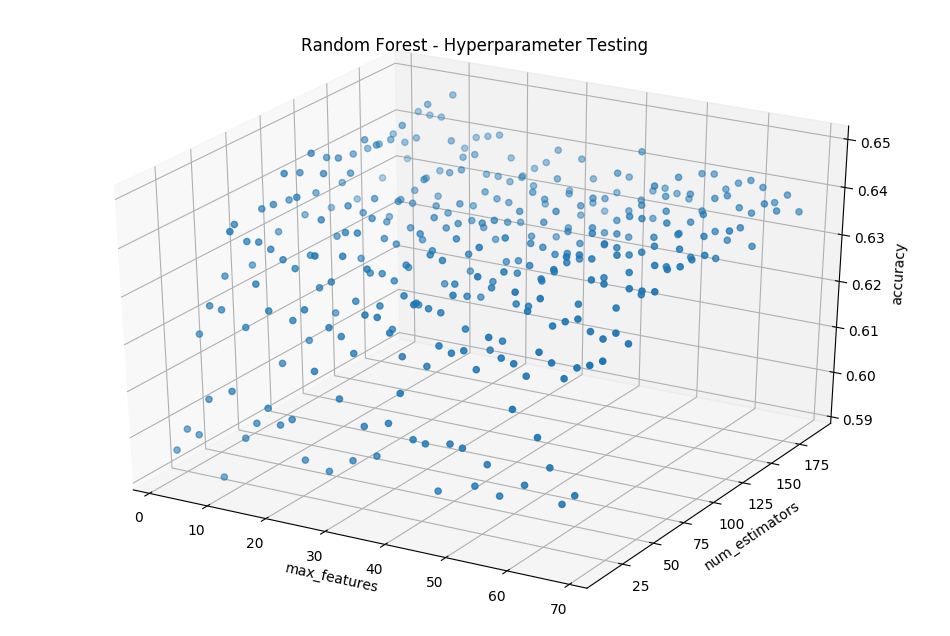

In [ ]:
import re
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

# Data for a three-dimensional scattered points
x = rf_results['max_features'].tolist()
y = rf_results['num_estimators'].tolist()     # test removing .tolist() on all three lines
z = rf_results['accuracy'].tolist()

# Creating figure
fig = plt.figure(figsize= (12,8))
ax = plt.axes(projection = "3d")

# Creating plot
ax.scatter3D(x, y, z, cmap = 'Greens')
plt.title("Random Forest - Hyperparameter Testing")
ax.set_xlabel('max_features')
ax.set_ylabel('num_estimators')
ax.set_zlabel('accuracy')

#Show the plot
plt.show()

In [ ]:
# Sort results DataFrame
rf_results.sort_values(by = 'accuracy', ascending = False)

,accuracy,max_features,num_estimators
34,0.648666,8.0,90.0
48,0.648335,10.0,170.0
49,0.647653,10.0,190.0
33,0.647309,8.0,70.0
47,0.646622,10.0,150.0
...,...,...,...
110,0.600141,24.0,10.0
220,0.599463,46.0,10.0
130,0.598779,28.0,10.0
0,0.596388,2.0,10.0


### 3.3 - Neural Networks

In [ ]:
def select_optimizer(optimize, learn):
    """Used to select an optimizer and learning rate. """
    
    optimizer_dict = {'Adam': tf.optimizers.Adam(learning_rate = learn),
                      'SGD': tf.optimizers.SGD(learning_rate = learn),
                      'Adadelta': tf.optimizers.Adadelta(learning_rate = learn),
                      'RMSprop': tf.optimizers.RMSprop(learning_rate = learn),
                      'Adagrad': tf.optimizers.Adagrad(learning_rate = learn),
                      'Adamax': tf.optimizers.Adamax(learning_rate = learn),
                      'Nadam': tf.optimizers.Nadam(learning_rate = learn),
                      'Ftrl': tf.optimizers.Ftrl(learning_rate = learn),
                      }
    x = optimizer_dict[optimize]
    return x

In [ ]:
# Define function to get model performance (RMSE)
def get_rmse(model_obj):
    """Function to return RMSE of a model."""

    score_train = model_obj.evaluate(X_train, y_train, verbose=0)
    print('Train RMSE: %.2f RMSE' % (math.sqrt(score_train[0])))

    score_test = model_obj.evaluate(X_test, y_test, verbose=0)
    print('Test RMSE: %.2f RMSE' % (math.sqrt(score_test[0])))

In [ ]:
# Finding the shape for input_dim
print(f"The shape of the dataset: {X_train.shape}")
dims = X_train.shape[1]
print(f'Dimensions:{dims}')

The shape of the dataset: (2926, 70)
Dimensions:70


Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 280us/sample - loss: 0.6906 - accuracy: 0.5338 - val_loss: 0.6994 - val_accuracy: 0.5239
Epoch 2/250
2340/2340 [==============================] - 0s 58us/sample - loss: 0.6863 - accuracy: 0.5513 - val_loss: 0.6971 - val_accuracy: 0.5307
Epoch 3/250
2340/2340 [==============================] - 0s 62us/sample - loss: 0.6830 - accuracy: 0.5568 - val_loss: 0.6947 - val_accuracy: 0.5324
Epoch 4/250
2340/2340 [==============================] - 0s 97us/sample - loss: 0.6801 - accuracy: 0.5594 - val_loss: 0.6927 - val_accuracy: 0.5307
Epoch 5/250
2340/2340 [==============================] - 0s 104us/sample - loss: 0.6773 - accuracy: 0.5688 - val_loss: 0.6912 - val_accuracy: 0.5324
Epoch 6/250
2340/2340 [==============================] - 0s 61us/sample - loss: 0.6744 - accuracy: 0.5697 - val_loss: 0.6897 - val_accuracy: 0.5307
Epoch 7/250
2340/2340 [==============================] - 0s 65u

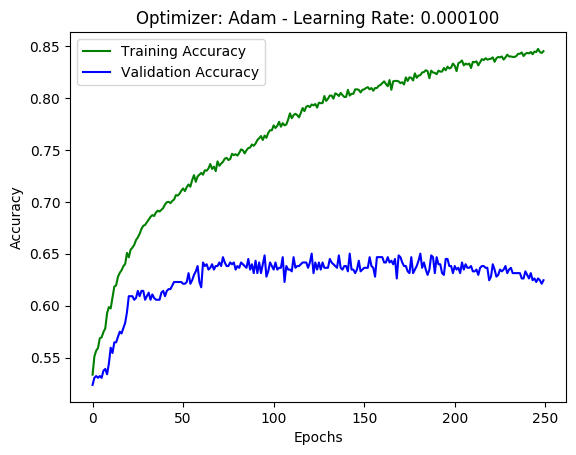

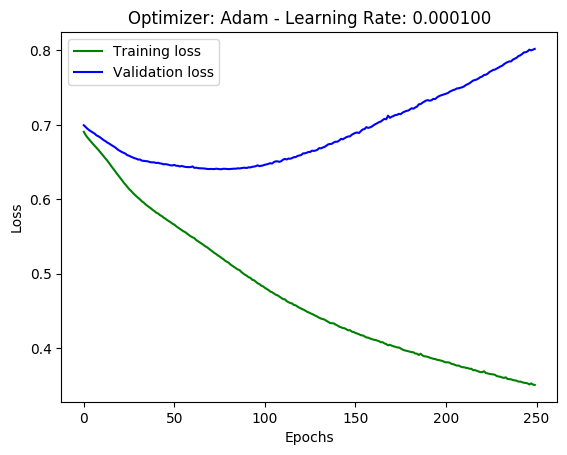

The training accuracy is: 0.8031442165374756
The training loss is: 0.43728375773028977
The test accuracy is: 0.6243169398907104
Train RMSE: 0.66 RMSE
Test RMSE: 0.93 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 216us/sample - loss: 0.6847 - accuracy: 0.5440 - val_loss: 0.6805 - val_accuracy: 0.5546
Epoch 2/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6540 - accuracy: 0.6184 - val_loss: 0.6655 - val_accuracy: 0.6041
Epoch 3/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6296 - accuracy: 0.6487 - val_loss: 0.6643 - val_accuracy: 0.6058
Epoch 4/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6126 - accuracy: 0.6688 - val_loss: 0.6608 - val_accuracy: 0.5973
Epoch 5/250
2340/2340 [==============================] - 0s 120us/sample - loss: 0.5988 - accuracy: 0.6748 - val_loss: 0.6620 - val_accuracy: 0.5939
Epoch 6/250
2340/2340 [================

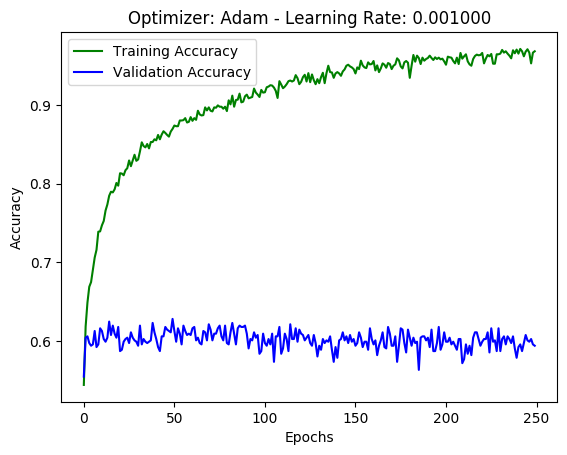

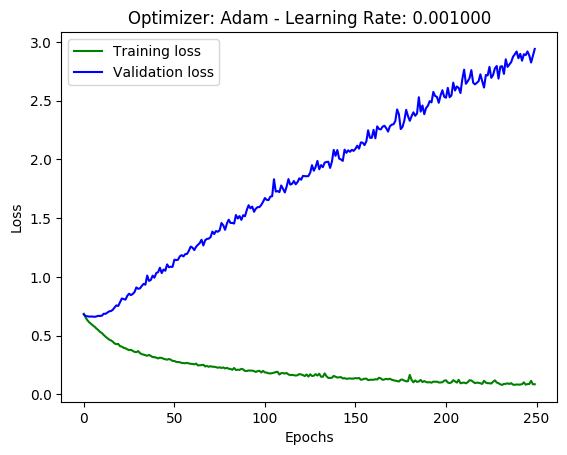

The training accuracy is: 0.9008885622024536
The training loss is: 0.6429095703469346
The test accuracy is: 0.5833333333333334
Train RMSE: 0.80 RMSE
Test RMSE: 1.68 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 209us/sample - loss: 0.6736 - accuracy: 0.5791 - val_loss: 0.6682 - val_accuracy: 0.6041
Epoch 2/250
2340/2340 [==============================] - 0s 44us/sample - loss: 0.6349 - accuracy: 0.6325 - val_loss: 0.6620 - val_accuracy: 0.6143
Epoch 3/250
2340/2340 [==============================] - 0s 46us/sample - loss: 0.6140 - accuracy: 0.6581 - val_loss: 0.6486 - val_accuracy: 0.6348
Epoch 4/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.5920 - accuracy: 0.6859 - val_loss: 0.6643 - val_accuracy: 0.6143
Epoch 5/250
2340/2340 [==============================] - 0s 44us/sample - loss: 0.5863 - accuracy: 0.6821 - val_loss: 0.6677 - val_accuracy: 0.6143
Epoch 6/250
2340/2340 [==================

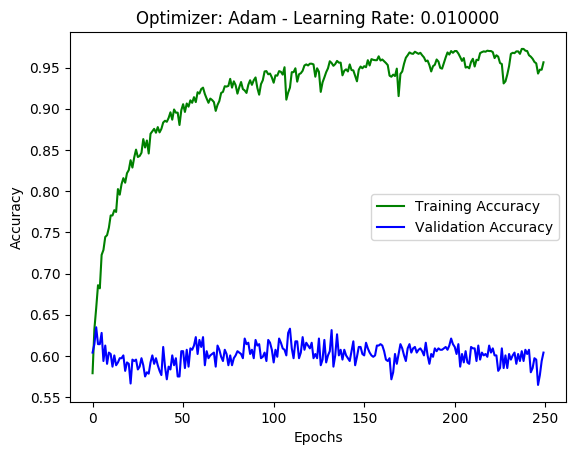

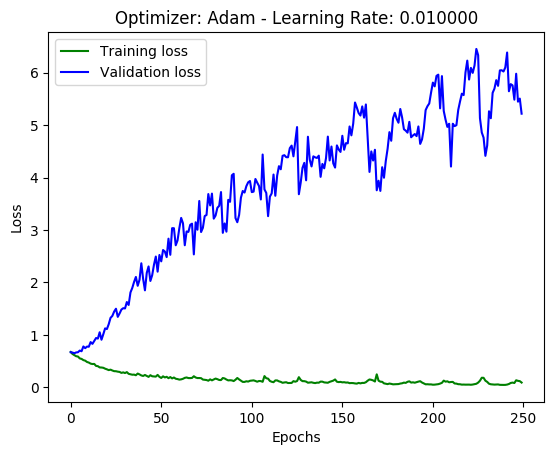

The training accuracy is: 0.8950785994529724
The training loss is: 1.0974896480001495
The test accuracy is: 0.6010928961748634
Train RMSE: 1.05 RMSE
Test RMSE: 2.34 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 323us/sample - loss: 0.7038 - accuracy: 0.5607 - val_loss: 0.6990 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.6886 - accuracy: 0.5560 - val_loss: 0.6947 - val_accuracy: 0.5341
Epoch 3/250
2340/2340 [==============================] - 0s 50us/sample - loss: 0.6893 - accuracy: 0.5568 - val_loss: 0.6914 - val_accuracy: 0.5341
Epoch 4/250
2340/2340 [==============================] - 0s 150us/sample - loss: 0.6887 - accuracy: 0.5551 - val_loss: 0.6929 - val_accuracy: 0.5341
Epoch 5/250
2340/2340 [==============================] - 0s 62us/sample - loss: 0.6888 - accuracy: 0.5637 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [=================

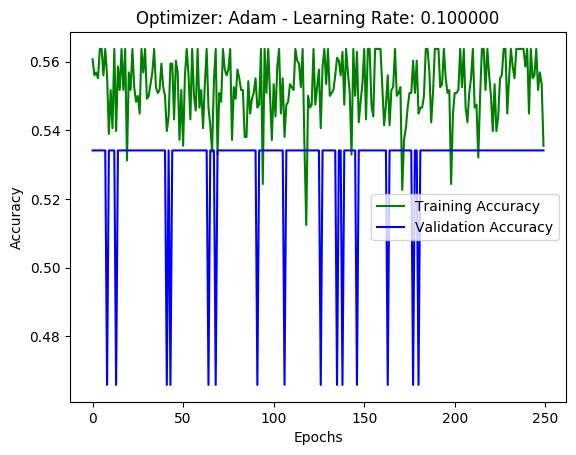

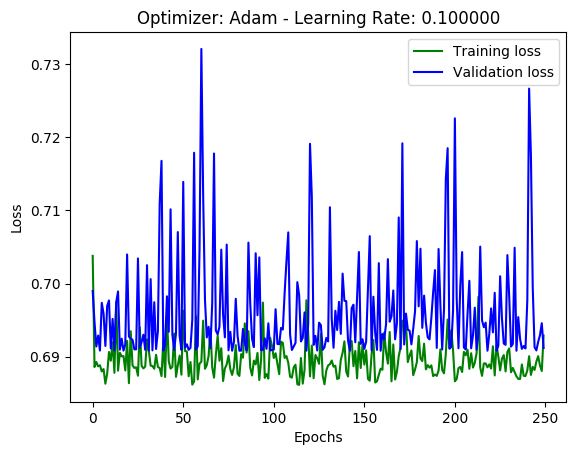

The training accuracy is: 0.5577580332756042
The training loss is: 0.6892687406184652
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 180us/sample - loss: 51.5915 - accuracy: 0.5214 - val_loss: 0.7445 - val_accuracy: 0.4642
Epoch 2/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.7093 - accuracy: 0.5205 - val_loss: 1.5082 - val_accuracy: 0.5358
Epoch 3/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.7295 - accuracy: 0.5355 - val_loss: 0.7159 - val_accuracy: 0.4659
Epoch 4/250
2340/2340 [==============================] - 0s 46us/sample - loss: 0.7170 - accuracy: 0.5158 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 5/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.7066 - accuracy: 0.5338 - val_loss: 1.0439 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [=================

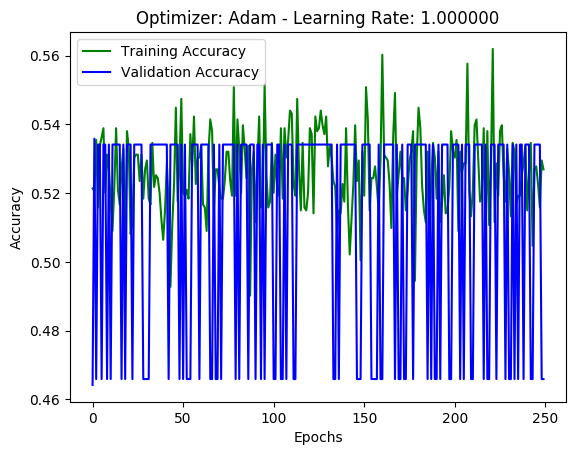

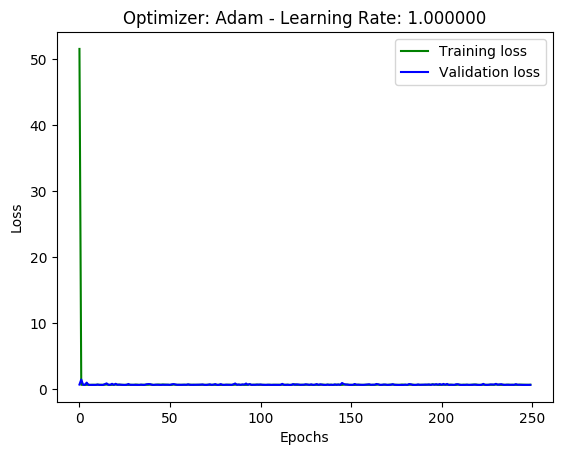

The training accuracy is: 0.44224196672439575
The training loss is: 0.6983304796199317
The test accuracy is: 0.47540983606557374
Train RMSE: 0.84 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 195us/sample - loss: 0.6932 - accuracy: 0.5235 - val_loss: 0.6901 - val_accuracy: 0.5222
Epoch 2/250
2340/2340 [==============================] - 0s 63us/sample - loss: 0.6931 - accuracy: 0.5248 - val_loss: 0.6901 - val_accuracy: 0.5239
Epoch 3/250
2340/2340 [==============================] - 0s 64us/sample - loss: 0.6930 - accuracy: 0.5256 - val_loss: 0.6900 - val_accuracy: 0.5256
Epoch 4/250
2340/2340 [==============================] - 0s 57us/sample - loss: 0.6929 - accuracy: 0.5256 - val_loss: 0.6900 - val_accuracy: 0.5256
Epoch 5/250
2340/2340 [==============================] - 0s 59us/sample - loss: 0.6928 - accuracy: 0.5256 - val_loss: 0.6900 - val_accuracy: 0.5256
Epoch 6/250
2340/2340 [================

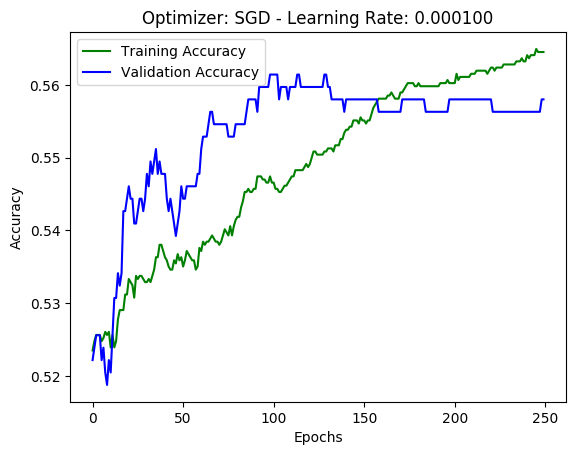

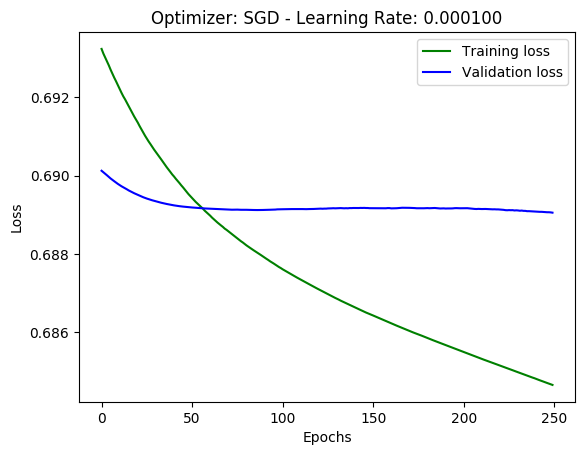

The training accuracy is: 0.5632262229919434
The training loss is: 0.6855311115881554
The test accuracy is: 0.5259562841530054
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 180us/sample - loss: 0.7060 - accuracy: 0.4581 - val_loss: 0.7028 - val_accuracy: 0.4556
Epoch 2/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.7026 - accuracy: 0.4662 - val_loss: 0.7009 - val_accuracy: 0.4539
Epoch 3/250
2340/2340 [==============================] - 0s 38us/sample - loss: 0.6999 - accuracy: 0.4765 - val_loss: 0.6993 - val_accuracy: 0.4608
Epoch 4/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6976 - accuracy: 0.4838 - val_loss: 0.6980 - val_accuracy: 0.4761
Epoch 5/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6956 - accuracy: 0.4863 - val_loss: 0.6969 - val_accuracy: 0.4881
Epoch 6/250
2340/2340 [==================

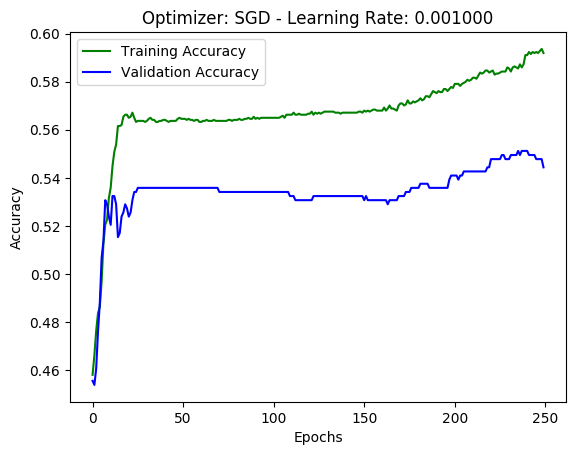

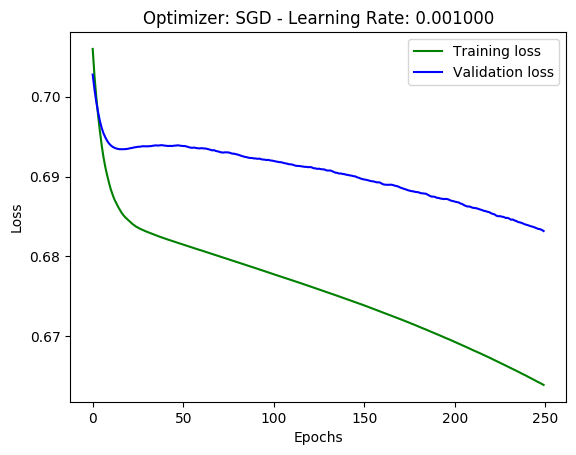

The training accuracy is: 0.5844155550003052
The training loss is: 0.6676591023629607
The test accuracy is: 0.5491803278688525
Train RMSE: 0.82 RMSE
Test RMSE: 0.82 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 146us/sample - loss: 0.6939 - accuracy: 0.5175 - val_loss: 0.6938 - val_accuracy: 0.5188
Epoch 2/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6850 - accuracy: 0.5534 - val_loss: 0.6927 - val_accuracy: 0.5239
Epoch 3/250
2340/2340 [==============================] - 0s 37us/sample - loss: 0.6831 - accuracy: 0.5521 - val_loss: 0.6920 - val_accuracy: 0.5256
Epoch 4/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6817 - accuracy: 0.5556 - val_loss: 0.6911 - val_accuracy: 0.5273
Epoch 5/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6805 - accuracy: 0.5577 - val_loss: 0.6910 - val_accuracy: 0.5290
Epoch 6/250
2340/2340 [==================

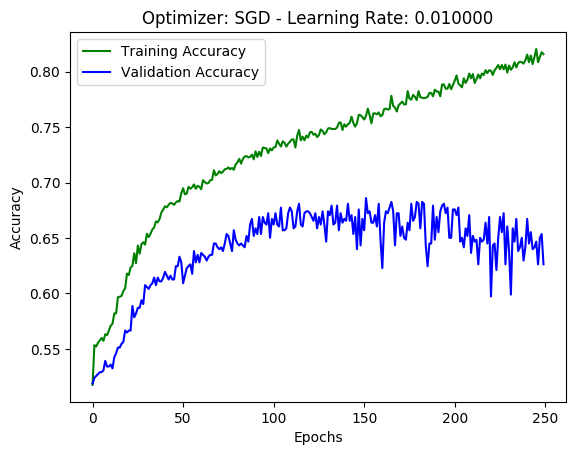

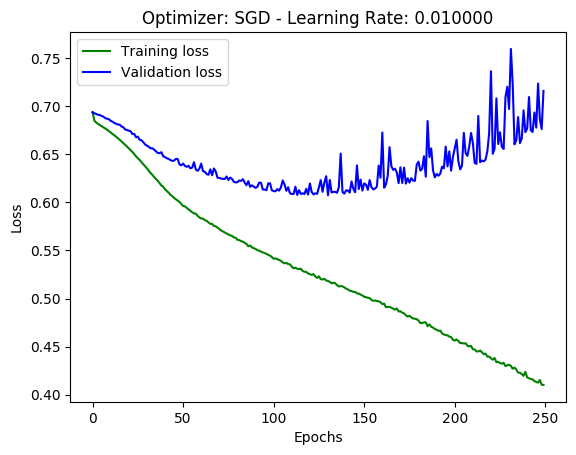

The training accuracy is: 0.7573479413986206
The training loss is: 0.49358351712999327
The test accuracy is: 0.6516393442622951
Train RMSE: 0.70 RMSE
Test RMSE: 0.84 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 198us/sample - loss: 0.6884 - accuracy: 0.5500 - val_loss: 0.6933 - val_accuracy: 0.5375
Epoch 2/250
2340/2340 [==============================] - 0s 59us/sample - loss: 0.6754 - accuracy: 0.5688 - val_loss: 0.6862 - val_accuracy: 0.5529
Epoch 3/250
2340/2340 [==============================] - 0s 124us/sample - loss: 0.6635 - accuracy: 0.5974 - val_loss: 0.6775 - val_accuracy: 0.5836
Epoch 4/250
2340/2340 [==============================] - 0s 52us/sample - loss: 0.6497 - accuracy: 0.6226 - val_loss: 0.6725 - val_accuracy: 0.5939
Epoch 5/250
2340/2340 [==============================] - 0s 56us/sample - loss: 0.6325 - accuracy: 0.6449 - val_loss: 0.6689 - val_accuracy: 0.5870
Epoch 6/250
2340/2340 [================

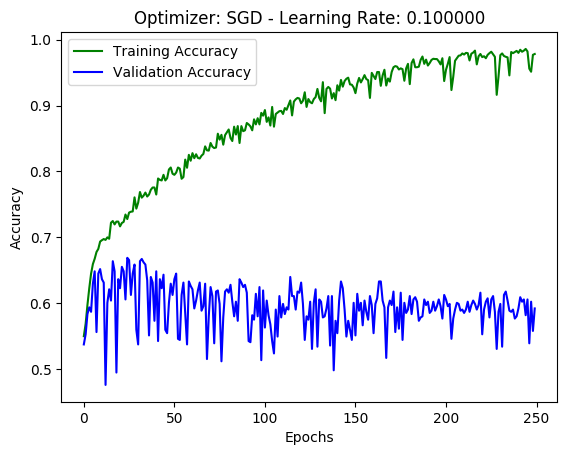

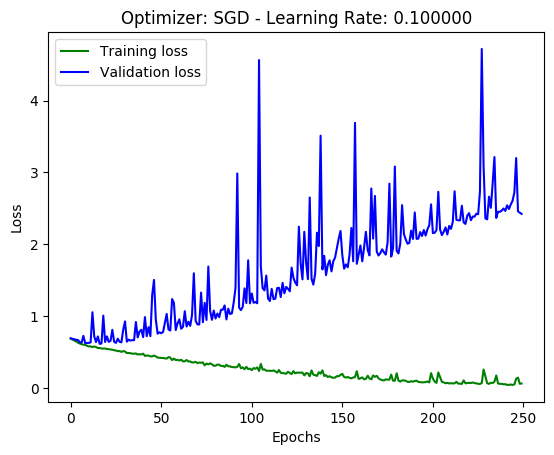

The training accuracy is: 0.9056732654571533
The training loss is: 0.53171119977983
The test accuracy is: 0.5969945355191257
Train RMSE: 0.73 RMSE
Test RMSE: 1.50 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 174us/sample - loss: 0.6871 - accuracy: 0.5577 - val_loss: 0.7998 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 60us/sample - loss: 0.6723 - accuracy: 0.5906 - val_loss: 0.9832 - val_accuracy: 0.4659
Epoch 3/250
2340/2340 [==============================] - 0s 54us/sample - loss: 0.6782 - accuracy: 0.5850 - val_loss: 1.1672 - val_accuracy: 0.4710
Epoch 4/250
2340/2340 [==============================] - 0s 65us/sample - loss: 0.6671 - accuracy: 0.6154 - val_loss: 0.6877 - val_accuracy: 0.5529
Epoch 5/250
2340/2340 [==============================] - 0s 67us/sample - loss: 0.6316 - accuracy: 0.6534 - val_loss: 0.6379 - val_accuracy: 0.6451
Epoch 6/250
2340/2340 [====================

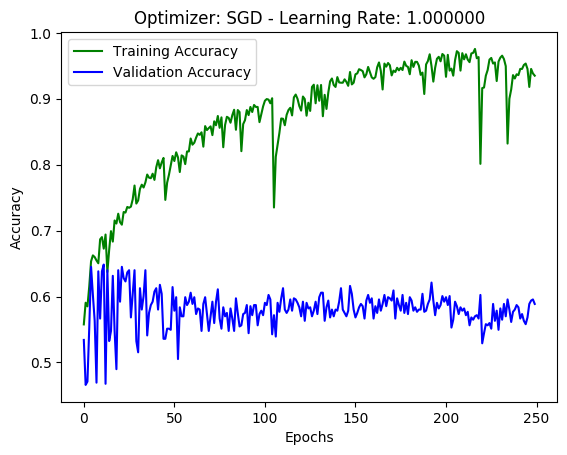

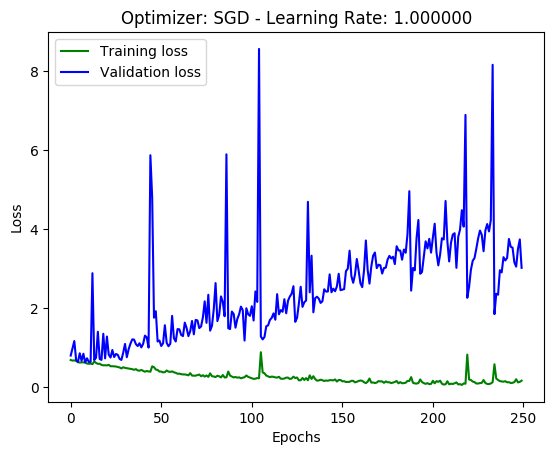

The training accuracy is: 0.8431305289268494
The training loss is: 0.7930206407118724
The test accuracy is: 0.6188524590163934
Train RMSE: 0.89 RMSE
Test RMSE: 1.67 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 211us/sample - loss: 0.7007 - accuracy: 0.4906 - val_loss: 0.6930 - val_accuracy: 0.5188
Epoch 2/250
2340/2340 [==============================] - 0s 47us/sample - loss: 0.7007 - accuracy: 0.4902 - val_loss: 0.6930 - val_accuracy: 0.5154
Epoch 3/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.7006 - accuracy: 0.4906 - val_loss: 0.6930 - val_accuracy: 0.5171
Epoch 4/250
2340/2340 [==============================] - 0s 57us/sample - loss: 0.7006 - accuracy: 0.4897 - val_loss: 0.6930 - val_accuracy: 0.5188
Epoch 5/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.7006 - accuracy: 0.4897 - val_loss: 0.6930 - val_accuracy: 0.5188
Epoch 6/250
2340/2340 [==================

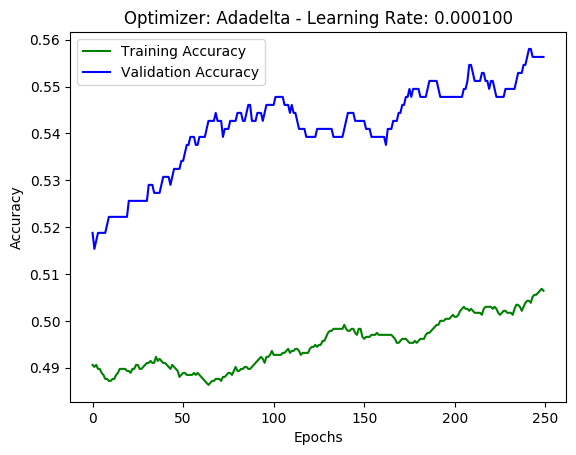

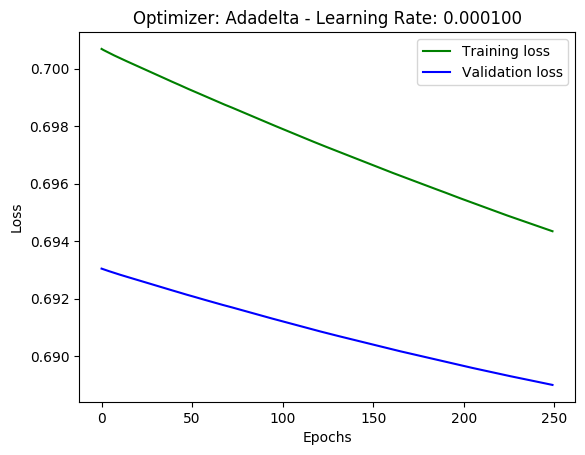

The training accuracy is: 0.51606285572052
The training loss is: 0.693261519043884
The test accuracy is: 0.5300546448087432
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 330us/sample - loss: 0.6930 - accuracy: 0.5038 - val_loss: 0.6962 - val_accuracy: 0.4932
Epoch 2/250
2340/2340 [==============================] - 0s 85us/sample - loss: 0.6929 - accuracy: 0.5056 - val_loss: 0.6961 - val_accuracy: 0.4898
Epoch 3/250
2340/2340 [==============================] - 0s 56us/sample - loss: 0.6928 - accuracy: 0.5056 - val_loss: 0.6960 - val_accuracy: 0.4915
Epoch 4/250
2340/2340 [==============================] - 0s 54us/sample - loss: 0.6927 - accuracy: 0.5060 - val_loss: 0.6959 - val_accuracy: 0.4966
Epoch 5/250
2340/2340 [==============================] - 0s 49us/sample - loss: 0.6926 - accuracy: 0.5081 - val_loss: 0.6959 - val_accuracy: 0.4949
Epoch 6/250
2340/2340 [=====================

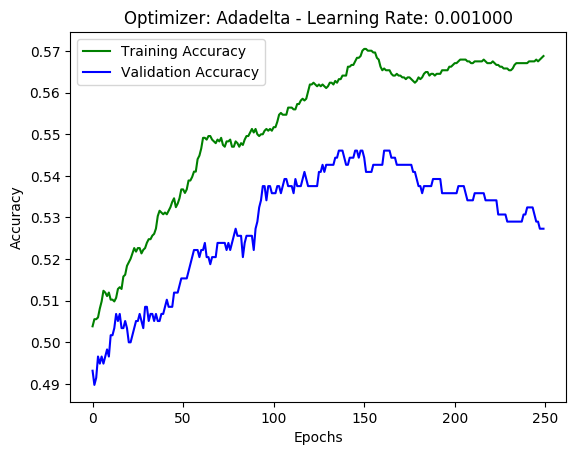

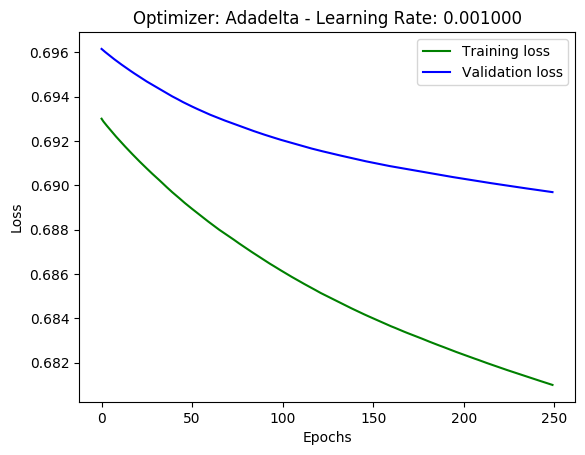

The training accuracy is: 0.5601503849029541
The training loss is: 0.6827216809201713
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 206us/sample - loss: 0.6914 - accuracy: 0.5218 - val_loss: 0.6883 - val_accuracy: 0.5478
Epoch 2/250
2340/2340 [==============================] - 0s 80us/sample - loss: 0.6902 - accuracy: 0.5252 - val_loss: 0.6879 - val_accuracy: 0.5427
Epoch 3/250
2340/2340 [==============================] - 0s 58us/sample - loss: 0.6894 - accuracy: 0.5265 - val_loss: 0.6875 - val_accuracy: 0.5580
Epoch 4/250
2340/2340 [==============================] - 0s 55us/sample - loss: 0.6886 - accuracy: 0.5269 - val_loss: 0.6872 - val_accuracy: 0.5478
Epoch 5/250
2340/2340 [==============================] - 0s 41us/sample - loss: 0.6880 - accuracy: 0.5312 - val_loss: 0.6870 - val_accuracy: 0.5444
Epoch 6/250
2340/2340 [==================

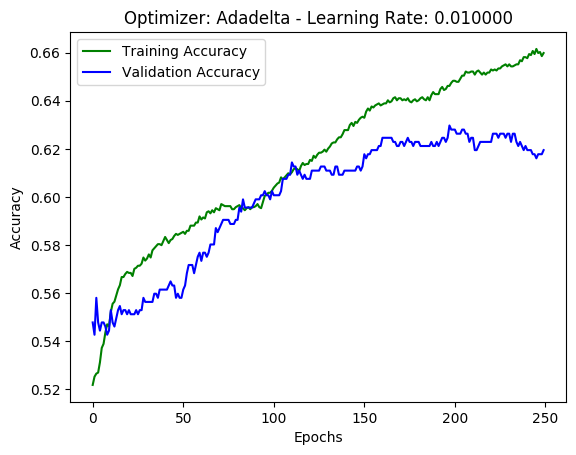

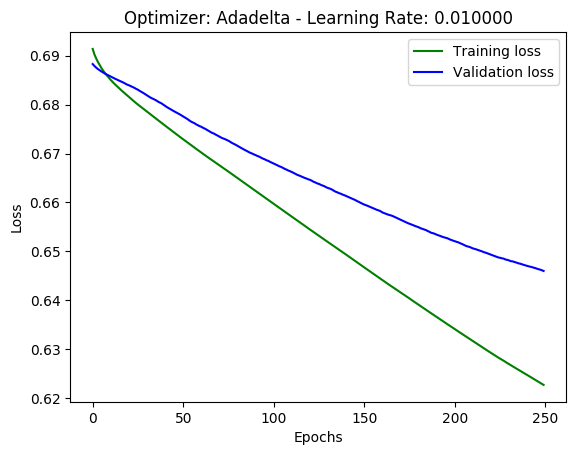

The training accuracy is: 0.6510594487190247
The training loss is: 0.6272145686130042
The test accuracy is: 0.6174863387978142
Train RMSE: 0.79 RMSE
Test RMSE: 0.81 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 162us/sample - loss: 0.6891 - accuracy: 0.5560 - val_loss: 0.6891 - val_accuracy: 0.5410
Epoch 2/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6859 - accuracy: 0.5573 - val_loss: 0.6875 - val_accuracy: 0.5427
Epoch 3/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6828 - accuracy: 0.5650 - val_loss: 0.6862 - val_accuracy: 0.5512
Epoch 4/250
2340/2340 [==============================] - 0s 42us/sample - loss: 0.6800 - accuracy: 0.5675 - val_loss: 0.6850 - val_accuracy: 0.5580
Epoch 5/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6773 - accuracy: 0.5722 - val_loss: 0.6845 - val_accuracy: 0.5546
Epoch 6/250
2340/2340 [==================

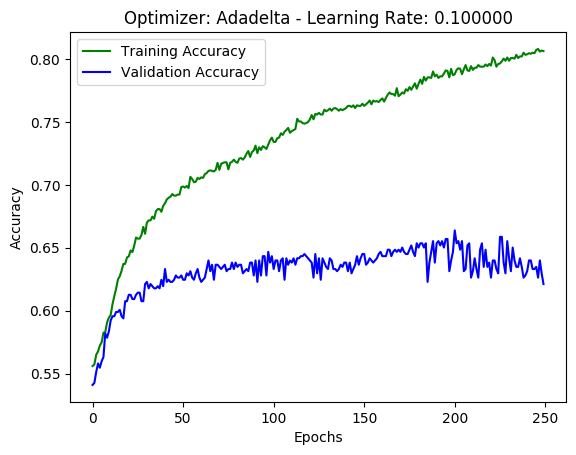

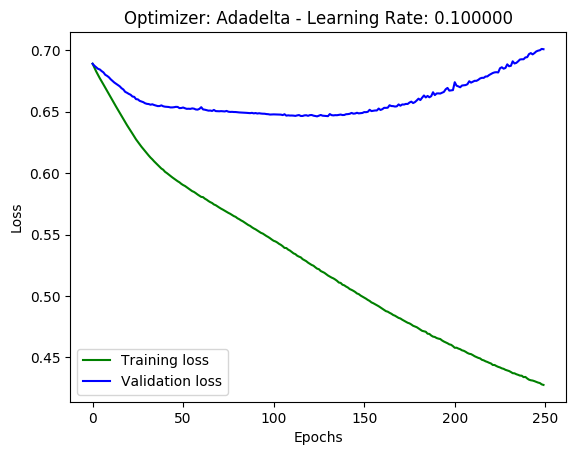

The training accuracy is: 0.7703348994255066
The training loss is: 0.4806131882489909
The test accuracy is: 0.6693989071038251
Train RMSE: 0.69 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 150us/sample - loss: 0.6771 - accuracy: 0.5718 - val_loss: 0.6843 - val_accuracy: 0.5427
Epoch 2/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6526 - accuracy: 0.6073 - val_loss: 0.6631 - val_accuracy: 0.6075
Epoch 3/250
2340/2340 [==============================] - 0s 46us/sample - loss: 0.6279 - accuracy: 0.6521 - val_loss: 0.6696 - val_accuracy: 0.5734
Epoch 4/250
2340/2340 [==============================] - 0s 42us/sample - loss: 0.6122 - accuracy: 0.6615 - val_loss: 0.6596 - val_accuracy: 0.5939
Epoch 5/250
2340/2340 [==============================] - 0s 87us/sample - loss: 0.5986 - accuracy: 0.6863 - val_loss: 0.6693 - val_accuracy: 0.6195
Epoch 6/250
2340/2340 [==================

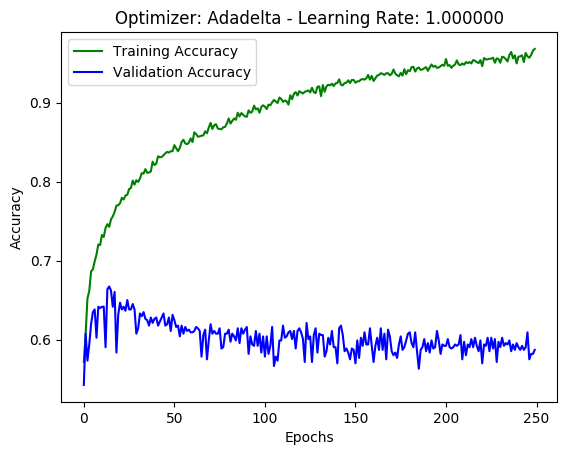

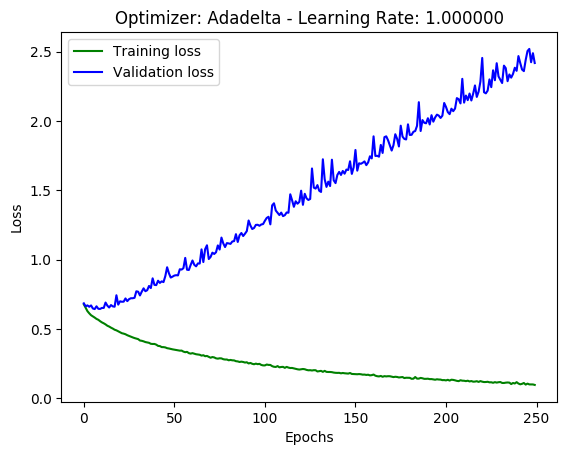

The training accuracy is: 0.8937115669250488
The training loss is: 0.5502890545826453
The test accuracy is: 0.610655737704918
Train RMSE: 0.74 RMSE
Test RMSE: 1.46 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 299us/sample - loss: 0.6833 - accuracy: 0.5650 - val_loss: 0.6881 - val_accuracy: 0.5392
Epoch 2/250
2340/2340 [==============================] - 0s 40us/sample - loss: 0.6799 - accuracy: 0.5654 - val_loss: 0.6869 - val_accuracy: 0.5375
Epoch 3/250
2340/2340 [==============================] - 0s 37us/sample - loss: 0.6773 - accuracy: 0.5675 - val_loss: 0.6855 - val_accuracy: 0.5375
Epoch 4/250
2340/2340 [==============================] - 0s 38us/sample - loss: 0.6747 - accuracy: 0.5667 - val_loss: 0.6839 - val_accuracy: 0.5427
Epoch 5/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6722 - accuracy: 0.5697 - val_loss: 0.6831 - val_accuracy: 0.5478
Epoch 6/250
2340/2340 [===================

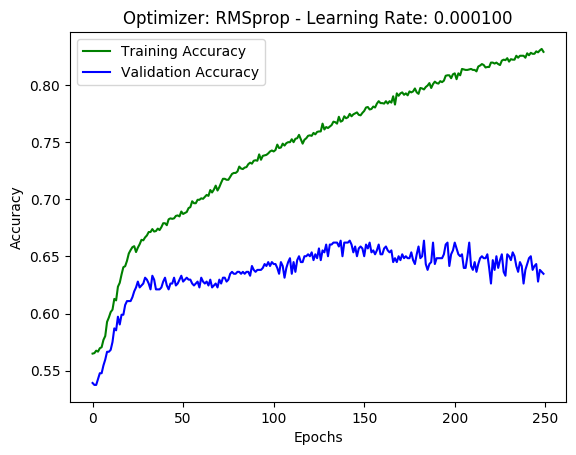

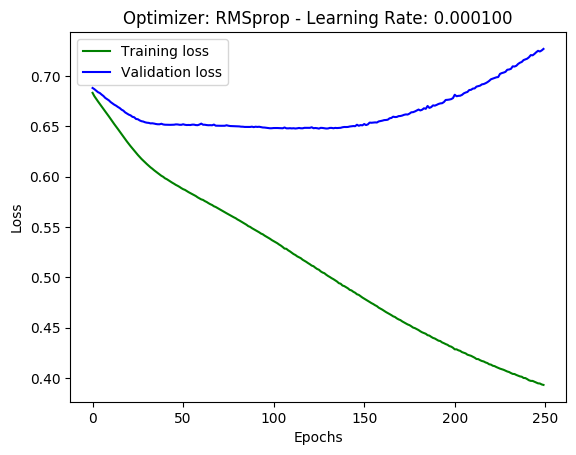

The training accuracy is: 0.7925495505332947
The training loss is: 0.4571170622326296
The test accuracy is: 0.6379781420765027
Train RMSE: 0.68 RMSE
Test RMSE: 0.86 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 285us/sample - loss: 0.6782 - accuracy: 0.5688 - val_loss: 0.6790 - val_accuracy: 0.5392
Epoch 2/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6541 - accuracy: 0.6098 - val_loss: 0.6650 - val_accuracy: 0.5853
Epoch 3/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6316 - accuracy: 0.6372 - val_loss: 0.6580 - val_accuracy: 0.6314
Epoch 4/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6149 - accuracy: 0.6615 - val_loss: 0.6555 - val_accuracy: 0.6177
Epoch 5/250
2340/2340 [==============================] - 0s 38us/sample - loss: 0.6013 - accuracy: 0.6786 - val_loss: 0.6576 - val_accuracy: 0.6092
Epoch 6/250
2340/2340 [==================

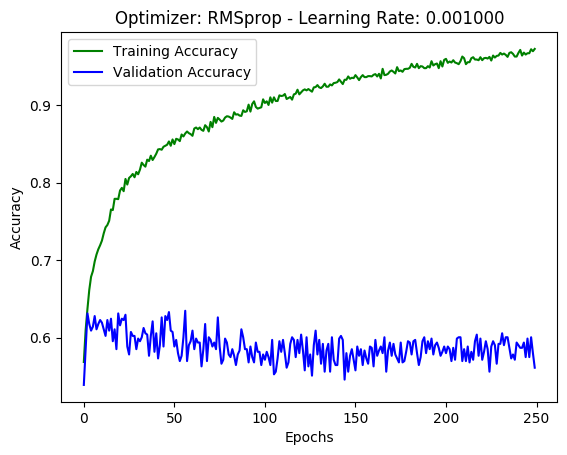

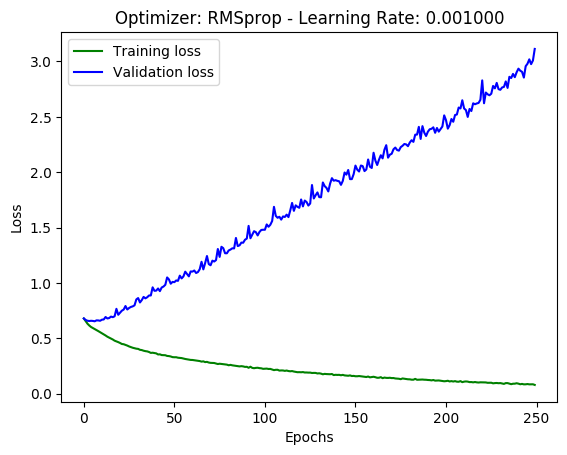

The training accuracy is: 0.8595352172851562
The training loss is: 0.7400756339992632
The test accuracy is: 0.5710382513661202
Train RMSE: 0.86 RMSE
Test RMSE: 1.69 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 230us/sample - loss: 0.6774 - accuracy: 0.5932 - val_loss: 0.6914 - val_accuracy: 0.5939
Epoch 2/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6369 - accuracy: 0.6385 - val_loss: 0.7249 - val_accuracy: 0.5597
Epoch 3/250
2340/2340 [==============================] - 0s 44us/sample - loss: 0.6206 - accuracy: 0.6543 - val_loss: 0.6961 - val_accuracy: 0.5802
Epoch 4/250
2340/2340 [==============================] - 0s 40us/sample - loss: 0.6027 - accuracy: 0.6769 - val_loss: 0.6792 - val_accuracy: 0.6109
Epoch 5/250
2340/2340 [==============================] - 0s 42us/sample - loss: 0.5787 - accuracy: 0.7030 - val_loss: 0.6798 - val_accuracy: 0.6433
Epoch 6/250
2340/2340 [==================

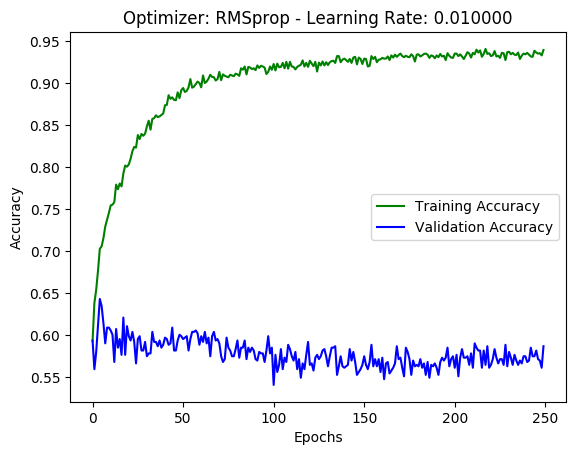

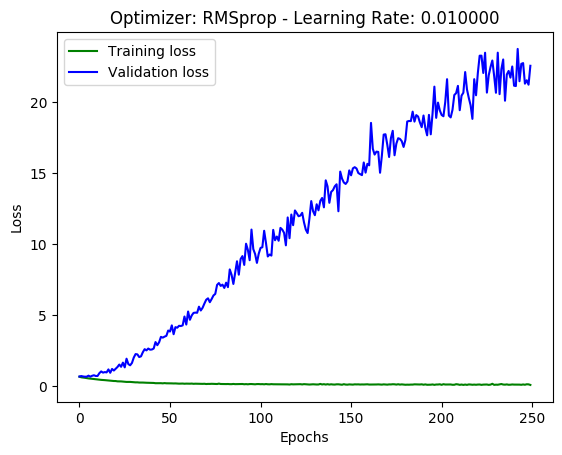

The training accuracy is: 0.8639781475067139
The training loss is: 4.64104698501624
The test accuracy is: 0.5860655737704918
Train RMSE: 2.15 RMSE
Test RMSE: 4.50 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 2s 685us/sample - loss: 1.6902 - accuracy: 0.5303 - val_loss: 0.8119 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6902 - accuracy: 0.5594 - val_loss: 0.7068 - val_accuracy: 0.4915
Epoch 3/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6750 - accuracy: 0.5859 - val_loss: 0.9520 - val_accuracy: 0.4727
Epoch 4/250
2340/2340 [==============================] - 0s 38us/sample - loss: 0.6715 - accuracy: 0.5868 - val_loss: 0.7856 - val_accuracy: 0.5512
Epoch 5/250
2340/2340 [==============================] - 0s 37us/sample - loss: 0.6667 - accuracy: 0.5987 - val_loss: 0.7299 - val_accuracy: 0.5375
Epoch 6/250
2340/2340 [====================

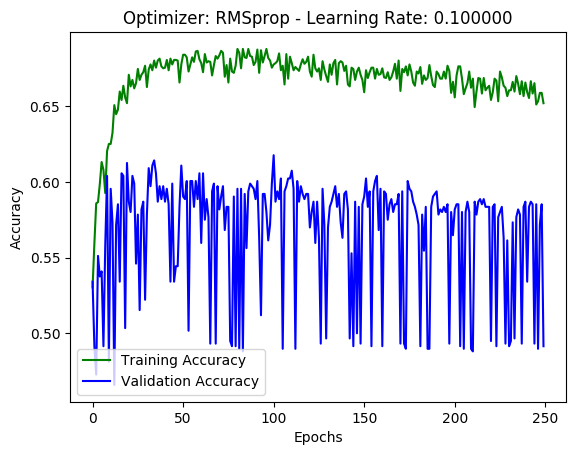

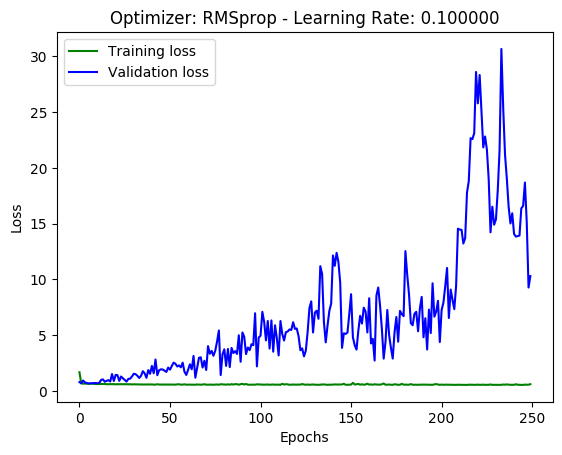

The training accuracy is: 0.5324675440788269
The training loss is: 2.5467589779904016
The test accuracy is: 0.5122950819672131
Train RMSE: 1.60 RMSE
Test RMSE: 2.91 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 193us/sample - loss: 903.8501 - accuracy: 0.5226 - val_loss: 13.2897 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 39us/sample - loss: 7.3672 - accuracy: 0.5103 - val_loss: 11.6161 - val_accuracy: 0.4659
Epoch 3/250
2340/2340 [==============================] - 0s 40us/sample - loss: 1.0998 - accuracy: 0.5124 - val_loss: 0.9922 - val_accuracy: 0.4659
Epoch 4/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.9544 - accuracy: 0.4876 - val_loss: 1.2059 - val_accuracy: 0.4659
Epoch 5/250
2340/2340 [==============================] - 0s 38us/sample - loss: 0.8075 - accuracy: 0.4979 - val_loss: 1.0288 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [==============

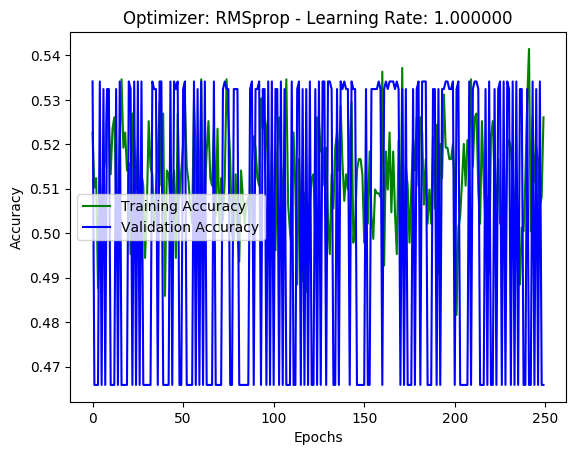

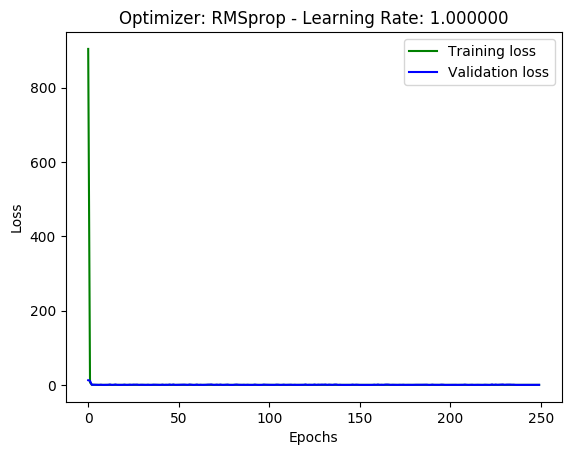

The training accuracy is: 0.44224196672439575
The training loss is: 0.8954850005027943
The test accuracy is: 0.47540983606557374
Train RMSE: 0.95 RMSE
Test RMSE: 0.93 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 191us/sample - loss: 0.6945 - accuracy: 0.5192 - val_loss: 0.6945 - val_accuracy: 0.5034
Epoch 2/250
2340/2340 [==============================] - 0s 37us/sample - loss: 0.6942 - accuracy: 0.5175 - val_loss: 0.6944 - val_accuracy: 0.5017
Epoch 3/250
2340/2340 [==============================] - 0s 38us/sample - loss: 0.6940 - accuracy: 0.5192 - val_loss: 0.6943 - val_accuracy: 0.5051
Epoch 4/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6938 - accuracy: 0.5205 - val_loss: 0.6942 - val_accuracy: 0.5085
Epoch 5/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6936 - accuracy: 0.5218 - val_loss: 0.6941 - val_accuracy: 0.5102
Epoch 6/250
2340/2340 [================

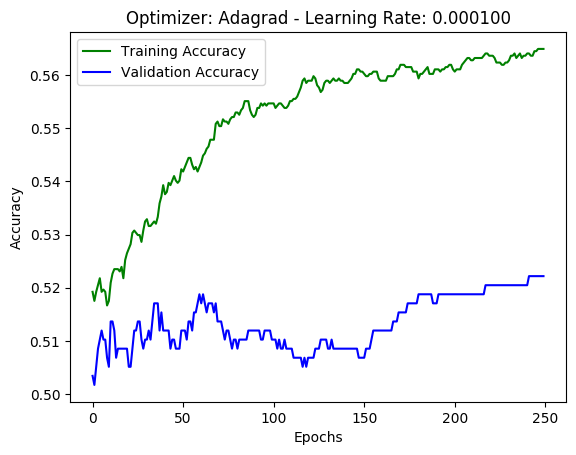

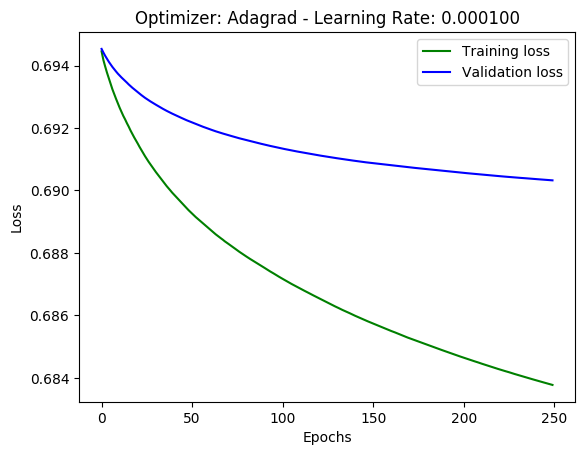

The training accuracy is: 0.5563910007476807
The training loss is: 0.6850760907077333
The test accuracy is: 0.5300546448087432
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 166us/sample - loss: 0.7074 - accuracy: 0.4650 - val_loss: 0.6991 - val_accuracy: 0.4932
Epoch 2/250
2340/2340 [==============================] - 0s 53us/sample - loss: 0.6968 - accuracy: 0.4936 - val_loss: 0.6945 - val_accuracy: 0.5102
Epoch 3/250
2340/2340 [==============================] - 0s 101us/sample - loss: 0.6919 - accuracy: 0.5060 - val_loss: 0.6918 - val_accuracy: 0.4983
Epoch 4/250
2340/2340 [==============================] - 0s 46us/sample - loss: 0.6887 - accuracy: 0.5278 - val_loss: 0.6903 - val_accuracy: 0.5273
Epoch 5/250
2340/2340 [==============================] - 0s 44us/sample - loss: 0.6866 - accuracy: 0.5462 - val_loss: 0.6892 - val_accuracy: 0.5307
Epoch 6/250
2340/2340 [=================

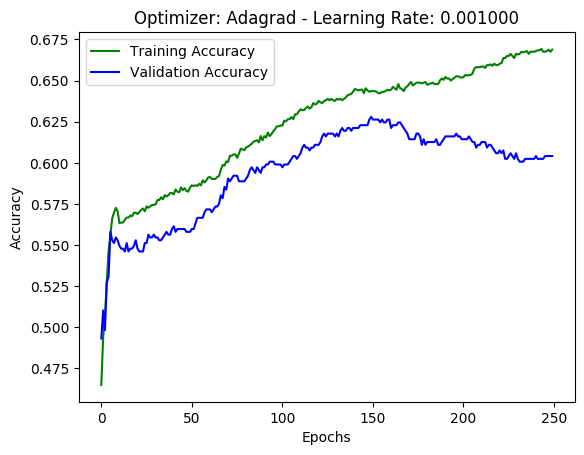

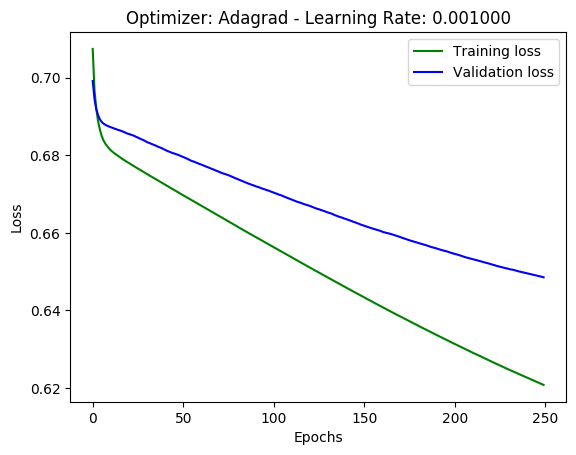

The training accuracy is: 0.6555023789405823
The training loss is: 0.6261825921269858
The test accuracy is: 0.6174863387978142
Train RMSE: 0.79 RMSE
Test RMSE: 0.81 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 156us/sample - loss: 0.6919 - accuracy: 0.5316 - val_loss: 0.6891 - val_accuracy: 0.5358
Epoch 2/250
2340/2340 [==============================] - 0s 41us/sample - loss: 0.6863 - accuracy: 0.5585 - val_loss: 0.6880 - val_accuracy: 0.5341
Epoch 3/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6842 - accuracy: 0.5607 - val_loss: 0.6867 - val_accuracy: 0.5375
Epoch 4/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6822 - accuracy: 0.5620 - val_loss: 0.6857 - val_accuracy: 0.5324
Epoch 5/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6803 - accuracy: 0.5658 - val_loss: 0.6856 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [==================

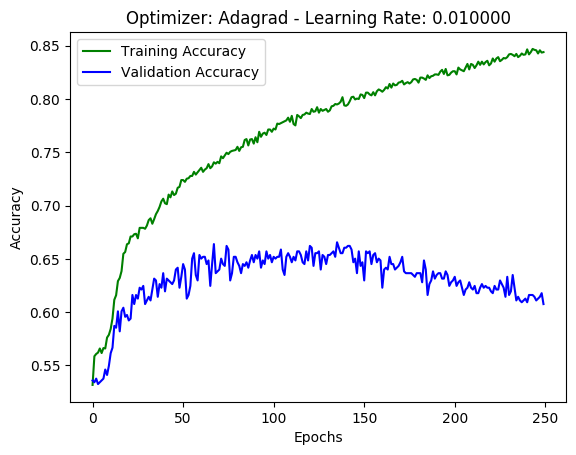

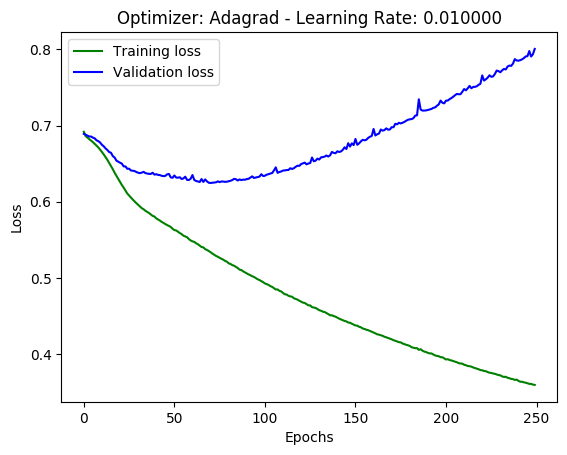

The training accuracy is: 0.7966507077217102
The training loss is: 0.4460091167985782
The test accuracy is: 0.6352459016393442
Train RMSE: 0.67 RMSE
Test RMSE: 0.88 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 209us/sample - loss: 0.6867 - accuracy: 0.5538 - val_loss: 0.6973 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 44us/sample - loss: 0.6711 - accuracy: 0.5919 - val_loss: 0.7088 - val_accuracy: 0.4863
Epoch 3/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6502 - accuracy: 0.6197 - val_loss: 0.7510 - val_accuracy: 0.4932
Epoch 4/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6311 - accuracy: 0.6479 - val_loss: 0.6811 - val_accuracy: 0.5802
Epoch 5/250
2340/2340 [==============================] - 0s 40us/sample - loss: 0.6092 - accuracy: 0.6688 - val_loss: 0.6668 - val_accuracy: 0.6126
Epoch 6/250
2340/2340 [==================

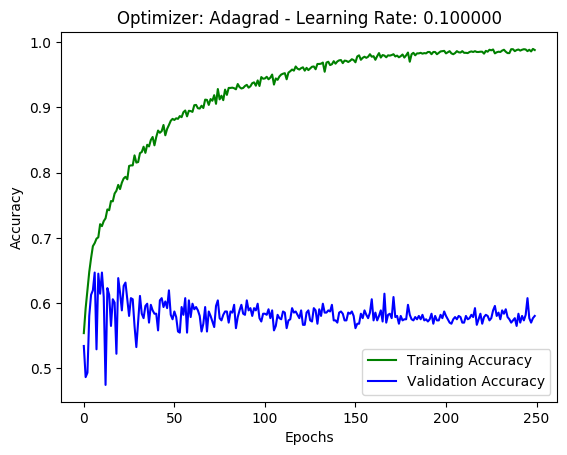

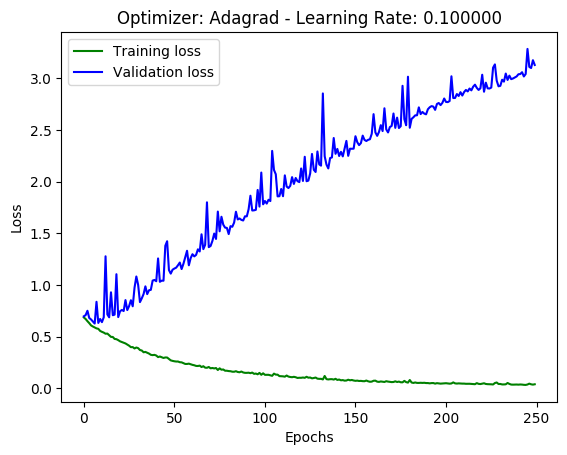

The training accuracy is: 0.9097744226455688
The training loss is: 0.6506395344931176
The test accuracy is: 0.6024590163934426
Train RMSE: 0.81 RMSE
Test RMSE: 1.73 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 156us/sample - loss: 0.7015 - accuracy: 0.5534 - val_loss: 0.7080 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 38us/sample - loss: 0.6915 - accuracy: 0.5470 - val_loss: 0.7078 - val_accuracy: 0.4659
Epoch 3/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6893 - accuracy: 0.5530 - val_loss: 0.9109 - val_accuracy: 0.4659
Epoch 4/250
2340/2340 [==============================] - 0s 80us/sample - loss: 0.6900 - accuracy: 0.5534 - val_loss: 0.6937 - val_accuracy: 0.4676
Epoch 5/250
2340/2340 [==============================] - 0s 41us/sample - loss: 0.6882 - accuracy: 0.5543 - val_loss: 0.7084 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [==================

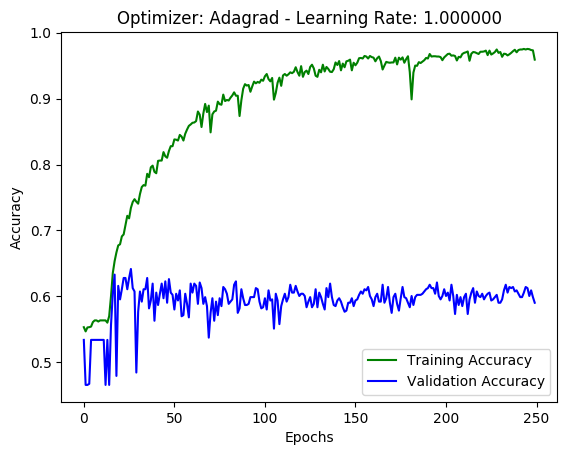

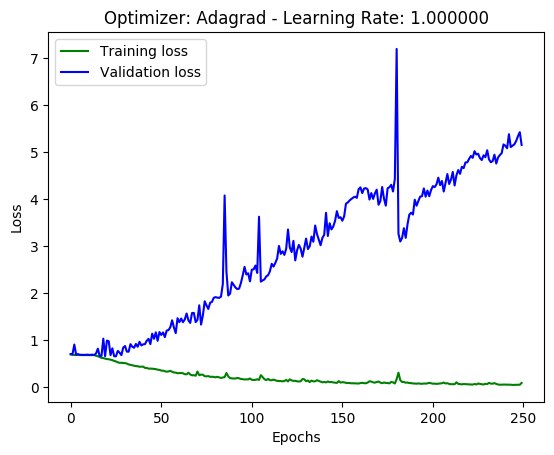

The training accuracy is: 0.8971291780471802
The training loss is: 1.079509788743454
The test accuracy is: 0.6229508196721312
Train RMSE: 1.04 RMSE
Test RMSE: 2.34 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 259us/sample - loss: 0.6898 - accuracy: 0.5620 - val_loss: 0.6946 - val_accuracy: 0.5307
Epoch 2/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6876 - accuracy: 0.5641 - val_loss: 0.6929 - val_accuracy: 0.5341
Epoch 3/250
2340/2340 [==============================] - 0s 35us/sample - loss: 0.6862 - accuracy: 0.5645 - val_loss: 0.6919 - val_accuracy: 0.5324
Epoch 4/250
2340/2340 [==============================] - 0s 37us/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6911 - val_accuracy: 0.5392
Epoch 5/250
2340/2340 [==============================] - 0s 37us/sample - loss: 0.6845 - accuracy: 0.5650 - val_loss: 0.6904 - val_accuracy: 0.5461
Epoch 6/250
2340/2340 [===================

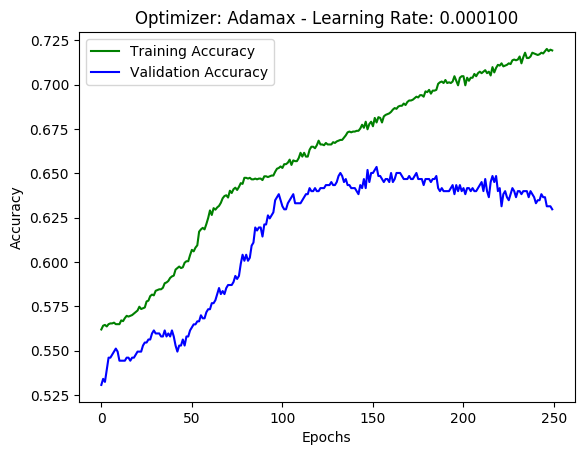

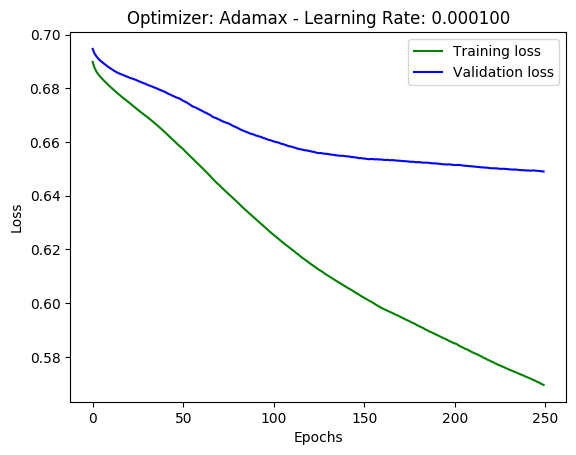

The training accuracy is: 0.7026657462120056
The training loss is: 0.5850629645997502
The test accuracy is: 0.6338797814207651
Train RMSE: 0.76 RMSE
Test RMSE: 0.80 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 213us/sample - loss: 0.6878 - accuracy: 0.5410 - val_loss: 0.6883 - val_accuracy: 0.5358
Epoch 2/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6766 - accuracy: 0.5679 - val_loss: 0.6850 - val_accuracy: 0.5410
Epoch 3/250
2340/2340 [==============================] - 0s 40us/sample - loss: 0.6701 - accuracy: 0.5812 - val_loss: 0.6823 - val_accuracy: 0.5444
Epoch 4/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.6639 - accuracy: 0.5962 - val_loss: 0.6790 - val_accuracy: 0.5683
Epoch 5/250
2340/2340 [==============================] - 0s 40us/sample - loss: 0.6569 - accuracy: 0.6132 - val_loss: 0.6775 - val_accuracy: 0.5700
Epoch 6/250
2340/2340 [==================

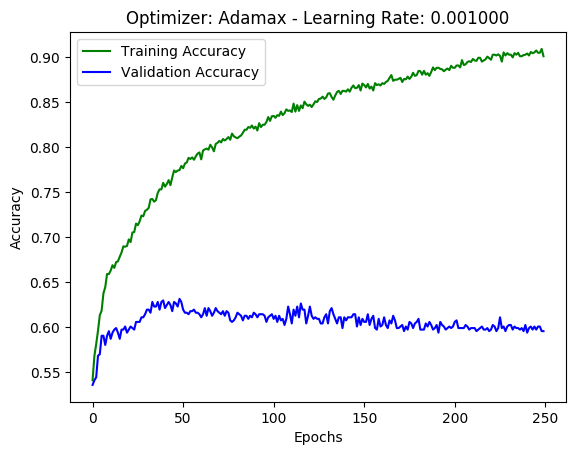

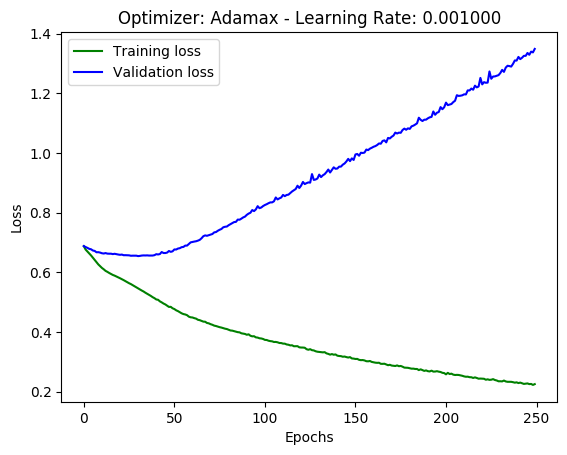

The training accuracy is: 0.8496240377426147
The training loss is: 0.43996791707597527
The test accuracy is: 0.5887978142076503
Train RMSE: 0.66 RMSE
Test RMSE: 1.13 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 303us/sample - loss: 0.6709 - accuracy: 0.5735 - val_loss: 0.6693 - val_accuracy: 0.5922
Epoch 2/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6280 - accuracy: 0.6397 - val_loss: 0.6573 - val_accuracy: 0.6195
Epoch 3/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6052 - accuracy: 0.6739 - val_loss: 0.6451 - val_accuracy: 0.6331
Epoch 4/250
2340/2340 [==============================] - 0s 39us/sample - loss: 0.5888 - accuracy: 0.6846 - val_loss: 0.6453 - val_accuracy: 0.6451
Epoch 5/250
2340/2340 [==============================] - 0s 38us/sample - loss: 0.5771 - accuracy: 0.7034 - val_loss: 0.6403 - val_accuracy: 0.6297
Epoch 6/250
2340/2340 [=================

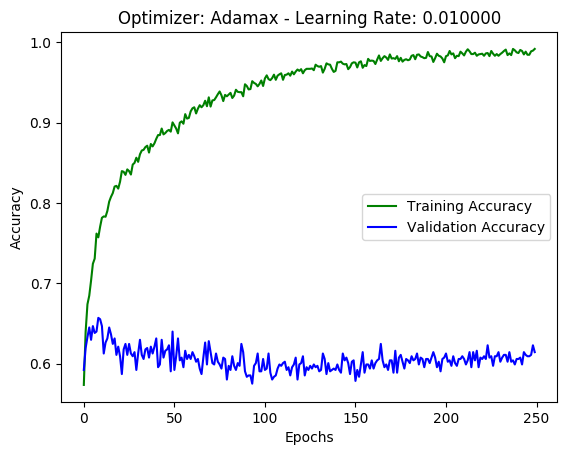

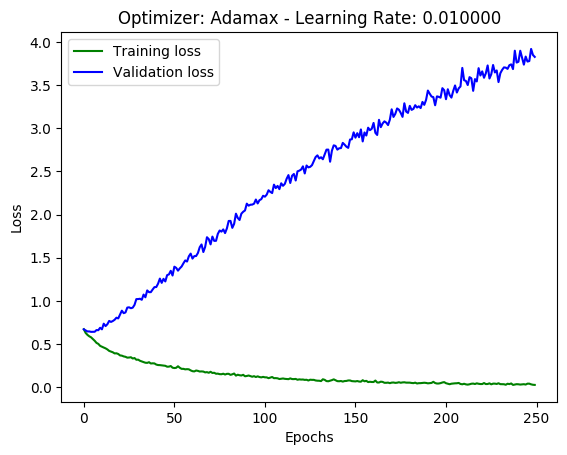

The training accuracy is: 0.9186602830886841
The training loss is: 0.778880676201157
The test accuracy is: 0.5806010928961749
Train RMSE: 0.88 RMSE
Test RMSE: 2.02 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 153us/sample - loss: 0.7021 - accuracy: 0.5782 - val_loss: 0.6730 - val_accuracy: 0.5836
Epoch 2/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6396 - accuracy: 0.6150 - val_loss: 0.6748 - val_accuracy: 0.6109
Epoch 3/250
2340/2340 [==============================] - 0s 35us/sample - loss: 0.6237 - accuracy: 0.6551 - val_loss: 0.6597 - val_accuracy: 0.6092
Epoch 4/250
2340/2340 [==============================] - 0s 35us/sample - loss: 0.6079 - accuracy: 0.6645 - val_loss: 0.6786 - val_accuracy: 0.6280
Epoch 5/250
2340/2340 [==============================] - 0s 36us/sample - loss: 0.6028 - accuracy: 0.6774 - val_loss: 0.6784 - val_accuracy: 0.5939
Epoch 6/250
2340/2340 [===================

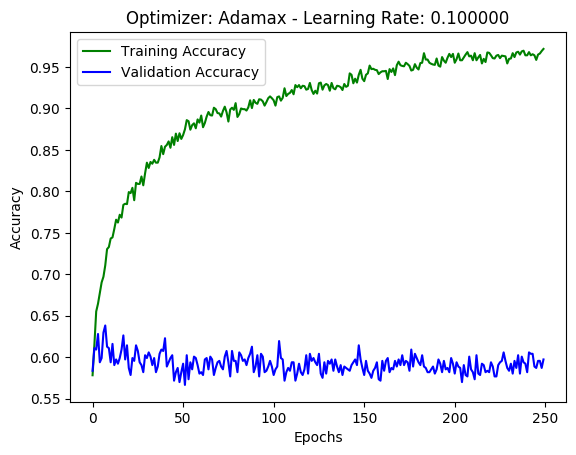

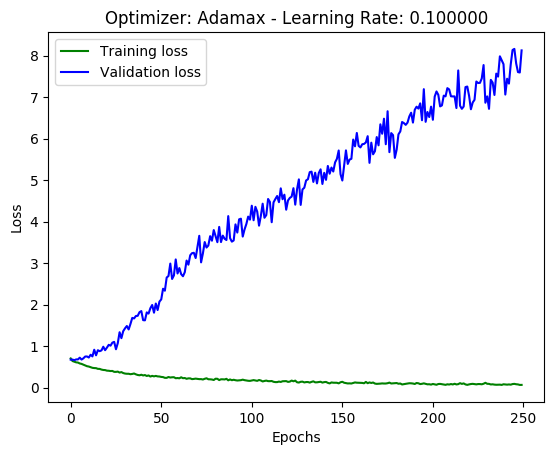

The training accuracy is: 0.8971291780471802
The training loss is: 1.6739931503031975
The test accuracy is: 0.6079234972677595
Train RMSE: 1.29 RMSE
Test RMSE: 2.90 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 163us/sample - loss: 15.8560 - accuracy: 0.5325 - val_loss: 1.6544 - val_accuracy: 0.5307
Epoch 2/250
2340/2340 [==============================] - 0s 36us/sample - loss: 1.1038 - accuracy: 0.5513 - val_loss: 0.9814 - val_accuracy: 0.5068
Epoch 3/250
2340/2340 [==============================] - 0s 37us/sample - loss: 0.7275 - accuracy: 0.5735 - val_loss: 0.7054 - val_accuracy: 0.5597
Epoch 4/250
2340/2340 [==============================] - 0s 35us/sample - loss: 0.7056 - accuracy: 0.5808 - val_loss: 0.6954 - val_accuracy: 0.5717
Epoch 5/250
2340/2340 [==============================] - 0s 42us/sample - loss: 0.6737 - accuracy: 0.6068 - val_loss: 0.9316 - val_accuracy: 0.5375
Epoch 6/250
2340/2340 [=================

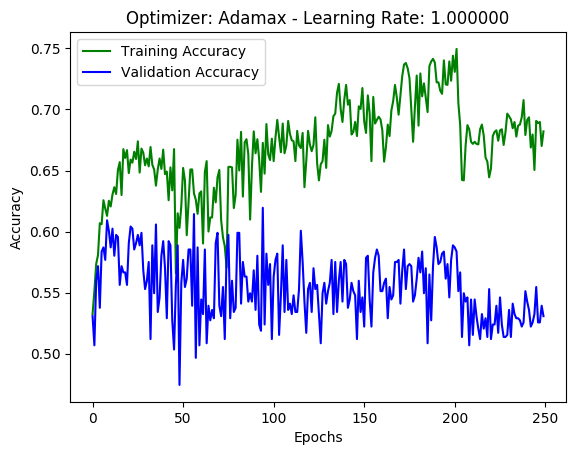

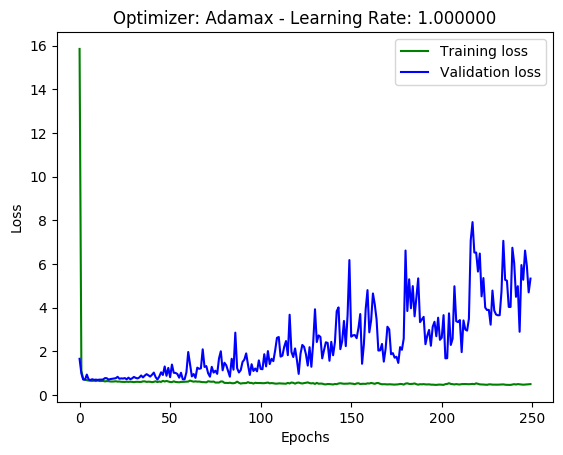

The training accuracy is: 0.6537935733795166
The training loss is: 1.4710350069214202
The test accuracy is: 0.5478142076502732
Train RMSE: 1.21 RMSE
Test RMSE: 2.21 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 275us/sample - loss: 0.6854 - accuracy: 0.5637 - val_loss: 0.6951 - val_accuracy: 0.5410
Epoch 2/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6820 - accuracy: 0.5679 - val_loss: 0.6937 - val_accuracy: 0.5375
Epoch 3/250
2340/2340 [==============================] - 0s 43us/sample - loss: 0.6793 - accuracy: 0.5692 - val_loss: 0.6922 - val_accuracy: 0.5392
Epoch 4/250
2340/2340 [==============================] - 0s 41us/sample - loss: 0.6768 - accuracy: 0.5735 - val_loss: 0.6908 - val_accuracy: 0.5392
Epoch 5/250
2340/2340 [==============================] - 0s 41us/sample - loss: 0.6742 - accuracy: 0.5786 - val_loss: 0.6897 - val_accuracy: 0.5444
Epoch 6/250
2340/2340 [==================

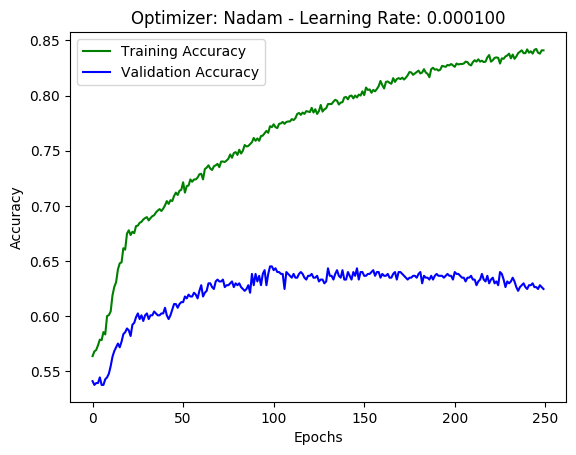

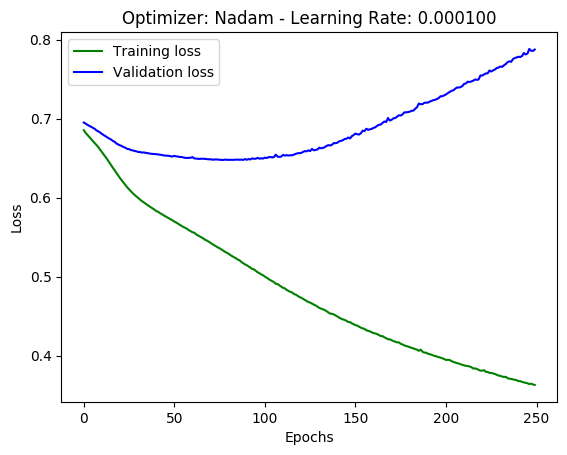

The training accuracy is: 0.8010936379432678
The training loss is: 0.44422313748201275
The test accuracy is: 0.639344262295082
Train RMSE: 0.67 RMSE
Test RMSE: 0.90 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 390us/sample - loss: 0.6802 - accuracy: 0.5585 - val_loss: 0.6851 - val_accuracy: 0.5358
Epoch 2/250
2340/2340 [==============================] - 0s 50us/sample - loss: 0.6553 - accuracy: 0.6085 - val_loss: 0.6682 - val_accuracy: 0.5904
Epoch 3/250
2340/2340 [==============================] - 0s 47us/sample - loss: 0.6275 - accuracy: 0.6581 - val_loss: 0.6581 - val_accuracy: 0.6126
Epoch 4/250
2340/2340 [==============================] - 0s 49us/sample - loss: 0.6074 - accuracy: 0.6735 - val_loss: 0.6543 - val_accuracy: 0.6058
Epoch 5/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.5903 - accuracy: 0.6889 - val_loss: 0.6511 - val_accuracy: 0.6314
Epoch 6/250
2340/2340 [==================

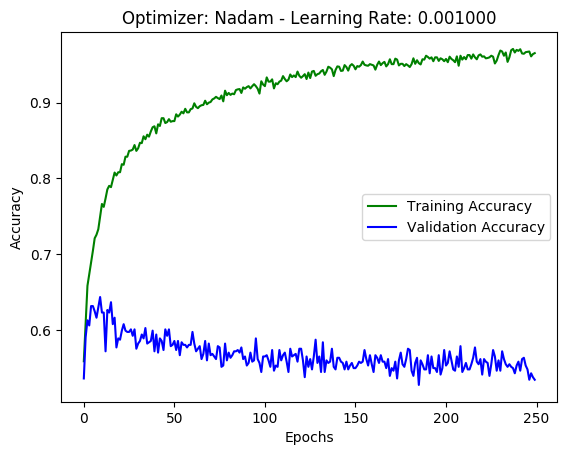

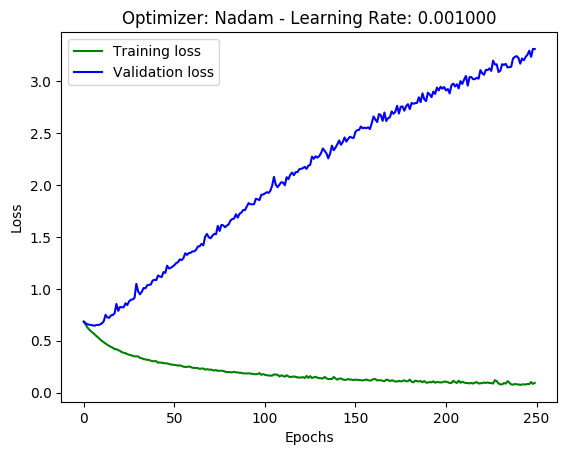

The training accuracy is: 0.8841421604156494
The training loss is: 0.725361669473019
The test accuracy is: 0.569672131147541
Train RMSE: 0.85 RMSE
Test RMSE: 1.77 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 405us/sample - loss: 0.6688 - accuracy: 0.5902 - val_loss: 0.6713 - val_accuracy: 0.6177
Epoch 2/250
2340/2340 [==============================] - 0s 49us/sample - loss: 0.6327 - accuracy: 0.6436 - val_loss: 0.6919 - val_accuracy: 0.5478
Epoch 3/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.6138 - accuracy: 0.6628 - val_loss: 0.6778 - val_accuracy: 0.5939
Epoch 4/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.5939 - accuracy: 0.6846 - val_loss: 0.6919 - val_accuracy: 0.5990
Epoch 5/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.5737 - accuracy: 0.7073 - val_loss: 0.6587 - val_accuracy: 0.6212
Epoch 6/250
2340/2340 [====================

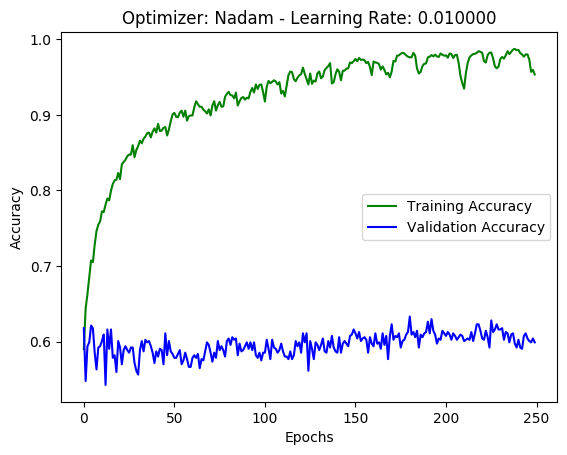

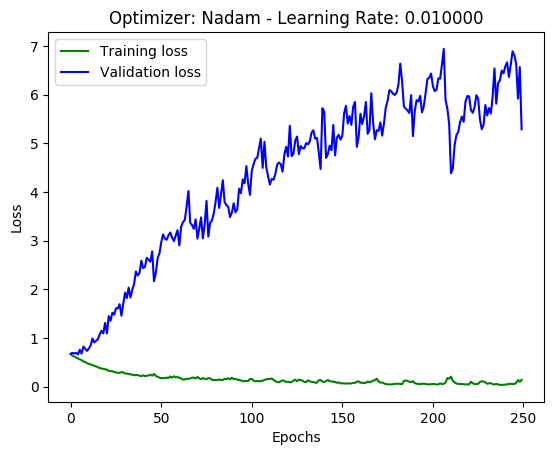

The training accuracy is: 0.8933697938919067
The training loss is: 1.1381986110852502
The test accuracy is: 0.5983606557377049
Train RMSE: 1.07 RMSE
Test RMSE: 2.23 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 294us/sample - loss: 0.7401 - accuracy: 0.5679 - val_loss: 0.6943 - val_accuracy: 0.5375
Epoch 2/250
2340/2340 [==============================] - 0s 55us/sample - loss: 0.6667 - accuracy: 0.5987 - val_loss: 0.7771 - val_accuracy: 0.4659
Epoch 3/250
2340/2340 [==============================] - 0s 49us/sample - loss: 0.6704 - accuracy: 0.6137 - val_loss: 0.8113 - val_accuracy: 0.5290
Epoch 4/250
2340/2340 [==============================] - 0s 51us/sample - loss: 0.6547 - accuracy: 0.6209 - val_loss: 0.7882 - val_accuracy: 0.5512
Epoch 5/250
2340/2340 [==============================] - 0s 50us/sample - loss: 0.6741 - accuracy: 0.6192 - val_loss: 0.7169 - val_accuracy: 0.5478
Epoch 6/250
2340/2340 [==================

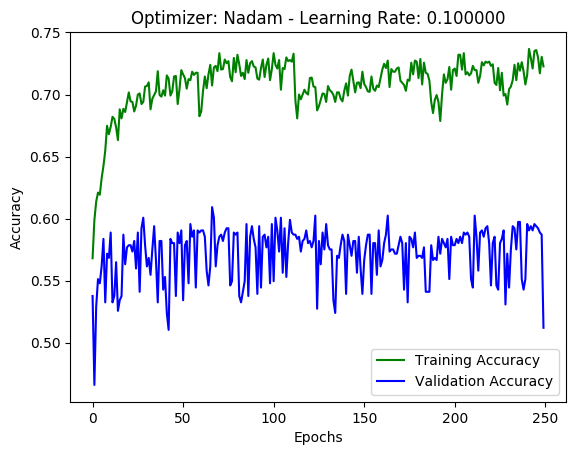

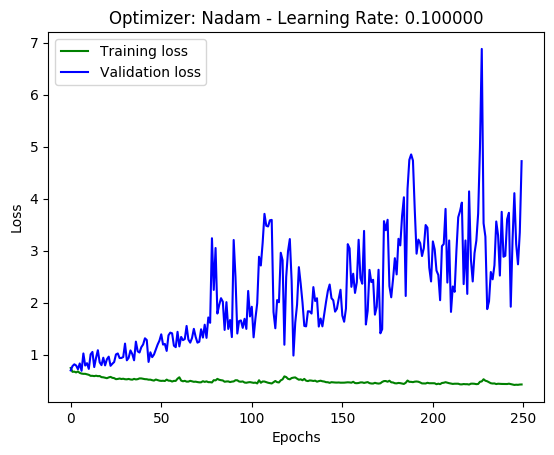

The training accuracy is: 0.5023923516273499
The training loss is: 5.458197387374597
The test accuracy is: 0.5259562841530054
Train RMSE: 2.34 RMSE
Test RMSE: 2.09 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 422us/sample - loss: 59.1051 - accuracy: 0.5137 - val_loss: 0.8175 - val_accuracy: 0.5358
Epoch 2/250
2340/2340 [==============================] - 0s 50us/sample - loss: 0.7854 - accuracy: 0.5295 - val_loss: 1.7666 - val_accuracy: 0.4659
Epoch 3/250
2340/2340 [==============================] - 0s 52us/sample - loss: 0.7507 - accuracy: 0.5175 - val_loss: 0.9891 - val_accuracy: 0.4659
Epoch 4/250
2340/2340 [==============================] - 0s 47us/sample - loss: 0.7458 - accuracy: 0.4974 - val_loss: 1.1196 - val_accuracy: 0.4659
Epoch 5/250
2340/2340 [==============================] - 0s 50us/sample - loss: 0.7282 - accuracy: 0.5239 - val_loss: 0.8116 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [==================

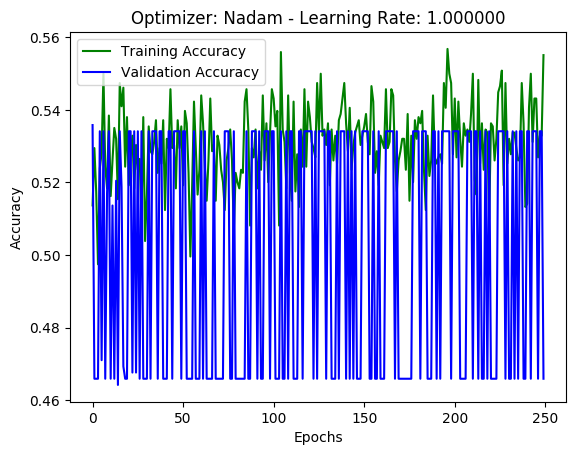

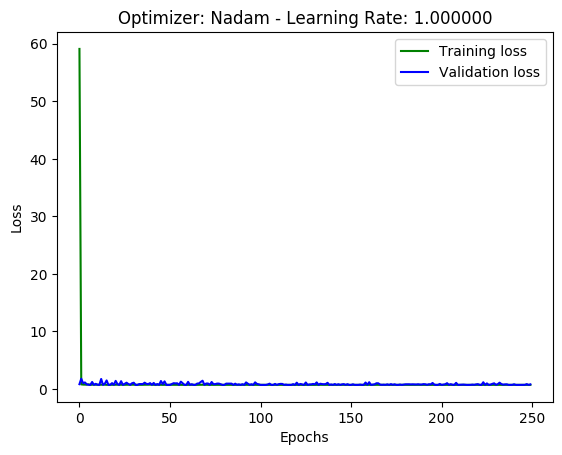

The training accuracy is: 0.44224196672439575
The training loss is: 0.8012809975051097
The test accuracy is: 0.47540983606557374
Train RMSE: 0.90 RMSE
Test RMSE: 0.88 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 159us/sample - loss: 0.6932 - accuracy: 0.5624 - val_loss: 0.6931 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 44us/sample - loss: 0.6930 - accuracy: 0.5637 - val_loss: 0.6931 - val_accuracy: 0.5341
Epoch 3/250
2340/2340 [==============================] - 0s 42us/sample - loss: 0.6930 - accuracy: 0.5637 - val_loss: 0.6931 - val_accuracy: 0.5341
Epoch 4/250
2340/2340 [==============================] - 0s 40us/sample - loss: 0.6930 - accuracy: 0.5637 - val_loss: 0.6930 - val_accuracy: 0.5341
Epoch 5/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6929 - accuracy: 0.5637 - val_loss: 0.6930 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [================

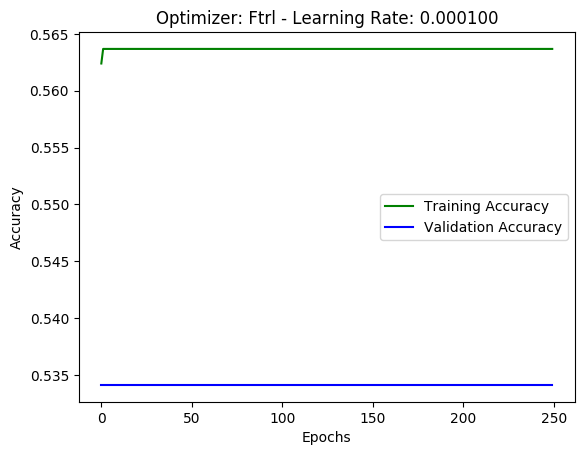

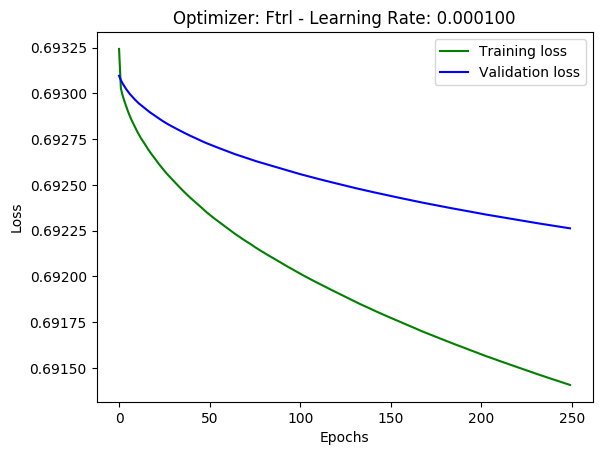

The training accuracy is: 0.5577580332756042
The training loss is: 0.6915778410573243
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 161us/sample - loss: 0.6925 - accuracy: 0.5641 - val_loss: 0.6927 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6920 - accuracy: 0.5637 - val_loss: 0.6925 - val_accuracy: 0.5341
Epoch 3/250
2340/2340 [==============================] - 0s 50us/sample - loss: 0.6917 - accuracy: 0.5637 - val_loss: 0.6923 - val_accuracy: 0.5341
Epoch 4/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.6914 - accuracy: 0.5637 - val_loss: 0.6922 - val_accuracy: 0.5341
Epoch 5/250
2340/2340 [==============================] - 0s 48us/sample - loss: 0.6912 - accuracy: 0.5637 - val_loss: 0.6921 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [==================

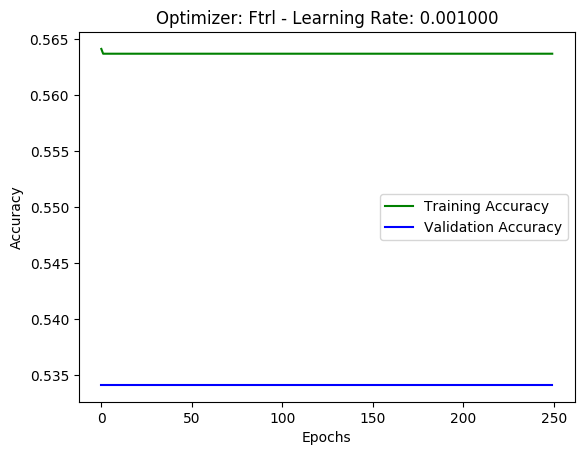

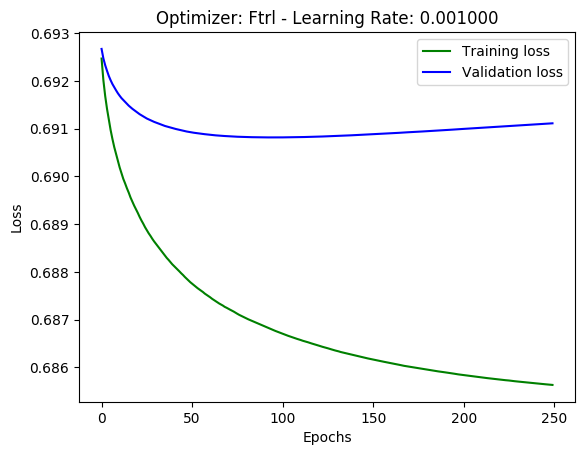

The training accuracy is: 0.5577580332756042
The training loss is: 0.6867282464743801
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 176us/sample - loss: 0.6897 - accuracy: 0.5620 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 47us/sample - loss: 0.6867 - accuracy: 0.5637 - val_loss: 0.6909 - val_accuracy: 0.5341
Epoch 3/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6861 - accuracy: 0.5637 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 4/250
2340/2340 [==============================] - 0s 51us/sample - loss: 0.6857 - accuracy: 0.5637 - val_loss: 0.6911 - val_accuracy: 0.5341
Epoch 5/250
2340/2340 [==============================] - 0s 45us/sample - loss: 0.6856 - accuracy: 0.5637 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [==================

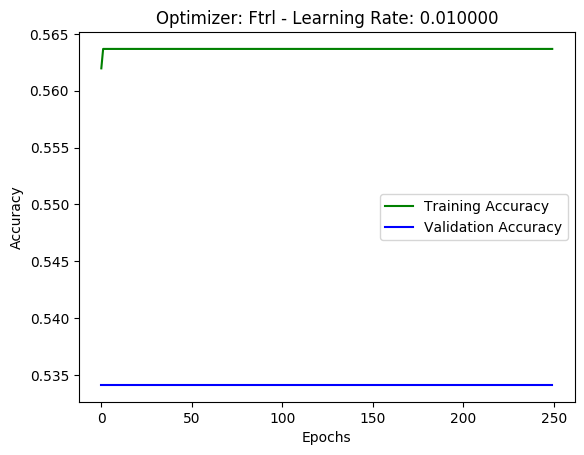

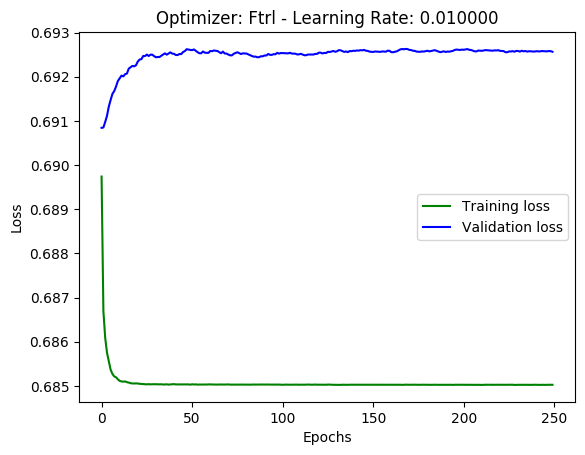

The training accuracy is: 0.5577580332756042
The training loss is: 0.6865281571856282
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 1s 303us/sample - loss: 0.6865 - accuracy: 0.5611 - val_loss: 0.6940 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 50us/sample - loss: 0.6858 - accuracy: 0.5637 - val_loss: 0.6917 - val_accuracy: 0.5341
Epoch 3/250
2340/2340 [==============================] - 0s 50us/sample - loss: 0.6855 - accuracy: 0.5637 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 4/250
2340/2340 [==============================] - 0s 53us/sample - loss: 0.6854 - accuracy: 0.5637 - val_loss: 0.6914 - val_accuracy: 0.5341
Epoch 5/250
2340/2340 [==============================] - 0s 55us/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6939 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [==================

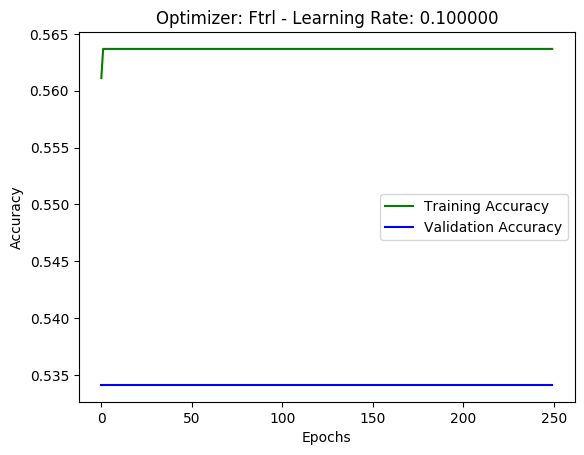

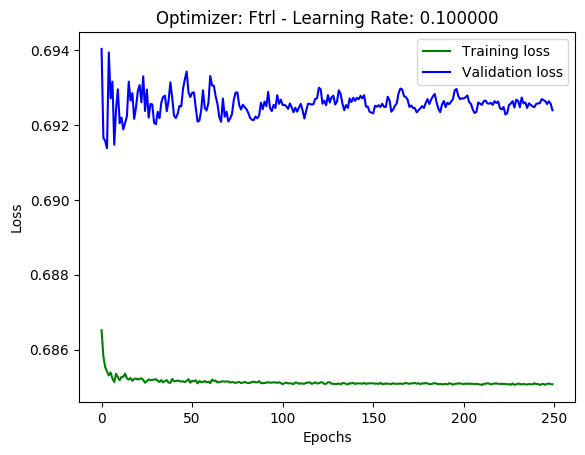

The training accuracy is: 0.5577580332756042
The training loss is: 0.6864985227992253
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/250
2340/2340 [==============================] - 0s 165us/sample - loss: 0.6934 - accuracy: 0.5479 - val_loss: 0.7129 - val_accuracy: 0.5341
Epoch 2/250
2340/2340 [==============================] - 0s 108us/sample - loss: 0.6910 - accuracy: 0.5474 - val_loss: 0.7121 - val_accuracy: 0.4659
Epoch 3/250
2340/2340 [==============================] - 0s 51us/sample - loss: 0.6895 - accuracy: 0.5585 - val_loss: 0.6995 - val_accuracy: 0.4659
Epoch 4/250
2340/2340 [==============================] - 0s 49us/sample - loss: 0.6885 - accuracy: 0.5543 - val_loss: 0.6944 - val_accuracy: 0.4659
Epoch 5/250
2340/2340 [==============================] - 0s 53us/sample - loss: 0.6871 - accuracy: 0.5560 - val_loss: 0.7108 - val_accuracy: 0.5341
Epoch 6/250
2340/2340 [=================

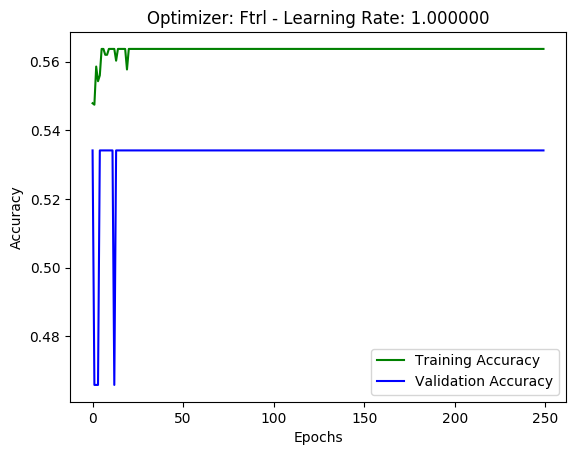

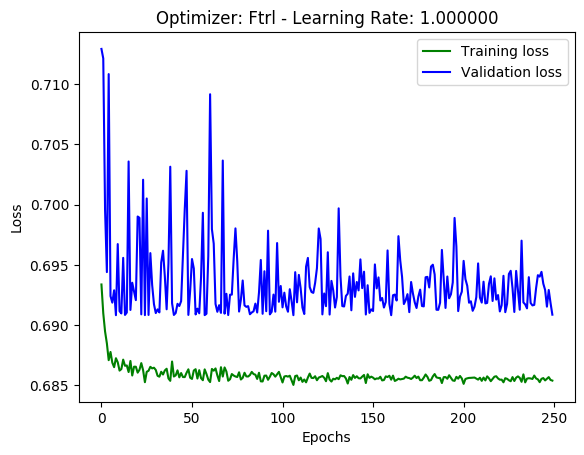

The training accuracy is: 0.5577580332756042
The training loss is: 0.6871894211778882
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE



In [ ]:
# List of optimizers and learning rates to be looped through
list_optimizers = ['Adam', 'SGD', 'Adadelta', 'RMSprop', 'Adagrad', 'Adamax', 'Nadam', 'Ftrl']
learning_rates = [0.0001, 0.001, 0.01, 0.1, 1.0]

# Number of epochs per model
nn_epochs = 250

# Validation Split
val_split = 0.2

# Initializing a DataFrame to save each model results
nn_results = pd.DataFrame()

# Loop
for opt in list_optimizers:
    for lr in learning_rates:
        
        # Building a multilayer neural network using Keras
        model = Sequential()
        #model.add(Dense(64, input_dim = dims, activation = 'relu'))
        #model.add(Dense(32, activation = 'softmax'))
        model.add(Dense(70, input_dim = dims, activation = 'relu'))
        model.add(Dense(35, activation = 'relu'))
        model.add(Dense(2, activation = 'softmax'))
        
        
        # Compile the model to provide the training parameters
        model.compile(optimizer = select_optimizer(opt, lr), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
        #model.compile(optimizer = select_optimizer(opt, lr), loss = 'binary_crossentropy', metrics = ['accuracy'])
        #model.compile(optimizer = select_optimizer(opt, lr), loss = 'categorical_crossentropy', metrics = ['accuracy'])
        
        # Train the model
        nn_history = model.fit(X_train, y_train, epochs = nn_epochs, verbose = 1, validation_split = val_split)
        
        # Evaluate the trained model
        nn_eval = model.evaluate(X_train, y_train)
        
        # Predicting using the testing data
        y_test_pred = model.predict_classes(X_test)
        test_accuracy = accuracy_score(y_test, y_test_pred)
        
        # New row for results dataframe containing model hyperparameters and results
        new_row = {'epochs': nn_epochs,
                   'validation_split': val_split,
                   'training accuracy': nn_eval[1],
                   'training loss': nn_eval[0],
                   'testing accuracy': test_accuracy,
                   'optimizer': str(opt),
                   'learning_rate': lr
                   }
        nn_results = nn_results.append(new_row, ignore_index = True)
        
        # Plot Accuracy
        loss_train = nn_history.history['accuracy']
        loss_val = nn_history.history['val_accuracy']
        epochs = range(0, nn_epochs)
        plt.plot(epochs, loss_train, 'g', label = 'Training Accuracy')
        plt.plot(epochs, loss_val, 'b', label = 'Validation Accuracy')
        plt.title("Optimizer: %s - Learning Rate: %f" % (opt, lr))
        #plt.title('Training and Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.show()
        
        # Plot Loss
        loss_train = nn_history.history['loss']
        loss_val = nn_history.history['val_loss']
        epochs = range(0, nn_epochs)
        plt.plot(epochs, loss_train, 'g', label = 'Training loss')
        plt.plot(epochs, loss_val, 'b', label = 'Validation loss')
        plt.title("Optimizer: %s - Learning Rate: %f" % (opt, lr))
        #plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()
        
        # Printing metrics
        print(f"The training accuracy is: {nn_eval[1]}")
        print(f"The training loss is: {nn_eval[0]}")
        print(f"The test accuracy is: {test_accuracy}")
        get_rmse(model)
        print()

In [ ]:
nn_results = nn_results.sort_values(by = 'testing accuracy', ascending = True)
nn_results.head(50)

,epochs,learning_rate,optimizer,testing accuracy,training accuracy,training loss,validation_split
19,250.0,1.0000,RMSprop,0.475410,0.442242,0.895485,0.2
4,250.0,1.0000,Adam,0.475410,0.442242,0.698330,0.2
34,250.0,1.0000,Nadam,0.475410,0.442242,0.801281,0.2
18,250.0,0.1000,RMSprop,0.512295,0.532468,2.546759,0.2
37,250.0,0.0100,Ftrl,0.524590,0.557758,0.686528,0.2
36,250.0,0.0010,Ftrl,0.524590,0.557758,0.686728,0.2
35,250.0,0.0001,Ftrl,0.524590,0.557758,0.691578,0.2
38,250.0,0.1000,Ftrl,0.524590,0.557758,0.686499,0.2
11,250.0,0.0010,Adadelta,0.524590,0.560150,0.682722,0.2
39,250.0,1.0000,Ftrl,0.524590,0.557758,0.687189,0.2


#### stack

In [ ]:
rnn = Sequential()

rnn.add(Reshape((70, 1), input_shape = (70,)))

#rnn.add(LSTM(70, input_shape = (10, 1), return_sequences= True))
rnn.add(LSTM(70, input_shape = (10, 1)))
rnn.add(Dense(35, activation = 'relu'))
#rnn.add(LSTM(200, return_sequences= True))
#rnn.add(GRU(50))
rnn.add(Dense(2, activation = 'softmax'))

In [ ]:
rnn.compile(optimizer = 'adagrad', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
rnn.summary()

Model: "sequential_628"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_21 (Reshape)         (None, 70, 1)             0         
_________________________________________________________________
lstm_28 (LSTM)               (None, 70)                20160     
_________________________________________________________________
dense_1519 (Dense)           (None, 35)                2485      
_________________________________________________________________
dense_1520 (Dense)           (None, 2)                 72        
Total params: 22,717
Trainable params: 22,717
Non-trainable params: 0
_________________________________________________________________


In [ ]:
#from tabnanny import verbose

rnn.fit(X_train, y_train, epochs = 25, batch_size = 10, verbose = 1, validation_split= .2)

Train on 2340 samples, validate on 586 samples
Epoch 1/25
2340/2340 [==============================] - 9s 4ms/sample - loss: 0.6861 - accuracy: 0.5637 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 2/25
2340/2340 [==============================] - 6s 2ms/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6918 - val_accuracy: 0.5341
Epoch 3/25
2340/2340 [==============================] - 6s 3ms/sample - loss: 0.6852 - accuracy: 0.5637 - val_loss: 0.6919 - val_accuracy: 0.5341
Epoch 4/25
2340/2340 [==============================] - 6s 3ms/sample - loss: 0.6852 - accuracy: 0.5637 - val_loss: 0.6920 - val_accuracy: 0.5341
Epoch 5/25
2340/2340 [==============================] - 6s 3ms/sample - loss: 0.6851 - accuracy: 0.5637 - val_loss: 0.6921 - val_accuracy: 0.5341
Epoch 6/25
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6851 - accuracy: 0.5637 - val_loss: 0.6921 - val_accuracy: 0.5341
Epoch 7/25
2340/2340 [==============================] - 6s 2ms/sample - loss:

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6938 - accuracy: 0.5034 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6870 - accuracy: 0.5637 - val_loss: 0.6907 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6859 - accuracy: 0.5637 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6855 - accuracy: 0.5637 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 250us/sample - loss: 0.6864 - accuracy: 0.5578


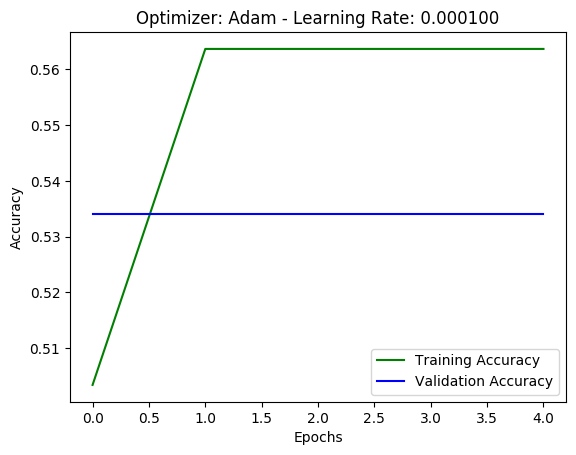

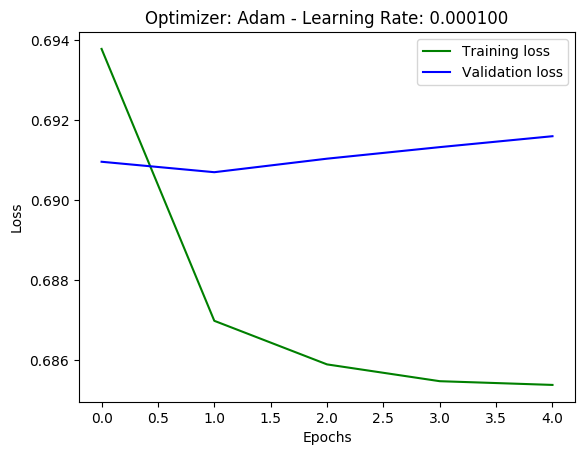

The training accuracy is: 0.5577580332756042
The training loss is: 0.6864479055000509
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6859 - accuracy: 0.5637 - val_loss: 0.6922 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6854 - accuracy: 0.5637 - val_loss: 0.6922 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6850 - accuracy: 0.5637 - val_loss: 0.6924 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6841 - accuracy: 0.5650 - val_loss: 0.6920 - val_accuracy: 0.5273
Epoch 5/5
2926/2926 [==============================] - 1s 255us/sample - loss: 0.6839 - accuracy: 0.5578


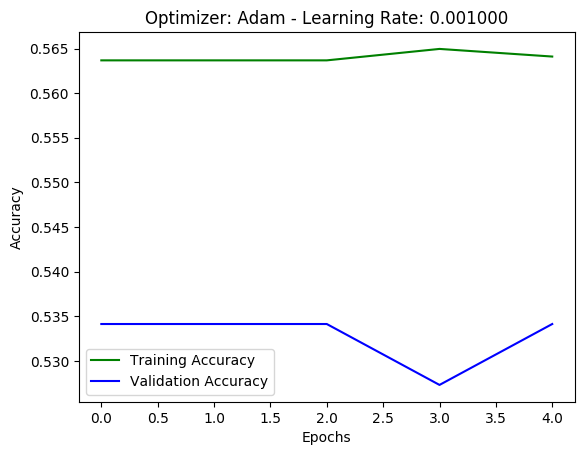

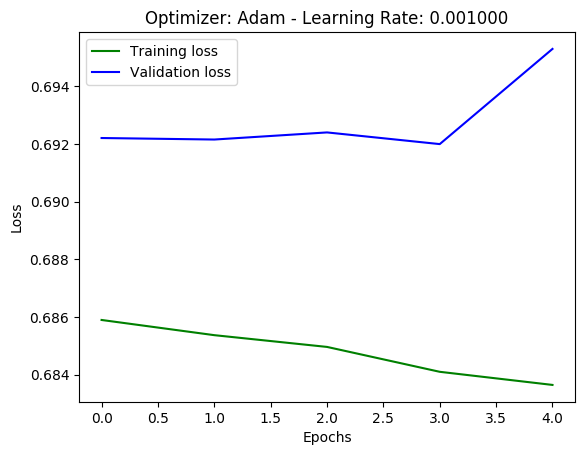

The training accuracy is: 0.5577580332756042
The training loss is: 0.6839381504857369
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6903 - accuracy: 0.5551 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 956us/sample - loss: 0.6860 - accuracy: 0.5637 - val_loss: 0.6917 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6860 - accuracy: 0.5637 - val_loss: 0.6927 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6850 - accuracy: 0.5637 - val_loss: 0.6909 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 239us/sample - loss: 0.6868 - accuracy: 0.5578


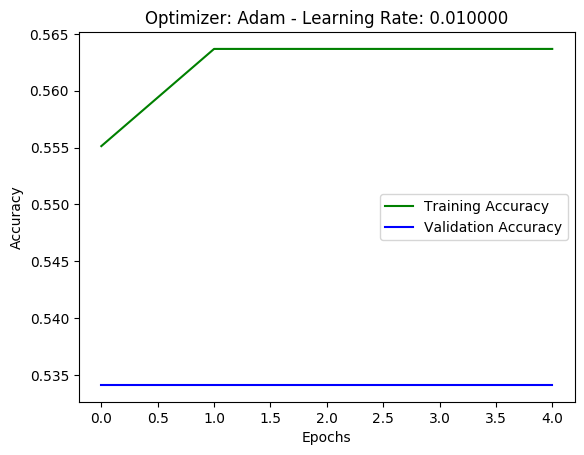

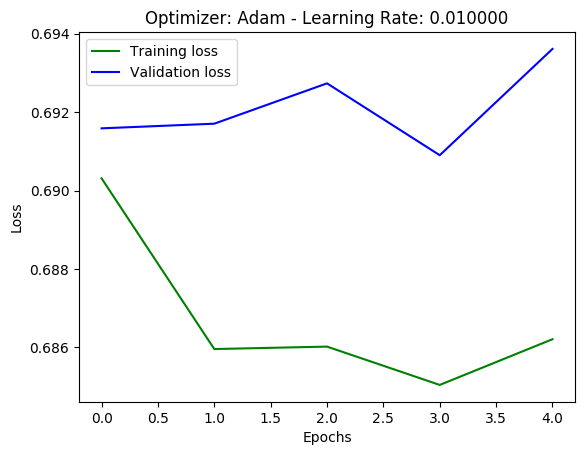

The training accuracy is: 0.5577580332756042
The training loss is: 0.6867511890069801
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.9255 - accuracy: 0.5316 - val_loss: 0.6933 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6869 - accuracy: 0.5637 - val_loss: 0.6932 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6886 - accuracy: 0.5534 - val_loss: 0.6952 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6877 - accuracy: 0.5637 - val_loss: 0.6911 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 213us/sample - loss: 0.6869 - accuracy: 0.5578


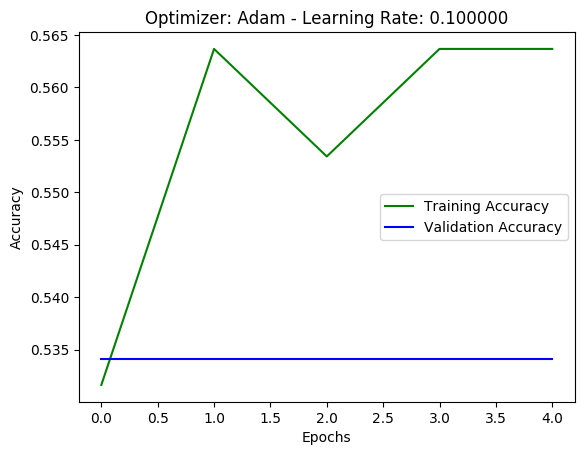

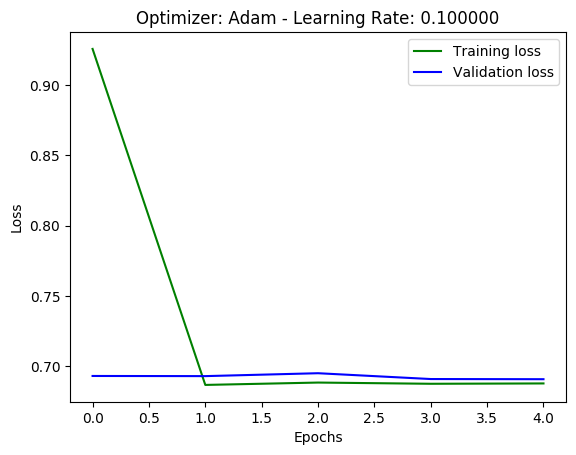

The training accuracy is: 0.5577580332756042
The training loss is: 0.6868968000578212
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 4.3869 - accuracy: 0.5389 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 911us/sample - loss: 0.7151 - accuracy: 0.5081 - val_loss: 0.7204 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.7020 - accuracy: 0.5397 - val_loss: 0.7116 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.7126 - accuracy: 0.5141 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 249us/sample - loss: 1.0000 - accuracy: 0.5578


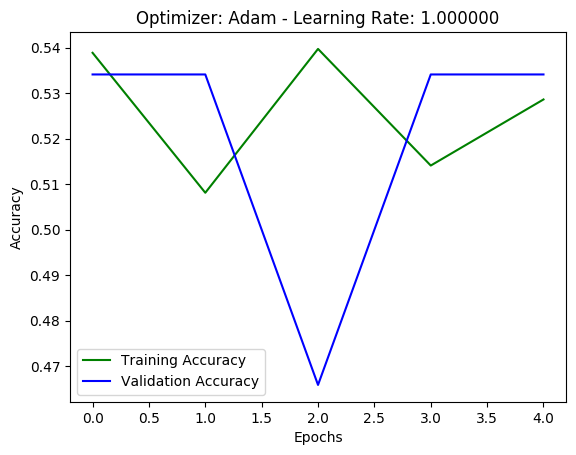

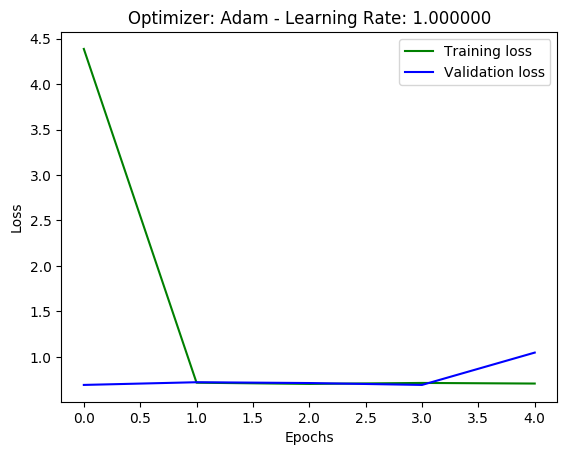

The training accuracy is: 0.5577580332756042
The training loss is: 1.0000191350465593
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 6s 2ms/sample - loss: 0.6959 - accuracy: 0.4363 - val_loss: 0.6947 - val_accuracy: 0.4659
Epoch 2/5
2340/2340 [==============================] - 2s 930us/sample - loss: 0.6957 - accuracy: 0.4363 - val_loss: 0.6946 - val_accuracy: 0.4659
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6956 - accuracy: 0.4363 - val_loss: 0.6945 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6954 - accuracy: 0.4363 - val_loss: 0.6944 - val_accuracy: 0.4659
Epoch 5/5
2926/2926 [==============================] - 1s 214us/sample - loss: 0.6950 - accuracy: 0.4422


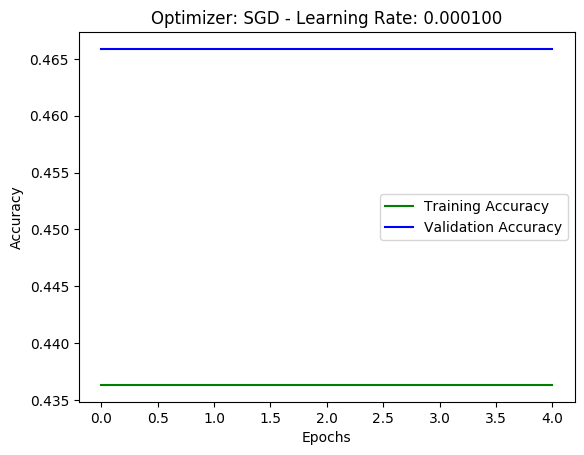

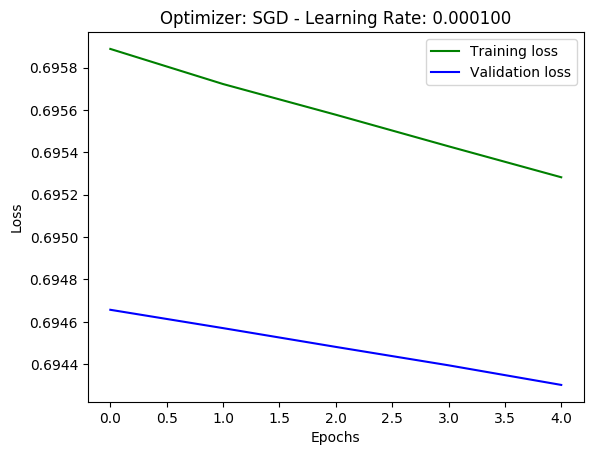

The training accuracy is: 0.44224196672439575
The training loss is: 0.6950183453742397
The test accuracy is: 0.47540983606557374
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6920 - accuracy: 0.5637 - val_loss: 0.6923 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6909 - accuracy: 0.5637 - val_loss: 0.6919 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6901 - accuracy: 0.5637 - val_loss: 0.6915 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6894 - accuracy: 0.5637 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 406us/sample - loss: 0.6890 - accuracy: 0.5578


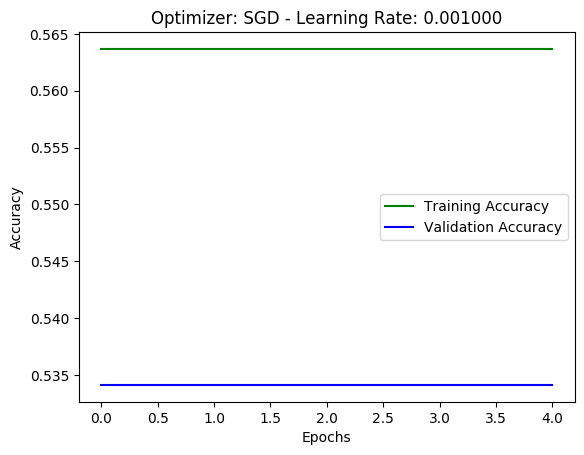

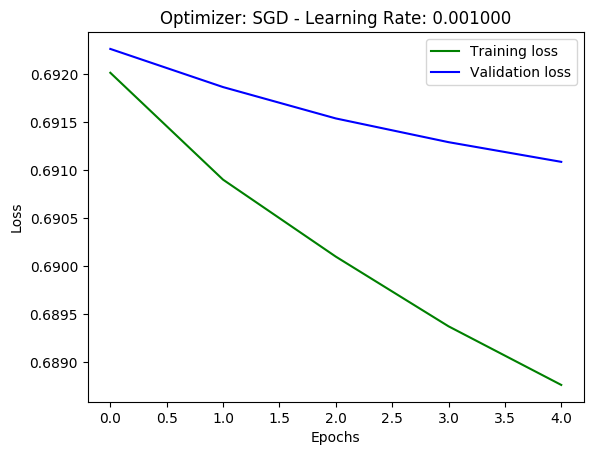

The training accuracy is: 0.5577580332756042
The training loss is: 0.6889501723702118
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6865 - accuracy: 0.5637 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 902us/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6917 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 2s 952us/sample - loss: 0.6852 - accuracy: 0.5637 - val_loss: 0.6915 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 221us/sample - loss: 0.6866 - accuracy: 0.5578


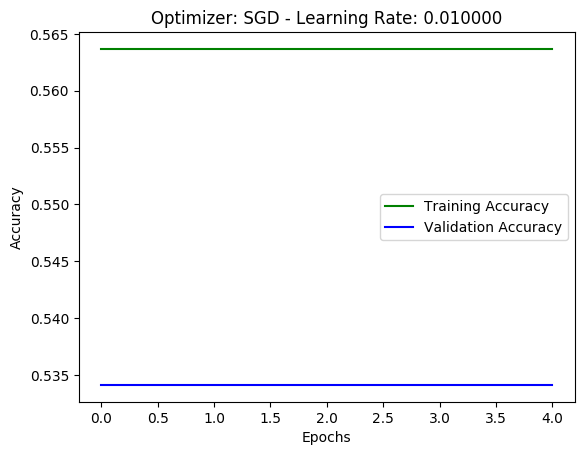

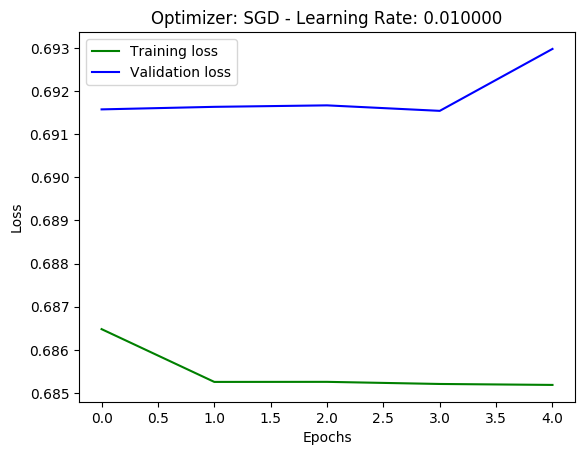

The training accuracy is: 0.5577580332756042
The training loss is: 0.6866027398298477
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6864 - accuracy: 0.5637 - val_loss: 0.6945 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 918us/sample - loss: 0.6864 - accuracy: 0.5637 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6862 - accuracy: 0.5637 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 2s 882us/sample - loss: 0.6860 - accuracy: 0.5637 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 251us/sample - loss: 0.6892 - accuracy: 0.5578


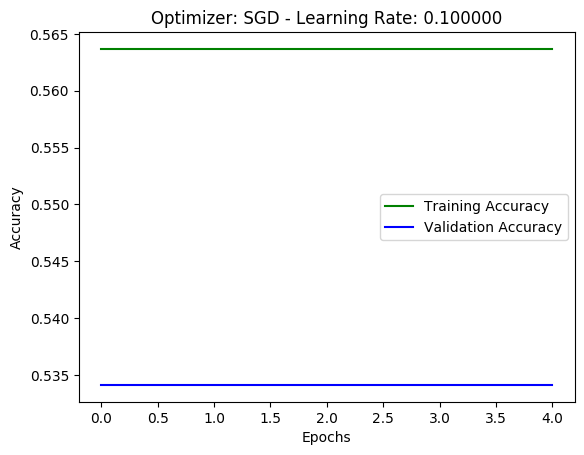

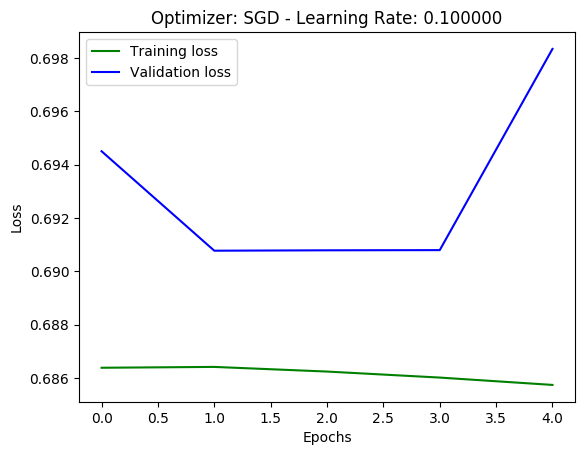

The training accuracy is: 0.5577580332756042
The training loss is: 0.6892473002614342
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6904 - accuracy: 0.5474 - val_loss: 0.7115 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6917 - accuracy: 0.5432 - val_loss: 0.7728 - val_accuracy: 0.4659
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6934 - accuracy: 0.5466 - val_loss: 0.7285 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6921 - accuracy: 0.5423 - val_loss: 0.7178 - val_accuracy: 0.4659
Epoch 5/5
2926/2926 [==============================] - 1s 243us/sample - loss: 0.7265 - accuracy: 0.5578


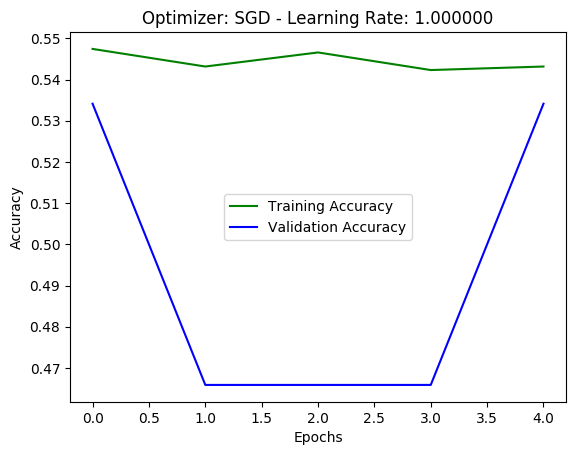

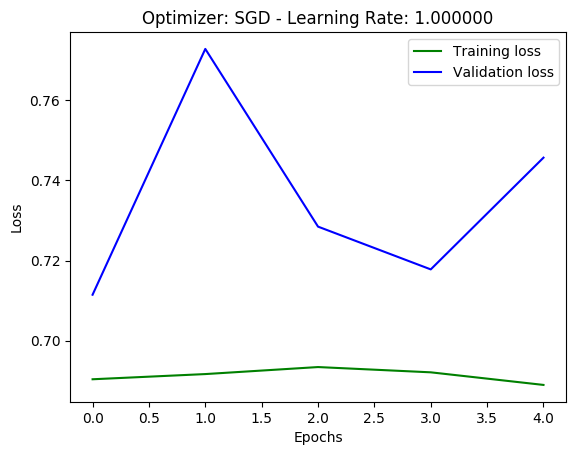

The training accuracy is: 0.5577580332756042
The training loss is: 0.7264714830555659
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6933 - accuracy: 0.4427 - val_loss: 0.6933 - val_accuracy: 0.4642
Epoch 2/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6933 - accuracy: 0.4449 - val_loss: 0.6933 - val_accuracy: 0.4659
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6933 - accuracy: 0.4462 - val_loss: 0.6933 - val_accuracy: 0.4625
Epoch 4/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6933 - accuracy: 0.4500 - val_loss: 0.6933 - val_accuracy: 0.4625
Epoch 5/5
2926/2926 [==============================] - 1s 290us/sample - loss: 0.6933 - accuracy: 0.4556


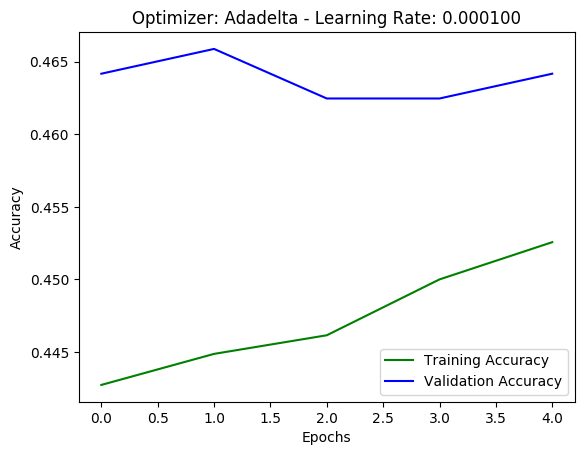

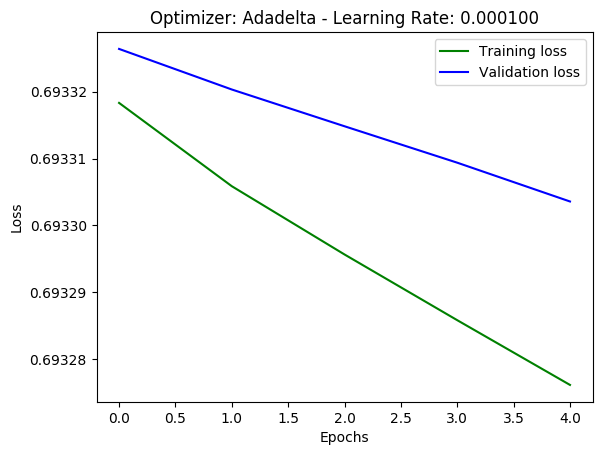

The training accuracy is: 0.4555707573890686
The training loss is: 0.6932772023581676
The test accuracy is: 0.4822404371584699
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6905 - accuracy: 0.5637 - val_loss: 0.6918 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6904 - accuracy: 0.5637 - val_loss: 0.6918 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6903 - accuracy: 0.5637 - val_loss: 0.6917 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6902 - accuracy: 0.5637 - val_loss: 0.6917 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 401us/sample - loss: 0.6904 - accuracy: 0.5578


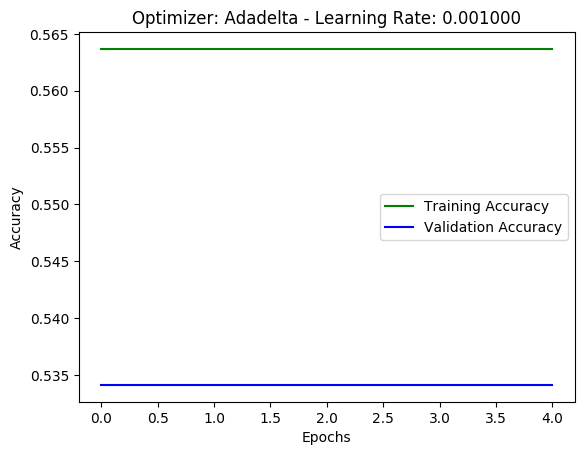

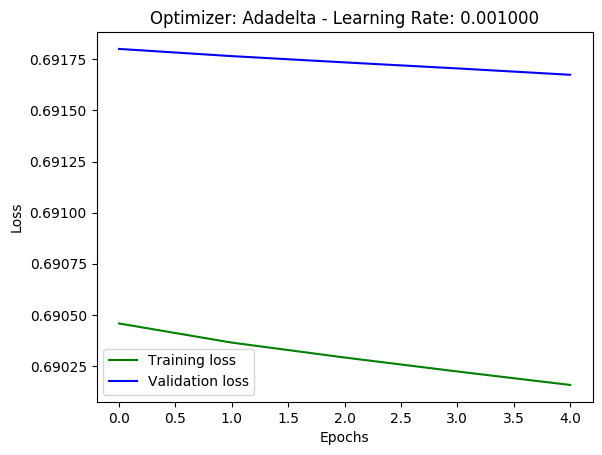

The training accuracy is: 0.5577580332756042
The training loss is: 0.6904296137173536
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6940 - accuracy: 0.4479 - val_loss: 0.6930 - val_accuracy: 0.5188
Epoch 2/5
2340/2340 [==============================] - 2s 984us/sample - loss: 0.6922 - accuracy: 0.5620 - val_loss: 0.6923 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6910 - accuracy: 0.5637 - val_loss: 0.6918 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6901 - accuracy: 0.5637 - val_loss: 0.6915 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 293us/sample - loss: 0.6892 - accuracy: 0.5578


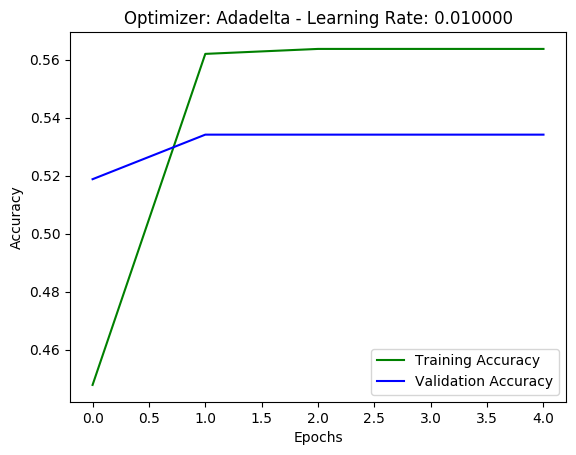

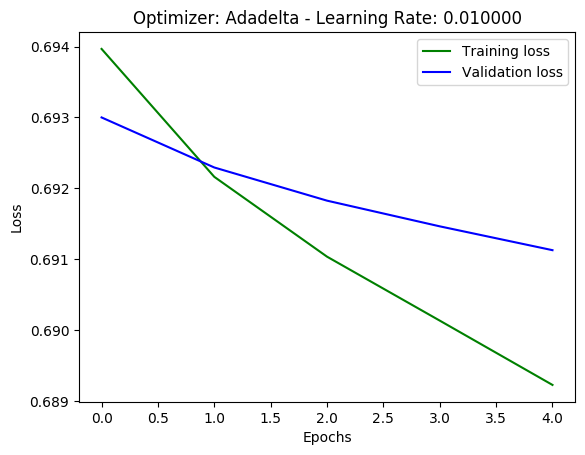

The training accuracy is: 0.5577580332756042
The training loss is: 0.689190943356825
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 6s 2ms/sample - loss: 0.6872 - accuracy: 0.5637 - val_loss: 0.6911 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6854 - accuracy: 0.5637 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6852 - accuracy: 0.5637 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 251us/sample - loss: 0.6865 - accuracy: 0.5578


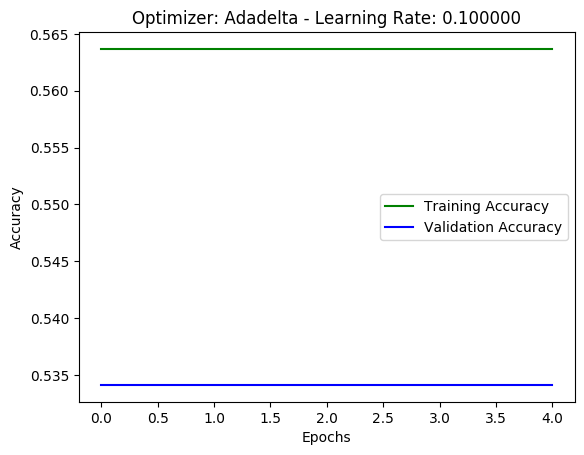

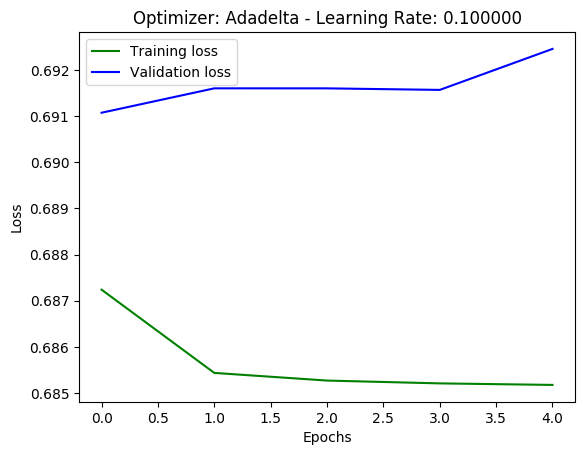

The training accuracy is: 0.5577580332756042
The training loss is: 0.6864984404608883
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6864 - accuracy: 0.5632 - val_loss: 0.6936 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6861 - accuracy: 0.5637 - val_loss: 0.6914 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6856 - accuracy: 0.5637 - val_loss: 0.6912 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6854 - accuracy: 0.5637 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 272us/sample - loss: 0.6874 - accuracy: 0.5578


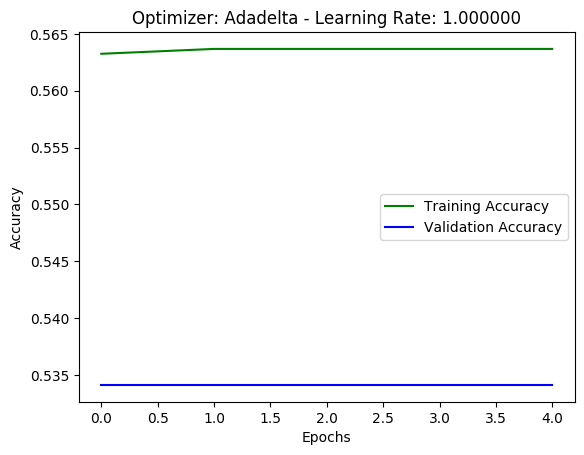

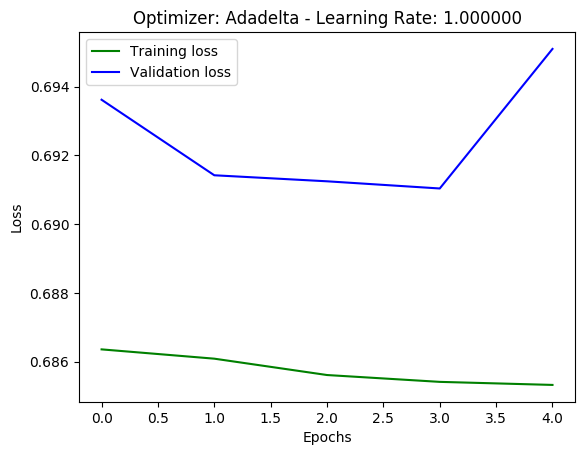

The training accuracy is: 0.5577580332756042
The training loss is: 0.6873901246022625
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6884 - accuracy: 0.5637 - val_loss: 0.6906 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6859 - accuracy: 0.5637 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6855 - accuracy: 0.5637 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 2s 996us/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6914 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 271us/sample - loss: 0.6864 - accuracy: 0.5578


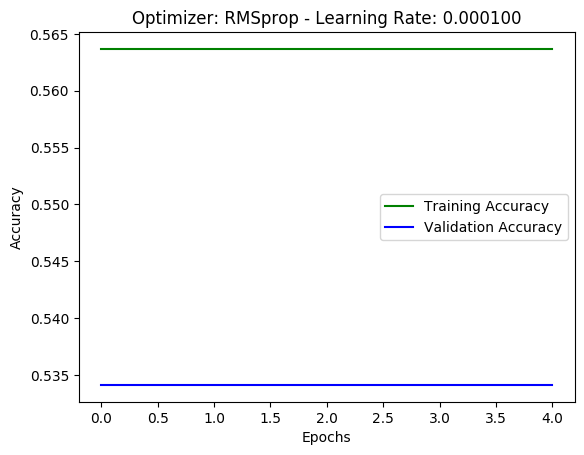

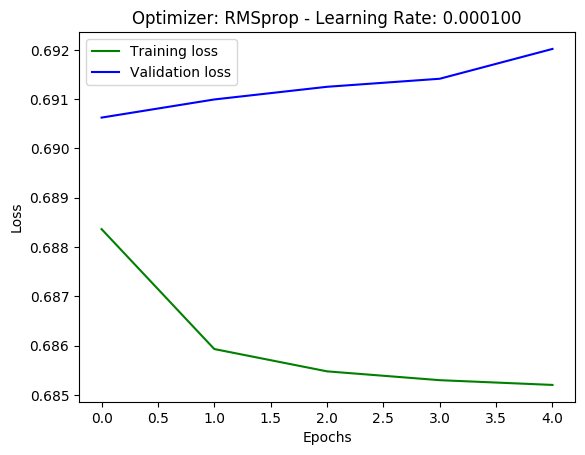

The training accuracy is: 0.5577580332756042
The training loss is: 0.6863922382248483
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6862 - accuracy: 0.5637 - val_loss: 0.6934 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6857 - accuracy: 0.5637 - val_loss: 0.6921 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6851 - accuracy: 0.5637 - val_loss: 0.6911 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6841 - accuracy: 0.5590 - val_loss: 0.6918 - val_accuracy: 0.5222
Epoch 5/5
2926/2926 [==============================] - 1s 213us/sample - loss: 0.6870 - accuracy: 0.5578


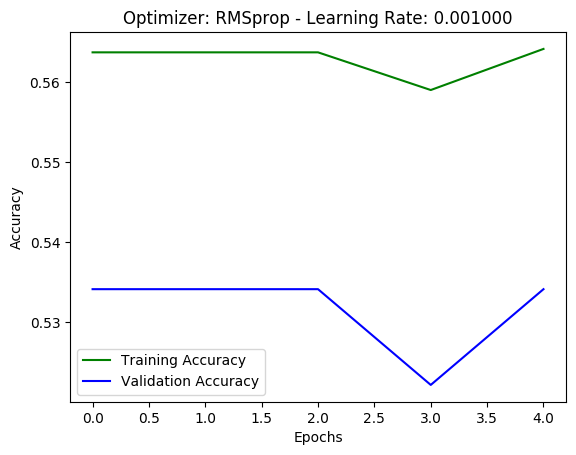

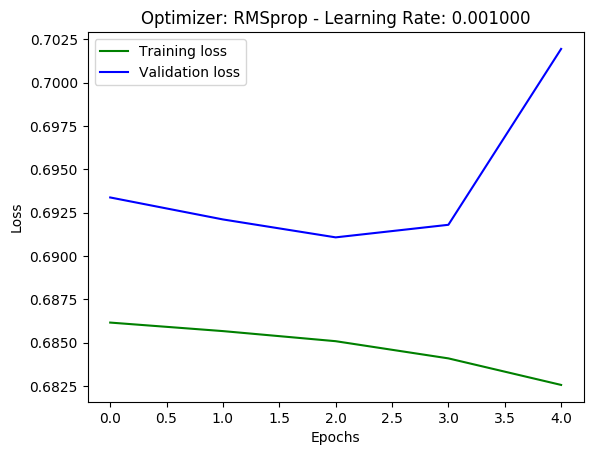

The training accuracy is: 0.5577580332756042
The training loss is: 0.6869978254899046
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6962 - accuracy: 0.5615 - val_loss: 0.6945 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 958us/sample - loss: 0.6900 - accuracy: 0.5611 - val_loss: 0.6907 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6872 - accuracy: 0.5637 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6889 - accuracy: 0.5603 - val_loss: 0.6915 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 294us/sample - loss: 0.6950 - accuracy: 0.5578


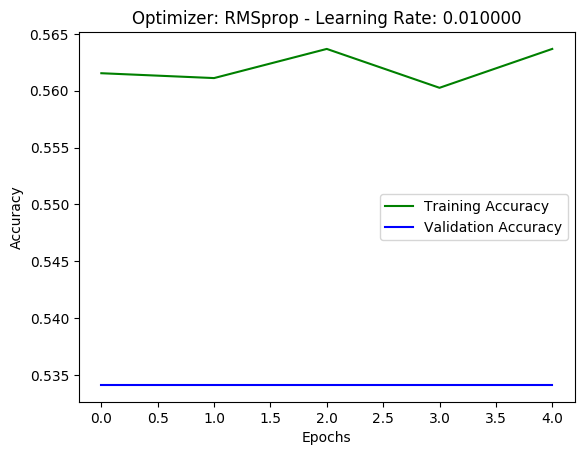

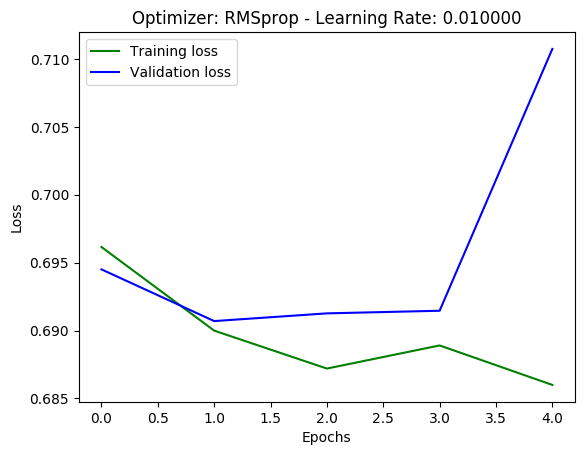

The training accuracy is: 0.5577580332756042
The training loss is: 0.6949955013543062
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 1.3798 - accuracy: 0.5534 - val_loss: 0.7045 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6907 - accuracy: 0.5457 - val_loss: 0.6920 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6903 - accuracy: 0.5543 - val_loss: 0.7145 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6920 - accuracy: 0.5406 - val_loss: 0.6986 - val_accuracy: 0.4659
Epoch 5/5
2926/2926 [==============================] - 1s 406us/sample - loss: 0.7264 - accuracy: 0.5578


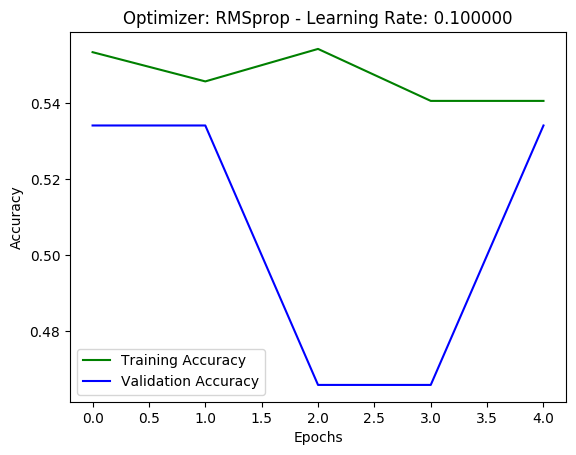

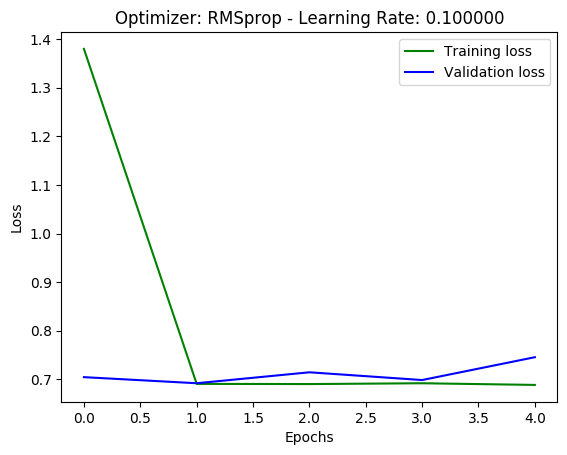

The training accuracy is: 0.5577580332756042
The training loss is: 0.7263802267555007
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 29.0542 - accuracy: 0.5355 - val_loss: 1.0794 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.8072 - accuracy: 0.5167 - val_loss: 1.9984 - val_accuracy: 0.4659
Epoch 3/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.8283 - accuracy: 0.5013 - val_loss: 0.9637 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.8391 - accuracy: 0.4833 - val_loss: 1.2034 - val_accuracy: 0.4659
Epoch 5/5
2926/2926 [==============================] - 1s 219us/sample - loss: 0.9829 - accuracy: 0.5578


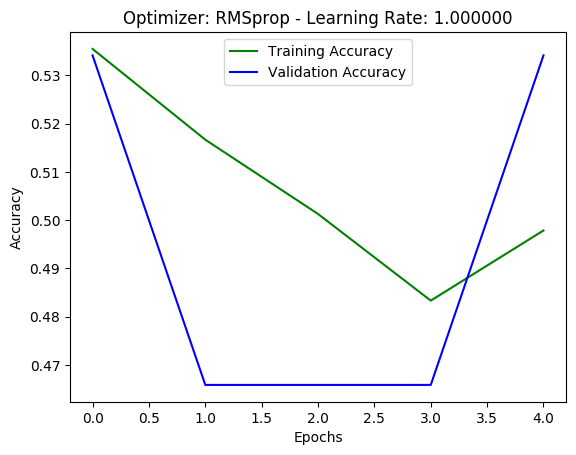

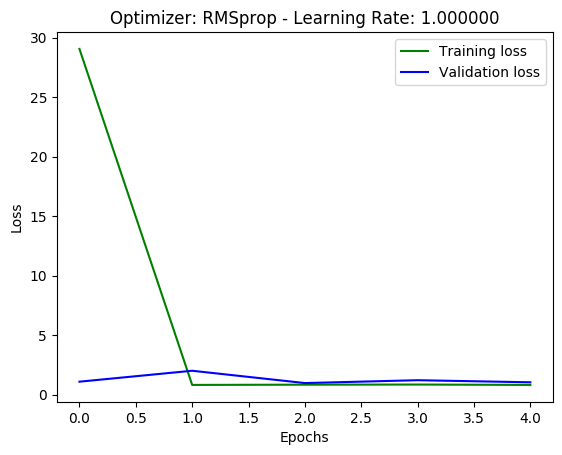

The training accuracy is: 0.5577580332756042
The training loss is: 0.9829435401067127
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6937 - accuracy: 0.4359 - val_loss: 0.6933 - val_accuracy: 0.4710
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6933 - accuracy: 0.4568 - val_loss: 0.6931 - val_accuracy: 0.5017
Epoch 3/5
2340/2340 [==============================] - 2s 963us/sample - loss: 0.6931 - accuracy: 0.5333 - val_loss: 0.6930 - val_accuracy: 0.5307
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6929 - accuracy: 0.5590 - val_loss: 0.6929 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 356us/sample - loss: 0.6926 - accuracy: 0.5581


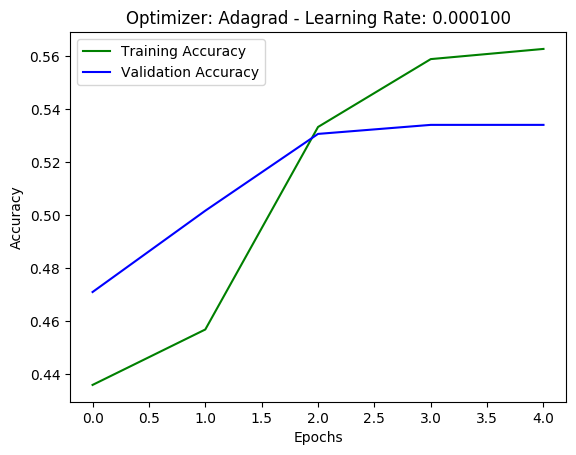

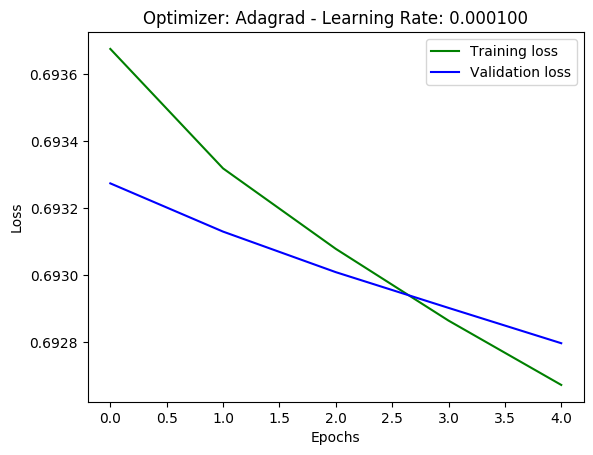

The training accuracy is: 0.5580998063087463
The training loss is: 0.6926119289248265
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6881 - accuracy: 0.5637 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 917us/sample - loss: 0.6868 - accuracy: 0.5637 - val_loss: 0.6907 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6863 - accuracy: 0.5637 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6859 - accuracy: 0.5637 - val_loss: 0.6909 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 240us/sample - loss: 0.6866 - accuracy: 0.5578


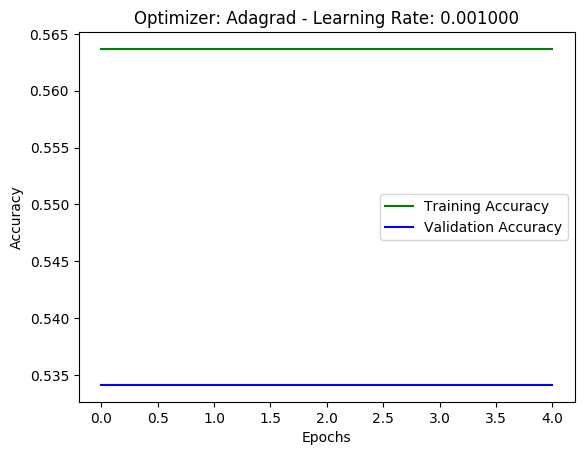

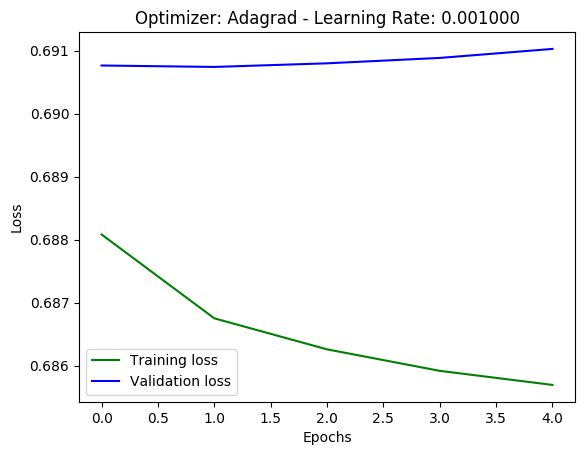

The training accuracy is: 0.5577580332756042
The training loss is: 0.6866245624632845
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6866 - accuracy: 0.5637 - val_loss: 0.6930 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6856 - accuracy: 0.5637 - val_loss: 0.6919 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 2s 912us/sample - loss: 0.6854 - accuracy: 0.5637 - val_loss: 0.6917 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6854 - accuracy: 0.5637 - val_loss: 0.6915 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 243us/sample - loss: 0.6868 - accuracy: 0.5578


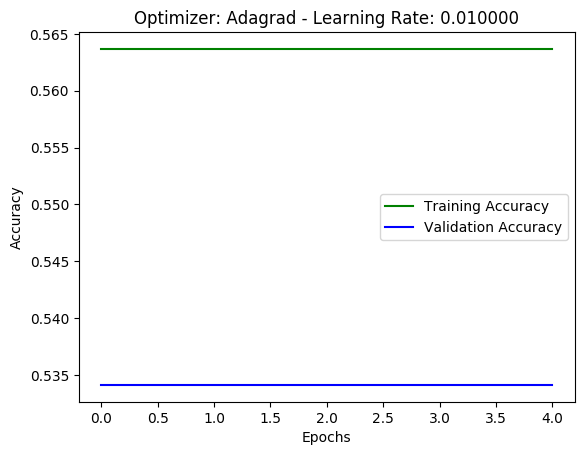

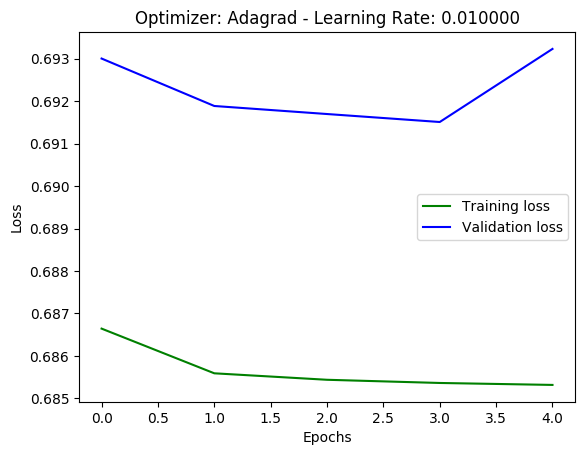

The training accuracy is: 0.5577580332756042
The training loss is: 0.6867534263200819
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6869 - accuracy: 0.5620 - val_loss: 0.6944 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6864 - accuracy: 0.5637 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6859 - accuracy: 0.5637 - val_loss: 0.6911 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6856 - accuracy: 0.5637 - val_loss: 0.6909 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 305us/sample - loss: 0.6878 - accuracy: 0.5578


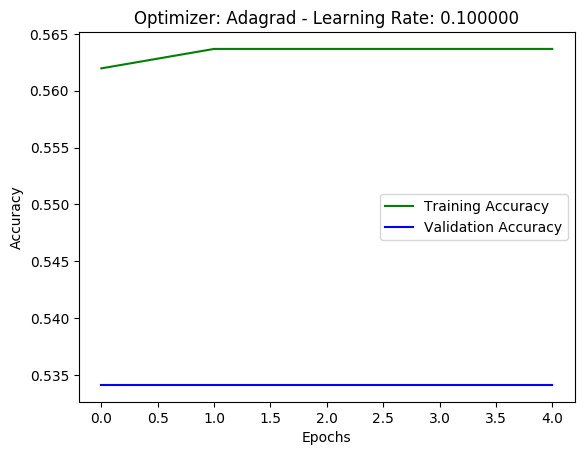

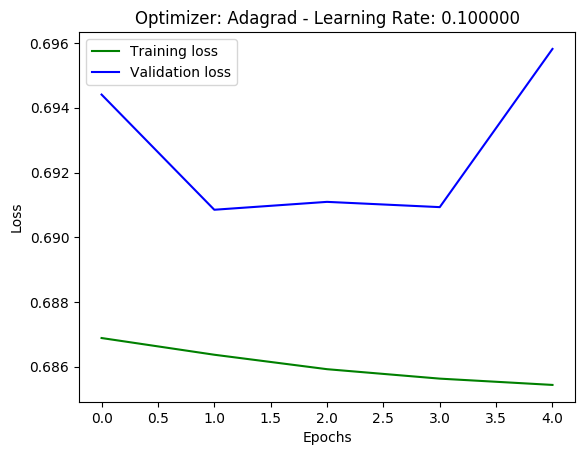

The training accuracy is: 0.5577580332756042
The training loss is: 0.6878226692352243
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 6s 2ms/sample - loss: 0.6991 - accuracy: 0.5474 - val_loss: 0.7091 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6905 - accuracy: 0.5483 - val_loss: 0.7095 - val_accuracy: 0.4659
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6893 - accuracy: 0.5585 - val_loss: 0.6988 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6884 - accuracy: 0.5543 - val_loss: 0.6941 - val_accuracy: 0.4659
Epoch 5/5
2926/2926 [==============================] - 1s 263us/sample - loss: 0.6977 - accuracy: 0.5578


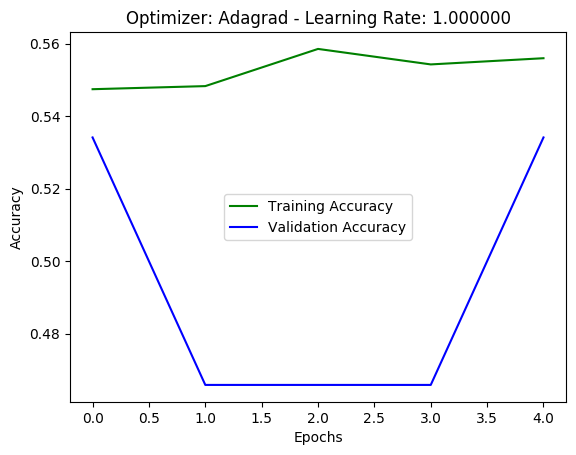

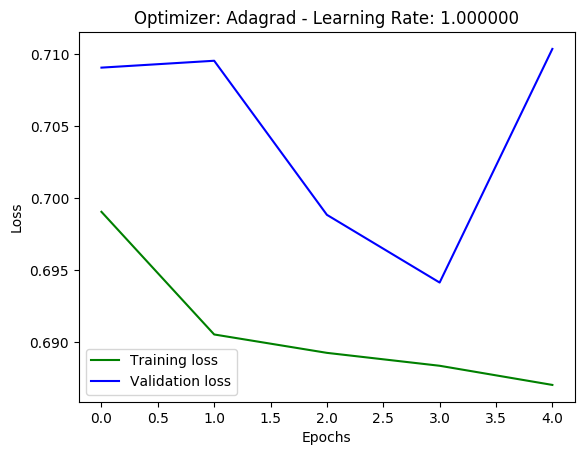

The training accuracy is: 0.5577580332756042
The training loss is: 0.6976823737094928
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6918 - accuracy: 0.5393 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6881 - accuracy: 0.5637 - val_loss: 0.6907 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6870 - accuracy: 0.5637 - val_loss: 0.6907 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6865 - accuracy: 0.5637 - val_loss: 0.6907 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 351us/sample - loss: 0.6869 - accuracy: 0.5578


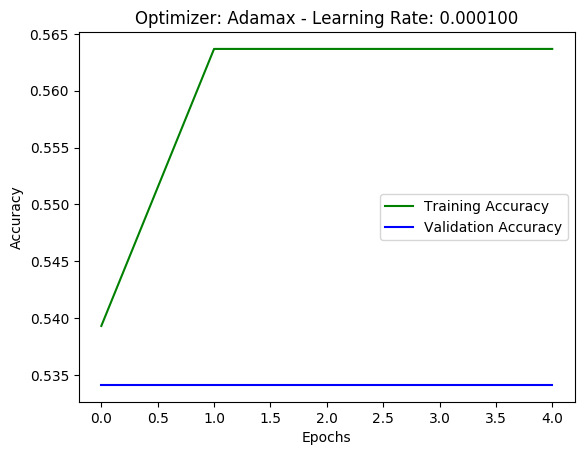

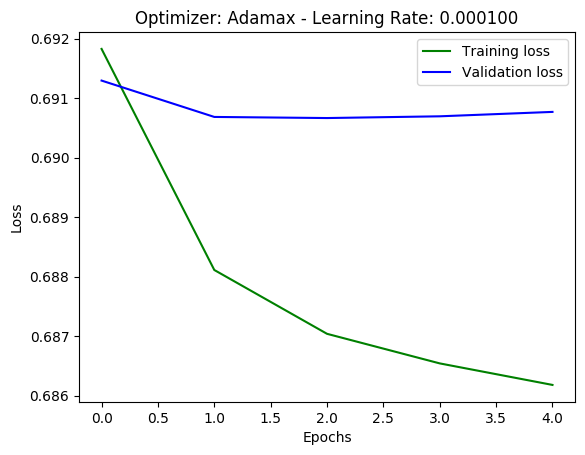

The training accuracy is: 0.5577580332756042
The training loss is: 0.6869409634736166
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6859 - accuracy: 0.5620 - val_loss: 0.6929 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 942us/sample - loss: 0.6856 - accuracy: 0.5637 - val_loss: 0.6925 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6851 - accuracy: 0.5637 - val_loss: 0.6920 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 2s 966us/sample - loss: 0.6850 - accuracy: 0.5637 - val_loss: 0.6918 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 318us/sample - loss: 0.6863 - accuracy: 0.5578


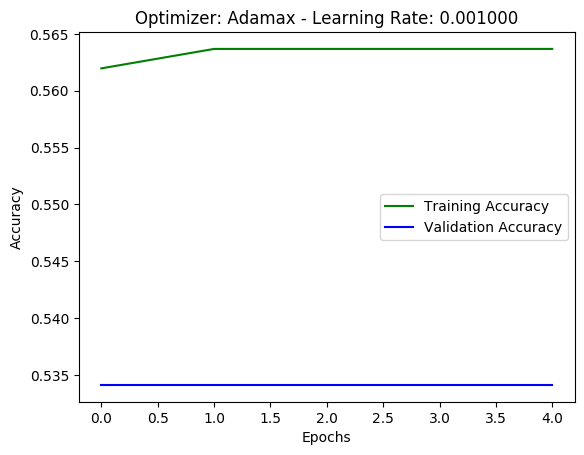

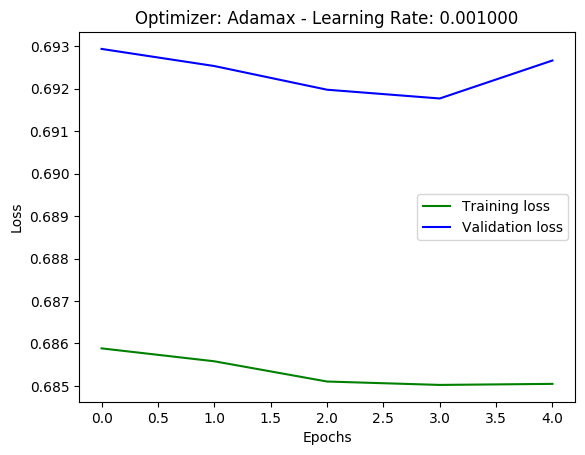

The training accuracy is: 0.5577580332756042
The training loss is: 0.6862841677926456
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6872 - accuracy: 0.5645 - val_loss: 0.6923 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6931 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6846 - accuracy: 0.5628 - val_loss: 0.6935 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6828 - accuracy: 0.5637 - val_loss: 0.6914 - val_accuracy: 0.5358
Epoch 5/5
2926/2926 [==============================] - 1s 317us/sample - loss: 0.6836 - accuracy: 0.5581


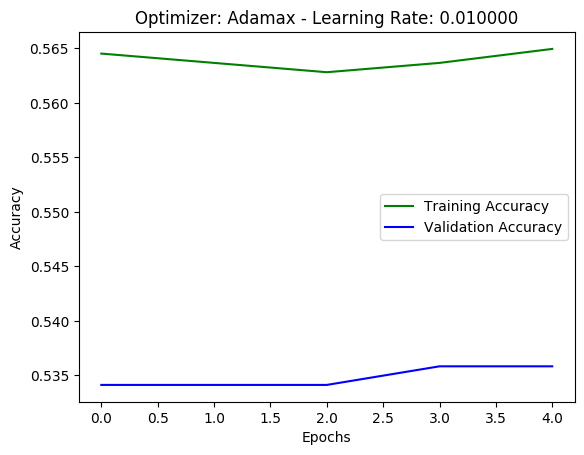

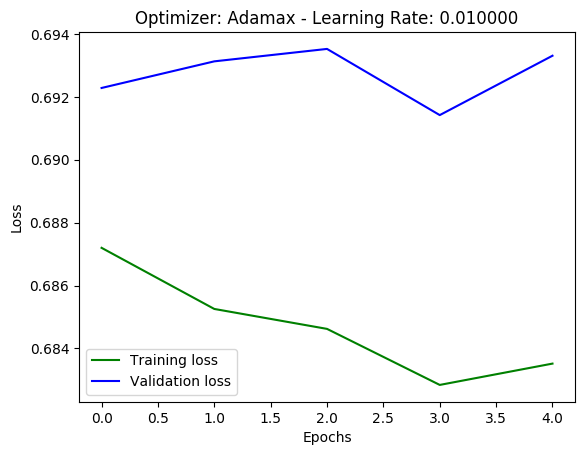

The training accuracy is: 0.5580998063087463
The training loss is: 0.6835978369719348
The test accuracy is: 0.5259562841530054
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 6s 2ms/sample - loss: 0.7528 - accuracy: 0.5462 - val_loss: 0.6923 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6863 - accuracy: 0.5637 - val_loss: 0.6923 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 2s 954us/sample - loss: 0.6860 - accuracy: 0.5637 - val_loss: 0.6927 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6856 - accuracy: 0.5637 - val_loss: 0.6909 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 294us/sample - loss: 0.6882 - accuracy: 0.5578


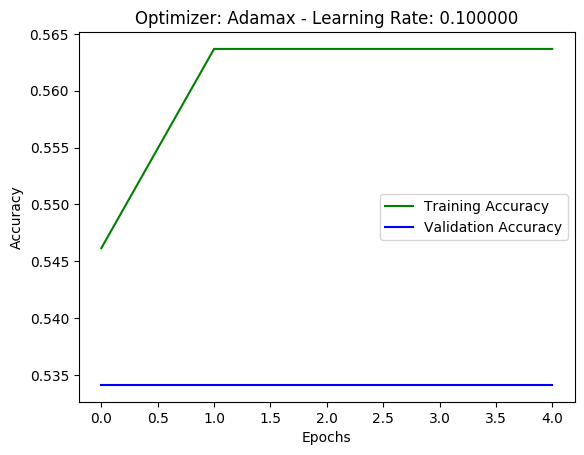

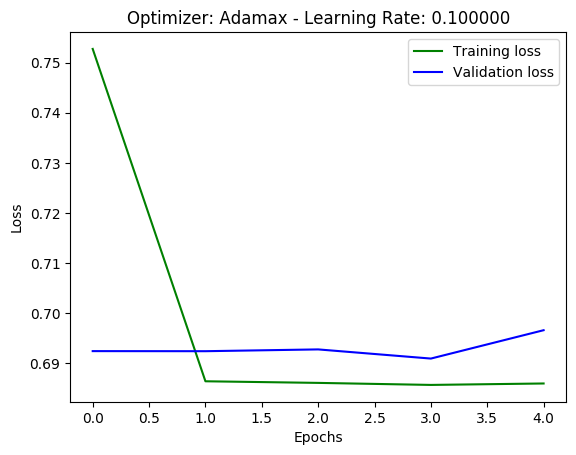

The training accuracy is: 0.5577580332756042
The training loss is: 0.688158818164755
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 6s 2ms/sample - loss: 12.7189 - accuracy: 0.5175 - val_loss: 0.7017 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6930 - accuracy: 0.5483 - val_loss: 0.6946 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6907 - accuracy: 0.5449 - val_loss: 0.6915 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6878 - accuracy: 0.5466 - val_loss: 0.6957 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 252us/sample - loss: 0.6966 - accuracy: 0.4422


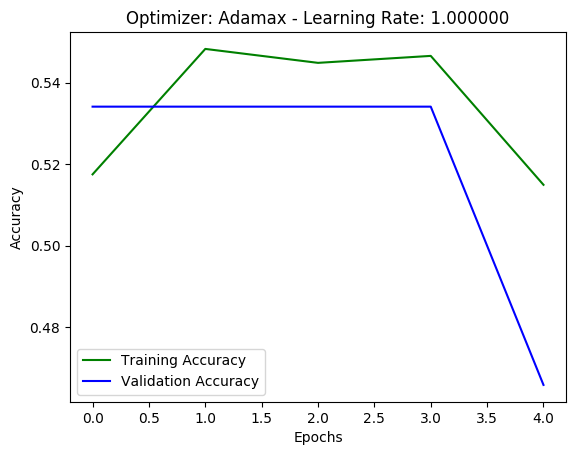

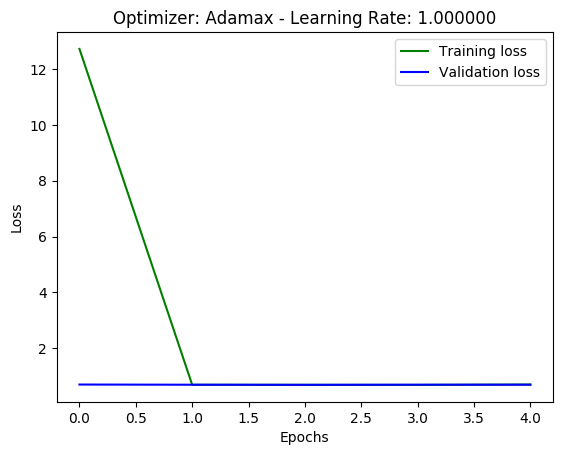

The training accuracy is: 0.44224196672439575
The training loss is: 0.6966089090499173
The test accuracy is: 0.47540983606557374
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 7s 3ms/sample - loss: 0.6921 - accuracy: 0.5226 - val_loss: 0.6909 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6870 - accuracy: 0.5637 - val_loss: 0.6907 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6859 - accuracy: 0.5637 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6855 - accuracy: 0.5637 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 253us/sample - loss: 0.6865 - accuracy: 0.5578


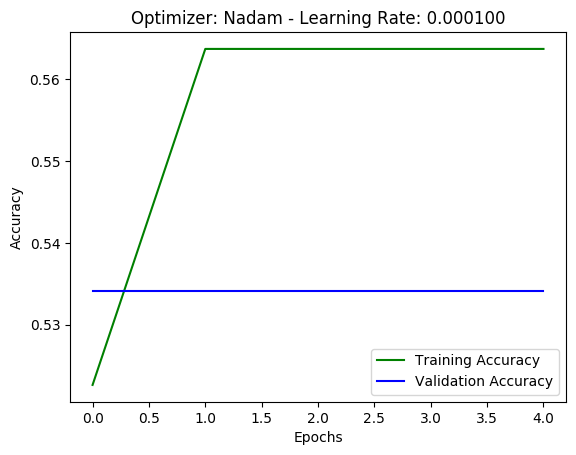

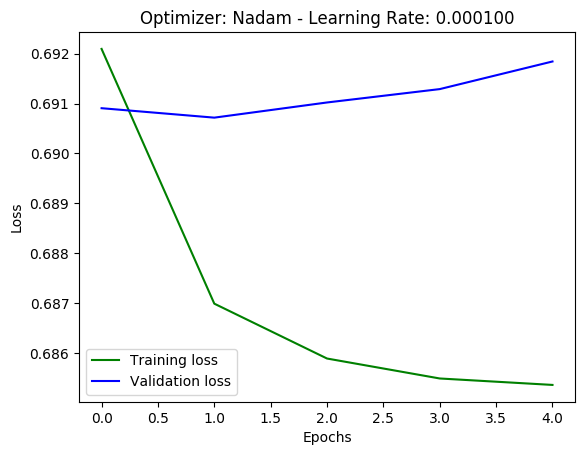

The training accuracy is: 0.5577580332756042
The training loss is: 0.6864795444440288
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 6s 3ms/sample - loss: 0.6863 - accuracy: 0.5637 - val_loss: 0.6930 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6857 - accuracy: 0.5637 - val_loss: 0.6913 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6853 - accuracy: 0.5637 - val_loss: 0.6914 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6847 - accuracy: 0.5637 - val_loss: 0.6915 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 263us/sample - loss: 0.6852 - accuracy: 0.5578


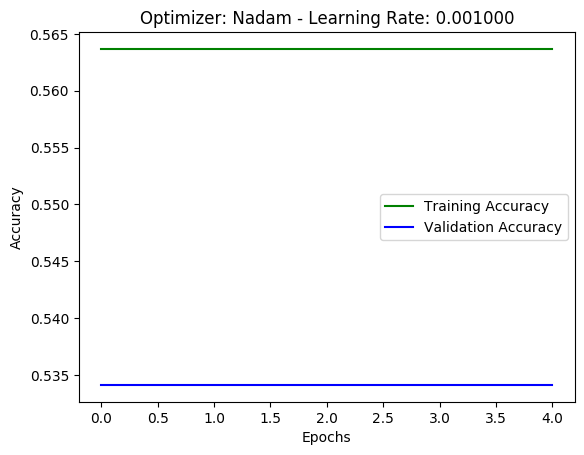

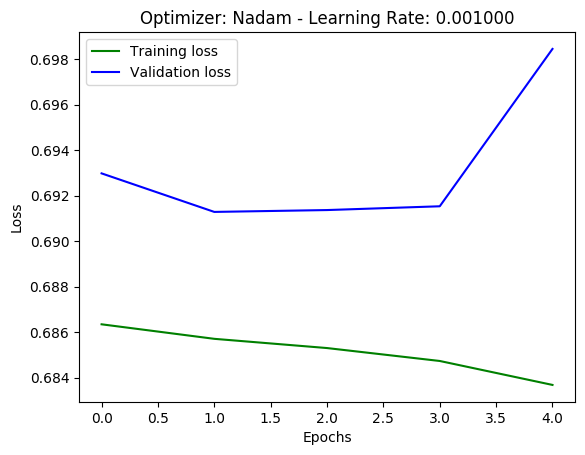

The training accuracy is: 0.5577580332756042
The training loss is: 0.685228834637859
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6868 - accuracy: 0.5615 - val_loss: 0.6935 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6876 - accuracy: 0.5611 - val_loss: 0.6911 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6858 - accuracy: 0.5637 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6855 - accuracy: 0.5637 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 270us/sample - loss: 0.6875 - accuracy: 0.5578


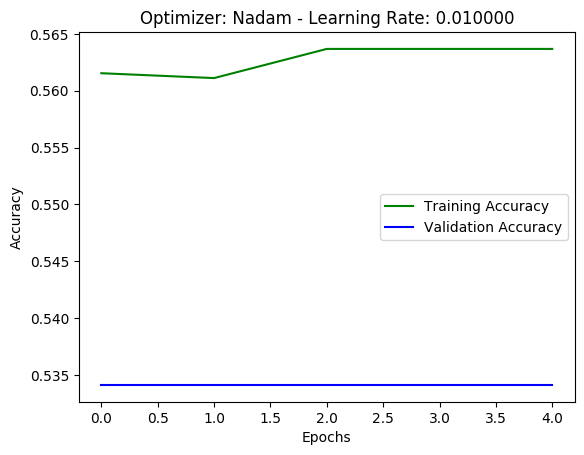

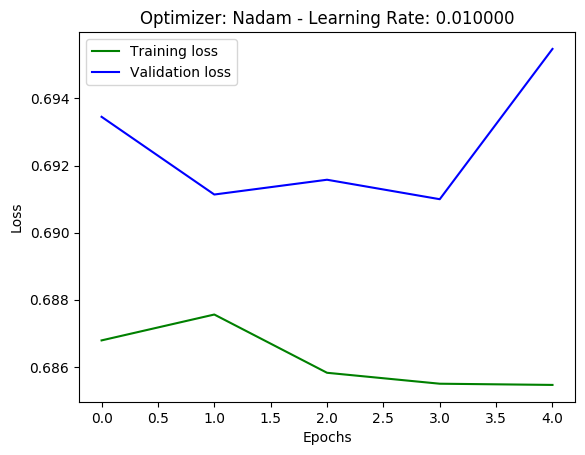

The training accuracy is: 0.5577580332756042
The training loss is: 0.6874843537196343
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.9301 - accuracy: 0.5415 - val_loss: 0.6960 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6882 - accuracy: 0.5637 - val_loss: 0.6927 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6880 - accuracy: 0.5637 - val_loss: 0.6947 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 2s 1ms/sample - loss: 0.6881 - accuracy: 0.5543 - val_loss: 0.6927 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 307us/sample - loss: 0.6971 - accuracy: 0.5578


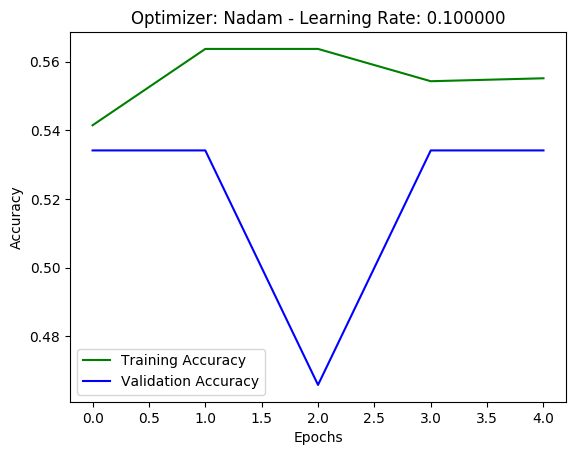

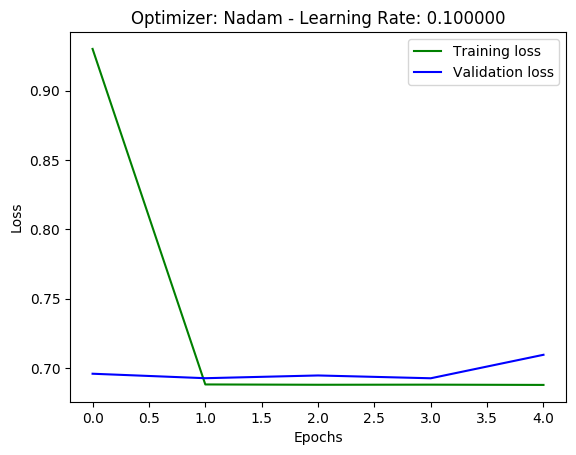

The training accuracy is: 0.5577580332756042
The training loss is: 0.697126433569034
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 8.8130 - accuracy: 0.5231 - val_loss: 0.8467 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 957us/sample - loss: 0.7365 - accuracy: 0.5278 - val_loss: 1.8954 - val_accuracy: 0.4659
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.7549 - accuracy: 0.4996 - val_loss: 0.9902 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.7507 - accuracy: 0.4979 - val_loss: 1.1296 - val_accuracy: 0.4659
Epoch 5/5
2926/2926 [==============================] - 1s 263us/sample - loss: 0.7980 - accuracy: 0.5578


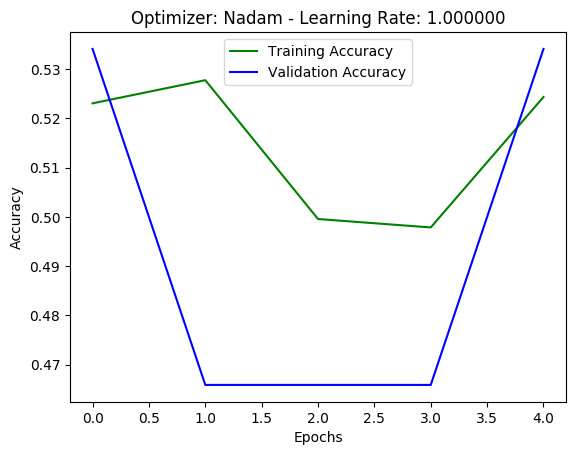

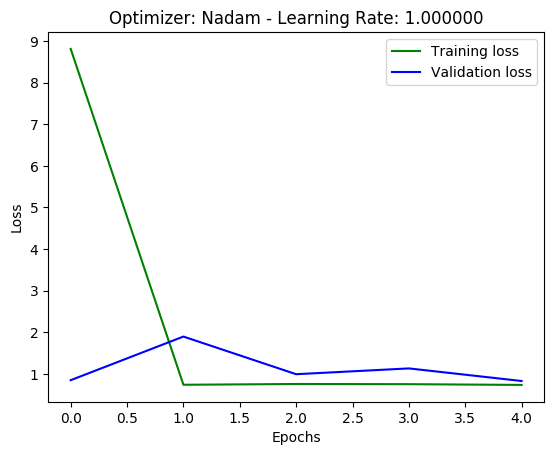

The training accuracy is: 0.5577580332756042
The training loss is: 0.7980394408218843
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 6s 2ms/sample - loss: 0.6930 - accuracy: 0.5637 - val_loss: 0.6931 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6930 - accuracy: 0.5637 - val_loss: 0.6931 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6930 - accuracy: 0.5637 - val_loss: 0.6931 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 5s 2ms/sample - loss: 0.6930 - accuracy: 0.5637 - val_loss: 0.6930 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 262us/sample - loss: 0.6929 - accuracy: 0.5578


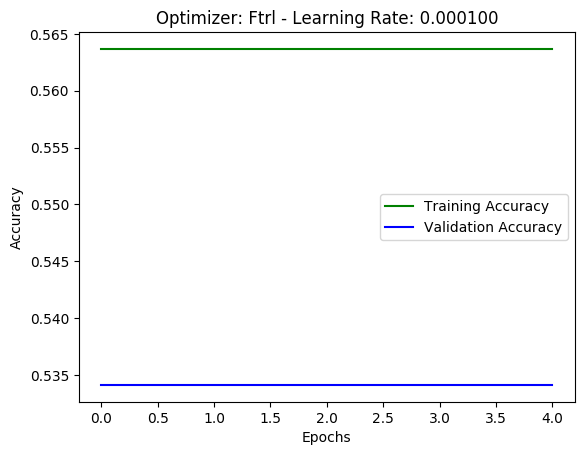

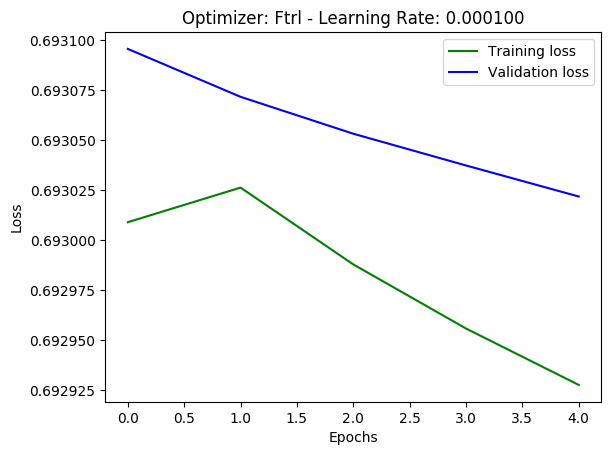

The training accuracy is: 0.5577580332756042
The training loss is: 0.6929339207938006
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 11s 4ms/sample - loss: 0.6925 - accuracy: 0.5637 - val_loss: 0.6927 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 6s 3ms/sample - loss: 0.6920 - accuracy: 0.5637 - val_loss: 0.6925 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 6s 2ms/sample - loss: 0.6917 - accuracy: 0.5637 - val_loss: 0.6923 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 6s 3ms/sample - loss: 0.6914 - accuracy: 0.5637 - val_loss: 0.6922 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 2s 620us/sample - loss: 0.6913 - accuracy: 0.5578


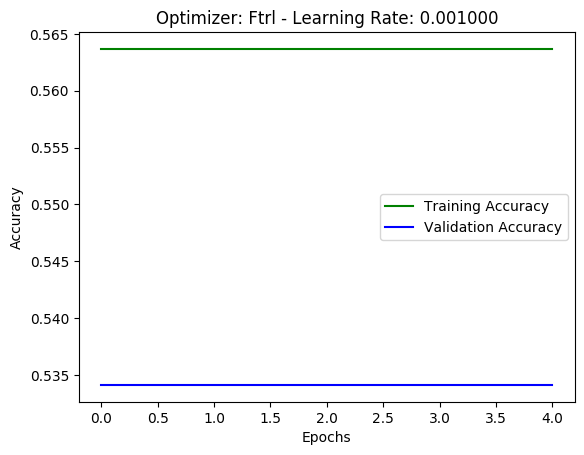

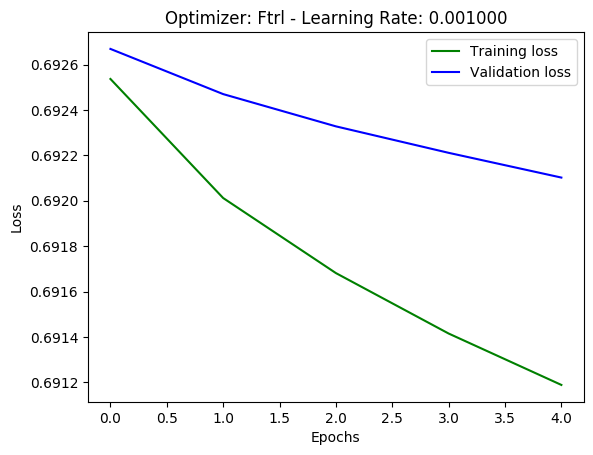

The training accuracy is: 0.5577580332756042
The training loss is: 0.6912716772975126
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 7s 3ms/sample - loss: 0.6894 - accuracy: 0.5620 - val_loss: 0.6908 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6867 - accuracy: 0.5637 - val_loss: 0.6909 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6861 - accuracy: 0.5637 - val_loss: 0.6910 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6857 - accuracy: 0.5637 - val_loss: 0.6911 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 321us/sample - loss: 0.6866 - accuracy: 0.5578


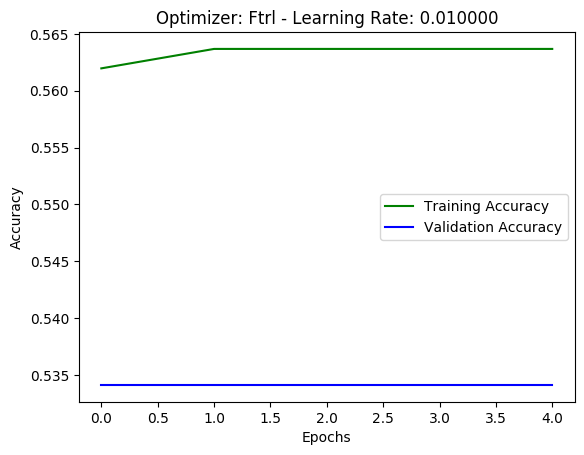

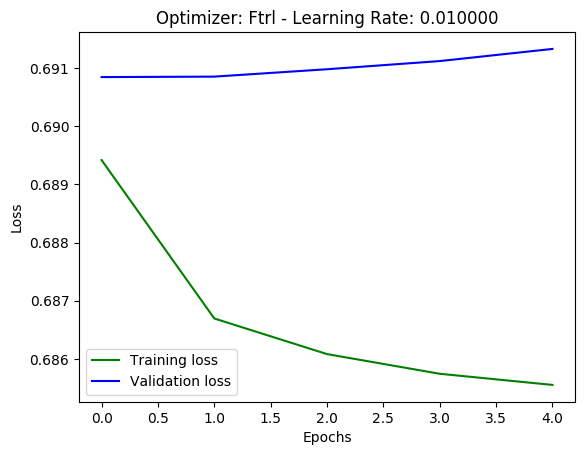

The training accuracy is: 0.5577580332756042
The training loss is: 0.6865800558828118
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6862 - accuracy: 0.5637 - val_loss: 0.6940 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 950us/sample - loss: 0.6858 - accuracy: 0.5637 - val_loss: 0.6917 - val_accuracy: 0.5341
Epoch 3/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6855 - accuracy: 0.5637 - val_loss: 0.6916 - val_accuracy: 0.5341
Epoch 4/5
2340/2340 [==============================] - 3s 1ms/sample - loss: 0.6854 - accuracy: 0.5637 - val_loss: 0.6914 - val_accuracy: 0.5341
Epoch 5/5
2926/2926 [==============================] - 1s 219us/sample - loss: 0.6870 - accuracy: 0.5578


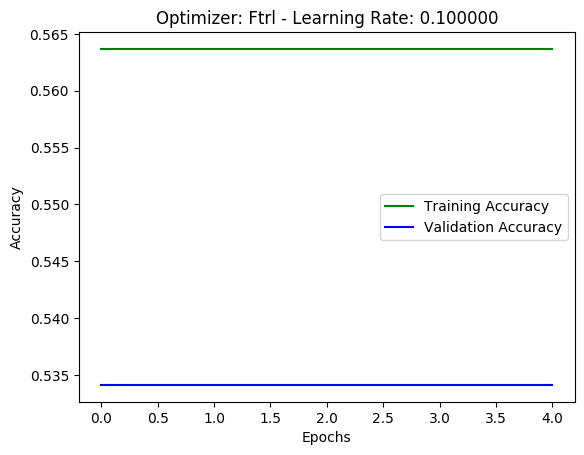

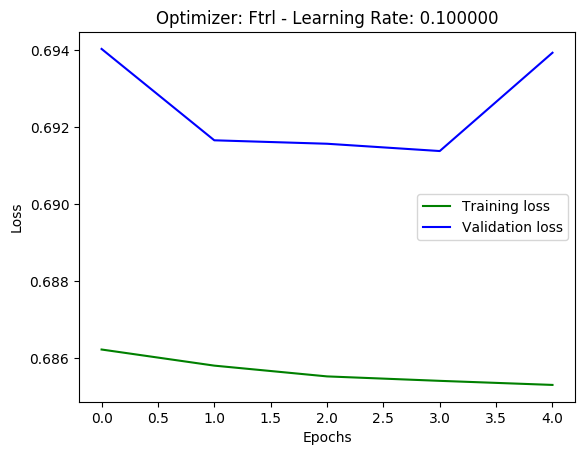

The training accuracy is: 0.5577580332756042
The training loss is: 0.686955624586576
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE

Train on 2340 samples, validate on 586 samples
Epoch 1/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6932 - accuracy: 0.5487 - val_loss: 0.7129 - val_accuracy: 0.5341
Epoch 2/5
2340/2340 [==============================] - 2s 951us/sample - loss: 0.6910 - accuracy: 0.5474 - val_loss: 0.7121 - val_accuracy: 0.4659
Epoch 3/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6895 - accuracy: 0.5585 - val_loss: 0.6995 - val_accuracy: 0.4659
Epoch 4/5
2340/2340 [==============================] - 4s 2ms/sample - loss: 0.6885 - accuracy: 0.5543 - val_loss: 0.6944 - val_accuracy: 0.4659
Epoch 5/5
2926/2926 [==============================] - 1s 425us/sample - loss: 0.6981 - accuracy: 0.5578


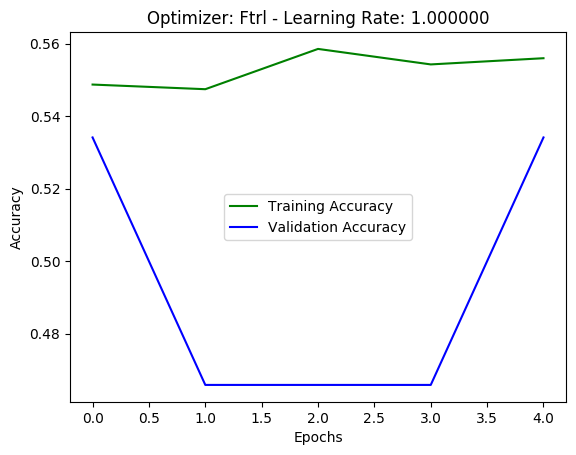

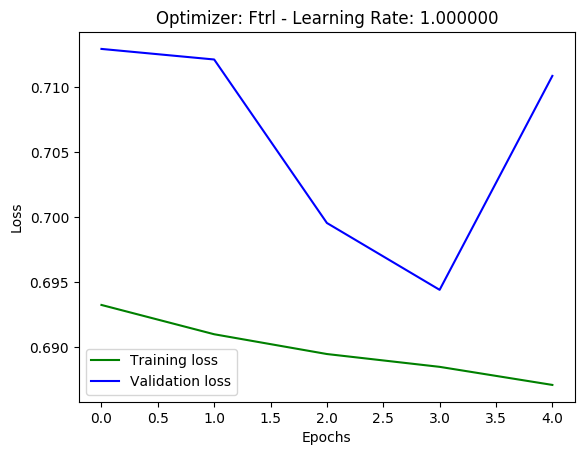

The training accuracy is: 0.5577580332756042
The training loss is: 0.6980524605378172
The test accuracy is: 0.5245901639344263
Train RMSE: 0.83 RMSE
Test RMSE: 0.83 RMSE



In [ ]:
# List of optimizers and learning rates to be looped through
list_optimizers = ['Adam', 'SGD', 'Adadelta', 'RMSprop', 'Adagrad', 'Adamax', 'Nadam', 'Ftrl']
learning_rates = [0.0001, 0.001, 0.01, 0.1, 1.0]

# Number of epochs per model
nn_epochs = 5

# Validation Split
val_split = 0.2

# Initializing a DataFrame to save each model results
nn_results = pd.DataFrame()

# Loop
for opt in list_optimizers:
    for lr in learning_rates:
        
        # Building a multilayer neural network using Keras
        rnn = Sequential()
        rnn.add(Reshape((70, 1), input_shape = (70,)))
        #rnn.add(LSTM(70, input_shape = (10, 1), return_sequences= True))
        rnn.add(LSTM(70, input_shape = (10, 1)))
        rnn.add(Dense(35, activation = 'relu'))
        #rnn.add(LSTM(200, return_sequences= True))
        #rnn.add(GRU(50))
        rnn.add(Dense(2, activation = 'softmax'))
        
        # Compile the model to provide the training parameters
        rnn.compile(optimizer = select_optimizer(opt, lr), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
        #model.compile(optimizer = select_optimizer(opt, lr), loss = 'binary_crossentropy', metrics = ['accuracy'])
        #model.compile(optimizer = select_optimizer(opt, lr), loss = 'categorical_crossentropy', metrics = ['accuracy'])
        
        # Train the model
        nn_history = rnn.fit(X_train, y_train, epochs = nn_epochs, verbose = 1, validation_split = val_split)
        
        # Evaluate the trained model
        nn_eval = rnn.evaluate(X_train, y_train)
        
        # Predicting using the testing data
        y_test_pred = rnn.predict_classes(X_test)
        test_accuracy = accuracy_score(y_test, y_test_pred)
        
        # New row for results dataframe containing model hyperparameters and results
        new_row = {'epochs': nn_epochs,
                   'validation_split': val_split,
                   'training accuracy': nn_eval[1],
                   'training loss': nn_eval[0],
                   'testing accuracy': test_accuracy,
                   'optimizer': str(opt),
                   'learning_rate': lr
                   }
        nn_results = nn_results.append(new_row, ignore_index = True)
        
        # Plot Accuracy
        loss_train = nn_history.history['accuracy']
        loss_val = nn_history.history['val_accuracy']
        epochs = range(0, nn_epochs)
        plt.plot(epochs, loss_train, 'g', label = 'Training Accuracy')
        plt.plot(epochs, loss_val, 'b', label = 'Validation Accuracy')
        plt.title("Optimizer: %s - Learning Rate: %f" % (opt, lr))
        #plt.title('Training and Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.show()
        
        # Plot Loss
        loss_train = nn_history.history['loss']
        loss_val = nn_history.history['val_loss']
        epochs = range(0, nn_epochs)
        plt.plot(epochs, loss_train, 'g', label = 'Training loss')
        plt.plot(epochs, loss_val, 'b', label = 'Validation loss')
        plt.title("Optimizer: %s - Learning Rate: %f" % (opt, lr))
        #plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()
        
        # Printing metrics
        print(f"The training accuracy is: {nn_eval[1]}")
        print(f"The training loss is: {nn_eval[0]}")
        print(f"The test accuracy is: {test_accuracy}")
        get_rmse(model)
        print()